In [7]:
import numpy as np
import pandas as pd
from shutil import copyfile
# from astropy.cosmology import Planck13 as cosmo
from astropy.cosmology import FlatLambdaCDM
cosmo = FlatLambdaCDM(H0=70, Om0=0.3)
from astropy.cosmology import z_at_value
import fsps
from matplotlib import gridspec
import matplotlib as mpl
from astropy.io import fits
from astropy import wcs
from astropy.table import Table
import astropy.units as u
from sim_engine import Scale_model
from spec_tools import Source_present, Oldest_galaxy, Sig_int, Smooth, Rescale_sfh, \
    lbt_to_z, boot_to_posterior, age_to_z, Posterior_spec
from spec_stats import Smooth, Highest_density_region, Linear_fit
from spec_id import *
from spec_id_2d import Gen_temp_dict_addline
from spec_stats import Highest_density_region, Linear_fit
from spec_exam import Gen_spec
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d, interp2d
from glob import glob
import seaborn as sea
import os
from grizli import multifit
from grizli import model
from grizli.utils import SpectrumTemplate
from sim_engine import forward_model_grism
from scipy import stats
import pickle
from spec_tools import Gen_SFH
from spec_tools import Photometry
from spec_stats import Iterative_stacking
import linmix
import warnings
warnings.filterwarnings('ignore')

from time import time
sea.set(style='white')
sea.set(style='ticks')
sea.set_style({'xtick.direct'
               'ion': 'in','xtick.top':True,'xtick.minor.visible': True,
               'ytick.direction': "in",'ytick.right': True,'ytick.minor.visible': True})
cmap = sea.cubehelix_palette(12, start=2, rot=.2, dark=0, light=1.0, as_cmap=True)
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

### set home for files
hpath = os.environ['HOME'] + '/'

if hpath == '/Users/Vince.ec/':
    dpath = '/Volumes/Vince_research/Data/' 
    
else:
    dpath = hpath + 'Data/' 
    
from astropy.cosmology import FlatLambdaCDM
cosmo = FlatLambdaCDM(H0=70, Om0=0.3)

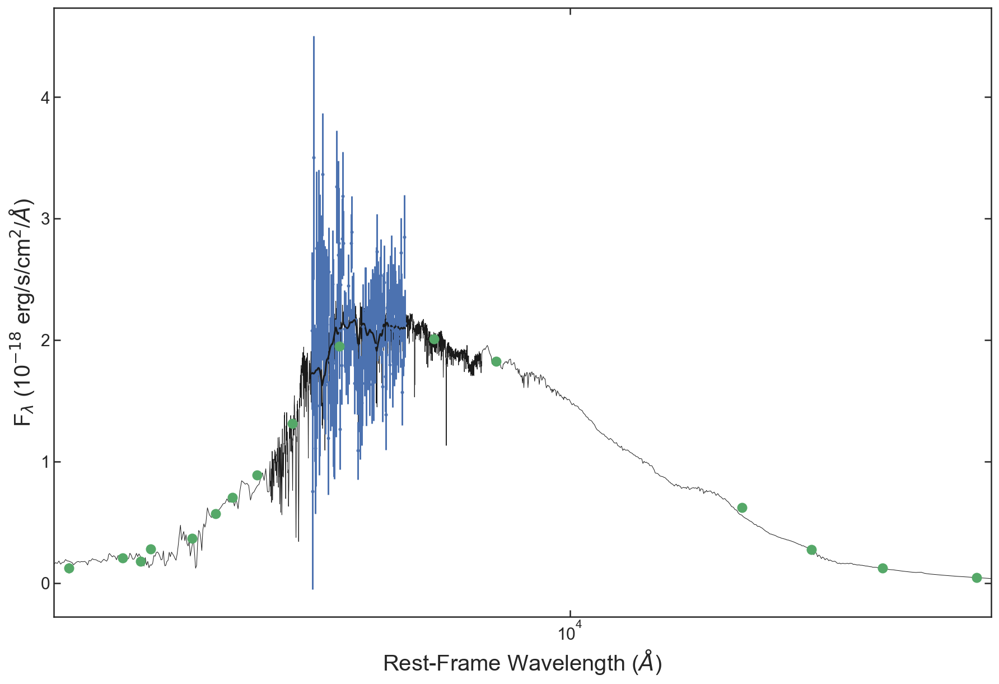

In [24]:
#check best fits
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
# gids = [13453,14281,15876,21683,24345,36102,36161,38102,29730,38785,42201]
#29730, 14281, 15876
i=Adb.query('id == 36161').index[0]

plt.figure(figsize = [15,10])
gids = Adb.id[i]
ax1 = plt.subplot()

fld = Adb.query('id == {}'.format(gids)).field.values[0]
gal = Adb.query('id == {}'.format(gids)).id.values[0]

fitdb = np.load(glob('../data/temp_nfits/fits/{}_{}*fit*.npy'.format(fld, gal))[0], allow_pickle=True).item()
try:
    rshift = fitdb['bfz']
except:
    rshift = Adb.query('field == "{}" and id == {}'.format(fld, gal)).zgrism.values[0]
    
# lssfr = fitdb.
# lmass = fitdb.lmass.values[0]

sp = np.load('../data/temp_nfits/fits/{}_{}_fullspec.npy'.format(fld, gal), allow_pickle=True).item()
# rshift = Adb.query('field == "{}" and id == {}'.format(fld, gal)).zgrism.values[0]

if len(sp['Bwv']) > 0:
    IDX = [U for U in range(len(sp['Bwv'])) if 8200 < sp['Bwv'][U] < 15000]
    ax1.errorbar(sp['Bwv'][IDX]/(1+rshift), sp['Bfl'][IDX]*1E18, sp['Ber'][IDX]*1E18, fmt = 'bo' ,markersize=2)
    ax1.plot(sp['Bwv'][IDX]/(1+rshift), sp['Bmfl'][IDX]*1E18, 'k',
             label = '{}-{}'.format(fld, gal))

if len(sp['Rwv']) > 0:
    ax1.errorbar(sp['Rwv']/(1+rshift), sp['Rfl']*1E18, sp['Rer']*1E18, fmt = 'ro' ,markersize=2)
    ax1.plot(sp['Rwv']/(1+rshift), sp['Rmfl']*1E18, 'k')


ax1.plot(sp['wave'], sp['flam']*1E18,'k', linewidth = 0.5,zorder = 0)
ax1.errorbar(sp['Pwv']/(1+rshift), sp['Pfl']*1E18, sp['Per']*1E18, fmt = 'go', markersize = 8, zorder=10)

# t= ax1.text(0.03,0.92, tags[i], fontsize = 15, color = 'w',transform=ax1.transAxes)
# t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

ax1.set_xlim(0.95 * min(sp['Pwv']/(1+rshift)), 1.05 * max(sp['Pwv']/(1+rshift)))
#     ax1.legend(fontsize = 15)
ax1.set_xlabel(r'Rest-Frame Wavelength ($\AA$)',size=20)
ax1.set_ylabel(r'F$_\lambda$ (10$^{-18}$ erg/s/cm$^2$/$\AA$)',size=20)
ax1.tick_params(axis='both', which='major', labelsize=15)
ax1.set_xscale('log')
ax1.minorticks_off()
# ax1.set_title('{}{}-{}, z = {:1.3f}, log(sSFR) = {:1.2f}, log(M/M$_\odot$) = {:1.2f}'.format(fld[0], fld[1], gal, rshift, lssfr, lmass),
#              fontsize = 18)


In [15]:
test['bfz']

1.017704295133969

In [2]:
CLEAR_GS = Table.read('/Volumes/Vince_CLEAR/RELEASE_v3.0.0/grizli_v3.0_cats/GDS_lines_grizli_master.fits',format = 'fits').to_pandas()
CLEAR_GN = Table.read('/Volumes/Vince_CLEAR/RELEASE_v3.0.0/grizli_v3.0_cats/GDN_lines_grizli_master.fits',format = 'fits').to_pandas()

In [469]:
CLEAR_GS.keys()

Index(['ID', 'RA', 'DEC', 'nlines', 'z_50', 'z_02', 'z_16', 'z_84', 'z_97',
       'z_MAP', 'z_RISK', 'ArIII-7138_FLUX', 'ArIII-7138_FLUX_ERR',
       'CIII-1908_FLUX', 'CIII-1908_FLUX_ERR', 'CIV-1549_FLUX',
       'CIV-1549_FLUX_ERR', 'H8_FLUX', 'H8_FLUX_ERR', 'H9_FLUX', 'H9_FLUX_ERR',
       'Ha_FLUX', 'Ha_FLUX_ERR', 'Hb_FLUX', 'Hb_FLUX_ERR', 'Hd_FLUX',
       'Hd_FLUX_ERR', 'HeI-1083_FLUX', 'HeI-1083_FLUX_ERR', 'HeI-5877_FLUX',
       'HeI-5877_FLUX_ERR', 'HeII-1640_FLUX', 'HeII-1640_FLUX_ERR', 'Hg_FLUX',
       'Hg_FLUX_ERR', 'Lya_FLUX', 'Lya_FLUX_ERR', 'MgII_FLUX', 'MgII_FLUX_ERR',
       'NIII-1750_FLUX', 'NIII-1750_FLUX_ERR', 'NIV-1487_FLUX',
       'NIV-1487_FLUX_ERR', 'NV-1240_FLUX', 'NV-1240_FLUX_ERR',
       'NeIII-3867_FLUX', 'NeIII-3867_FLUX_ERR', 'NeV-3346_FLUX',
       'NeV-3346_FLUX_ERR', 'NeVI-3426_FLUX', 'NeVI-3426_FLUX_ERR',
       'OI-6302_FLUX', 'OI-6302_FLUX_ERR', 'OII_FLUX', 'OII_FLUX_ERR',
       'OII-7325_FLUX', 'OII-7325_FLUX_ERR', 'OIII_FLUX', 'OIII_FLUX_ERR'

In [2]:
adb = pd.read_pickle('../dataframes/fitdb/evolution_db_v2.pkl')
# adb['lbt'] = cosmo.lookback_time(adb.zgrism.values).value
# Ha_EW = []
# for i in adb.index:
#     fl = glob('/Volumes/Vince_CLEAR/RELEASE_v3.0.0/fits/*{}*/*{}*'.format(adb.field[i][1], adb.id[i]))
#     try:
#         dat = fits.open(fl[0])
#         Ha_EW.append(dat['COVAR'].header['EW50_006'])
#     except:
#         Ha_EW.append(-99)
        
        
# Ha_EW_sig = []
# for i in adb.index:
#     fl = glob('/Volumes/Vince_CLEAR/RELEASE_v3.0.0/fits/*{}*/*{}*'.format(adb.field[i][1], adb.id[i]))
#     try:
#         dat = fits.open(fl[0])
#         Ha_EW_sig.append((dat['COVAR'].header['EW84_006']-dat['COVAR'].header['EW16_006'])/2)
#     except:
#         Ha_EW_sig.append(-99)

# adb['Ha_EW'] = Ha_EW
# adb['Ha_EW_sig'] = Ha_EW_sig

# adb['scl_tq'] = (adb.t_50-adb.t_90)\
#     / cosmo.age(adb.zgrism).value

# Adb = adb.query('AGN != "AGN" and lmass > 10 and 0.7 < zgrism < 2.7 and id != 30081')
Adb = adb.query('AGN != "AGN" and lmass > 10.25 and 0.7 < zgrism < 1.65')

Xdb = adb.query('AGN == "AGN" and  lmass > 10.25 and 0.7 < zgrism < 1.65')

Ldb = Adb.query('lmass < 10.7')
Hdb = Adb.query('lmass > 10.7')
LXdb = Xdb.query('lmass < 10.7')
HXdb = Xdb.query('lmass > 10.7')

for i in Adb.index:
    fname = glob('../data/posterior_cat/{}_{}*'.format(Adb.field[i], Adb.id[i]))

    fit_db = np.load(fname[0], allow_pickle = True).item()    
    m, hdr, mn = Highest_density_region(fit_db['Pssfr'],fit_db['ssfr'])
    Adb.log_ssfr[i] = m
    Adb.log_ssfr_hdr[i] = hdr


In [8]:
adb = pd.read_pickle('../dataframes/fitdb/evolution_db_v2.pkl')
Adb = pd.read_pickle('../dataframes/fitdb/evolution_db_masslim.pkl')
Adb = Adb.query('id != 44707')
Adb = Adb.query('id != [15998,16072,19319,23520,34708,9594,24062,46924]')
Ldb = Adb.query('lmass < 10.8')
Hdb = Adb.query('lmass > 10.8')

In [353]:
len(Adb)

454

In [4]:
Adb['log_sfr'] = np.log10(10**Adb.log_ssfr * 10**Adb.lmass).values 

In [22]:
Adb['concen'] = np.log10(Adb.Sigma1 / 10**Adb.lmass).values

In [26]:
Adb['z50'] = cosmo.lookback_time(Adb['z_50']).value

In [28]:
Adb['log_Z'] = np.log10(Adb['Z'].values)

In [29]:
Adb['log_Sigma1'] = np.log10(Adb['Sigma1'].values)

In [32]:
Adb['t_q']= Adb['t_50'].values - Adb['t_90'].values

In [11]:
Adb.to_pickle('../dataframes/fitdb/evolution_db_masslim.pkl')


In [12]:
params = ['Av','Ra','Ra_f125','Ra_f125_sig','Ra_f160','Ra_f160_sig','Ra_nsig','Ra_sig','Re','Re_f125','Re_f125_sig','Re_f160','Re_f160_sig','Re_nsig','Re_sig',
 'Rm','Rm_f125','Rm_f125_sig','Rm_f160','Rm_f160_sig','Rm_nsig','Rm_sig','Sigma1','Sigma1_f125','Sigma1_f160','Sigma1_nsig','Sigma1_sig','UV','VJ',
 'W_UVJ', 'Z', 'bfa', 'bfba', 'bfbb', 'bfbl', 'bfbp1', 'bfd', 'bflm', 'bfm', 'bfm1', 'bfm2', 'bfm3', 'bfm4', 'bfm5', 'bfm6', 'bfra', 'bfrb', 'bfrl', 
 'bfrp1', 'lmass', 'log_ssfr', 'lwa', 'lwa_r', 'lwa_u', 'mag', 'mag_f125', 'mag_f125_sig', 'mag_f160', 'mag_f160_sig', 'mag_sig', 'n', 'n_f', 'n_f125', 
 'n_f125_f', 'n_f125_sig', 'n_f160', 'n_f160_f', 'n_f160_sig', 'n_sig', 'sSFR_avg','t_50', 't_80', 't_90', 'z500', 'z_50', 'z_80', 'z_90', 'zfit', 
 'zgrism', 'bfm7', 'bfm8', 'bfm9', 'bfm10', 'bfz', 'Hd', 'Hg', 'Hb', 'Ha', 'OII', 'OIII', 'SII', 'Hd_sig', 'Hg_sig', 'Hb_sig', 'Ha_sig', 'OII_sig', 
 'OIII_sig', 'SII_sig', 't_q', 'log_Sigma1', 'log_Re', 'log_Z', 'z50', 'concen', 'log_sfr', 'lbt', 'Ha_EW', 'Ha_EW_sig', 'scl_tq', 'sf_prob_ml']

In [15]:
for i in params:
    if not i in ['W_UVJ']:
        for ii in Adb.index:
            if not Adb[i][ii]**2 > 0:
                print(i)

Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig
Ra_nsig


In [476]:
v4N.mass

0       -9.990000e+02
1       -9.990000e+02
2       -9.990000e+02
3       -9.990000e+02
4       -9.990000e+02
             ...     
38274    2.327911e+09
38275    4.571042e+07
38276    2.676818e+09
38277    2.783719e+11
38278   -9.990000e+02
Name: mass, Length: 38279, dtype: float64

In [5]:
Nz=[]
Nlm = []
for i in CLEAR_GN.ID:
    if v4N.query('id == {}'.format(i)).star.values[0] < 0.8 and v4N.query('id == {}'.format(i)).use.values[0] == True:
        Nz.append(CLEAR_GN.query('ID == {}'.format(i)).z_50.values[0])
        Nlm.append(np.log10(v4N.query('id == {}'.format(i)).mass.values[0]))
        
Sz=[]
Slm = []
for i in CLEAR_GS.ID:
    if v4S.query('id == {}'.format(i)).star.values[0] < 0.8 and v4S.query('id == {}'.format(i)).use.values[0] == True:
        Sz.append(CLEAR_GS.query('ID == {}'.format(i)).z_50.values[0])
        Slm.append(np.log10(v4S.query('id == {}'.format(i)).mass.values[0]))

In [4]:
v4N = Table.read(fits.open('/Volumes/Vince_CLEAR/3dhst_V4.4/goodsn_3dhst.v4.4.cats/Eazy/goodsn_3dhst.v4.4.zout.fits'),
                 format='fits').to_pandas()
v4S = Table.read(fits.open('/Volumes/Vince_CLEAR/3dhst_V4.4/goodss_3dhst.v4.4.cats/Eazy/goodss_3dhst.v4.4.zout.fits'),
                 format='fits').to_pandas()

v4Ncat = Table.read('/Volumes/Vince_CLEAR/3dhst_V4.4/goodsn_3dhst.v4.4.cats/Catalog/goodsn_3dhst.v4.4.cat',
                 format='ascii').to_pandas()
v4Scat = Table.read('/Volumes/Vince_CLEAR/3dhst_V4.4/goodss_3dhst.v4.4.cats/Catalog/goodss_3dhst.v4.4.cat',
                 format='ascii').to_pandas()

v4N['use'] = v4Ncat['use_phot']
v4S['use'] = v4Scat['use_phot']

v4N['star'] = v4Ncat['class_star']
v4S['star'] = v4Scat['class_star']

v4N['f125'] = v4Ncat['f_F125W']
v4S['f125'] = v4Scat['f_F125W']

v4N['f160'] = v4Ncat['f_F160W']
v4S['f160'] = v4Scat['f_F160W']

CLEAR_GS = Table.read('/Volumes/Vince_CLEAR/RELEASE_v3.0.0/grizli_v3.0_cats/GDS_lines_grizli_master.fits',format = 'fits').to_pandas()
CLEAR_GN = Table.read('/Volumes/Vince_CLEAR/RELEASE_v3.0.0/grizli_v3.0_cats/GDN_lines_grizli_master.fits',format = 'fits').to_pandas()

allNids = CLEAR_GN.ID.values
allSids = CLEAR_GS.ID.values

Nids = np.array(list(set(allNids)))
Sids = np.array(list(set(allSids)))

Npresent = [U in Nids for U in v4N.id]
Spresent = [U in Sids for U in v4S.id]

v4N['grism'] = Npresent
v4S['grism'] = Spresent

measNids = Adb.query('field == "GND"').id.values
measSids = Adb.query('field == "GSD"').id.values

Nids = np.array(list(set(measNids)))
Sids = np.array(list(set(measSids)))

Npresent = [U in Nids for U in v4N.id]
Spresent = [U in Sids for U in v4S.id]

v4N['meas'] = Npresent
v4S['meas'] = Spresent

${\displaystyle m_{\text{AB}}=-2.5\log _{10}f_{\nu }-48.60}$

In [6]:
def ab_to_fnu(AB):
    return 10**((AB + 48.6)/(-2.5))

def fnu_to_flam(fnu, wv):
    return 3E18/wv**2*fnu

def ab_to_flam(AB, wv):
    return fnu_to_flam(ab_to_fnu(AB), wv)

In [7]:
ABFLUX = ab_to_flam(25, 10475.92199032158)

In [8]:
import fsps
sp = fsps.StellarPopulation(zcontinuous = 1, logzsol = 0, sfh = 0)

In [9]:
M=[]
z = np.linspace(0.6,2.8,10)
for i in np.linspace(0.6,2.8,10):
    wave,flux = sp.get_spectrum(tage = cosmo.age(i).value- cosmo.age(5).value, peraa = True)
    flam = F_lam_per_M(flux,wave*(1 + i), i, 0, sp.stellar_mass)
    measab = sp.get_mags(tage = cosmo.age(i).value- cosmo.age(5).value, redshift = i, bands = ['wfc3_ir_f105w'] )
    measflux = ab_to_flam(measab, 10475.92199032158)
    M.append(np.log10(ABFLUX / measflux *  sp.stellar_mass))

In [332]:
adb = pd.read_pickle('../dataframes/fitdb/evolution_db_v2.pkl')


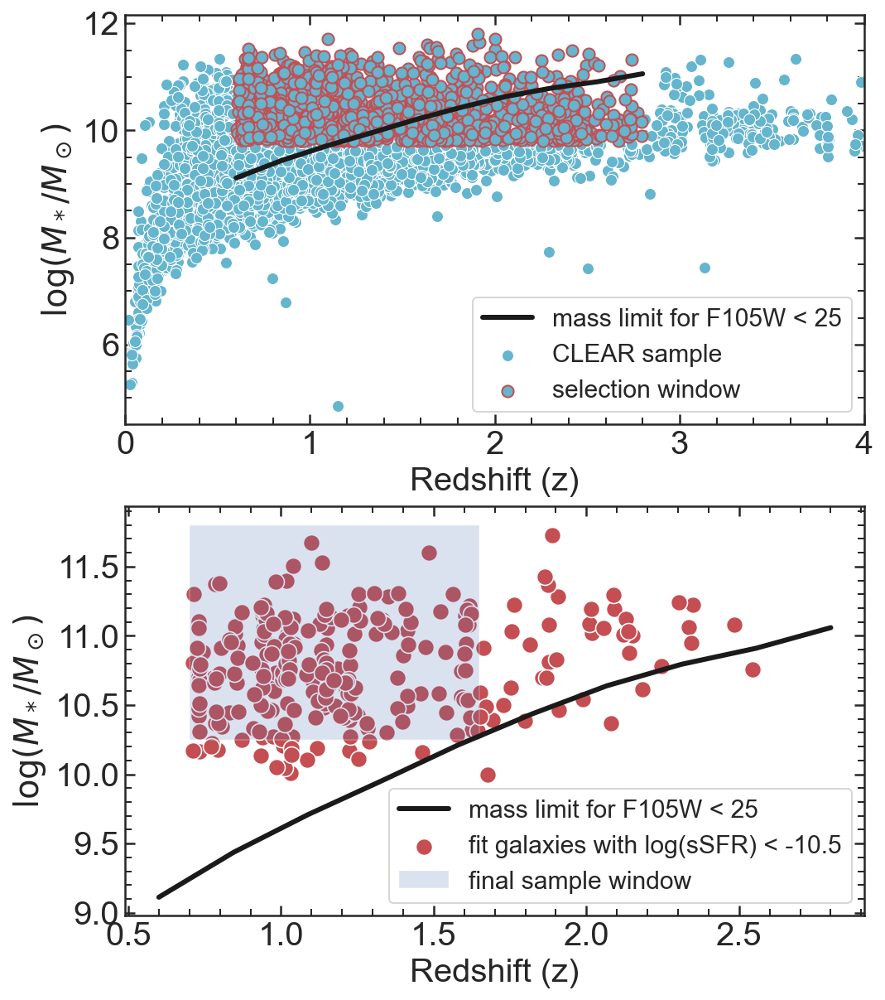

In [123]:
plt.figure(figsize = [8,10])
plt.subplot(211)

sea.scatterplot(v4N.query('grism == True and star < 0.8 and use == True').z500, 
                np.log10(v4N.query('grism == True and star < 0.8 and use == True').mass), color = 'c',
               label = 'CLEAR sample', s=50)
sea.scatterplot(v4S.query('grism == True and star < 0.8 and use == True').z500, 
                np.log10(v4S.query('grism == True and star < 0.8 and use == True').mass), color = 'c', s=50)

sea.scatterplot(v4N.query('grism == True and star < 0.8 and use == True and mass > 10**9.8 and 0.6< z500 < 2.8').z500, 
                np.log10(v4N.query('grism == True and star < 0.8 and use == True and mass > 10**9.8 and 0.6 <z500 < 2.8').mass), 
                edgecolor = 'r', color = 'c', linewidth = 1,
               label = 'selection window', s=50)
sea.scatterplot(v4S.query('grism == True and star < 0.8 and use == True and mass > 10**9.8 and 0.6< z500 < 2.8').z500, 
                np.log10(v4S.query('grism == True and star < 0.8 and use == True and mass > 10**9.8 and 0.6 <z500 < 2.8').mass), 
                edgecolor = 'r', color = 'c', linewidth = 1, s=50)

plt.plot(np.linspace(0.6, 2.8,10),M, color = 'k', linewidth = 3, label = 'mass limit for F105W < 25')
plt.xlim(0,4)
plt.xlabel('Redshift (z)',size=20)
plt.ylabel('$\log(M_*/M_\odot)$',size=20)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.legend(fontsize = 15)
plt.subplot(212)
sea.scatterplot(adb.query('log_ssfr < -10.5 and 0.7 < zgrism < 2.7 and lmass > 10').zgrism, 
                adb.query('log_ssfr < -10.5 and 0.7 < zgrism < 2.7 and lmass > 10').lmass, 
                s = 100, color = 'r', label = 'fit galaxies with log(sSFR) < -10.5')
plt.plot(np.linspace(0.6, 2.8,10),M, color = 'k', linewidth = 3, label = 'mass limit for F105W < 25')
# plt.xlim(0,4)
plt.xlabel('Redshift (z)',size=20)
plt.ylabel('$\log(M_*/M_\odot)$',size=20)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.fill_between([0.7,1.65], 10.25, 11.8, alpha = 0.2, label = 'final sample window')
plt.legend(fontsize = 15)


plt.savefig('../plots/evolution_plots/mass_limit.pdf', bbox_inches = 'tight')    


In [10]:
Nz=[]
Nlm = []
for i in CLEAR_GN.ID:
    if v4N.query('id == {}'.format(i)).star.values[0] < 0.8 and v4N.query('id == {}'.format(i)).use.values[0] == True:
        ez_z = v4N.query('id == {}'.format(i)).z500.values[0]
        g_z = CLEAR_GN.query('ID == {}'.format(i)).z_50.values[0]
        
        if np.abs(g_z - ez_z) / ez_z < 0.1:
            Nz.append(CLEAR_GN.query('ID == {}'.format(i)).z_50.values[0])
            Nlm.append(np.log10(v4N.query('id == {}'.format(i)).mass.values[0]))
        
Sz=[]
Slm = []
for i in CLEAR_GS.ID:
    if v4S.query('id == {}'.format(i)).star.values[0] < 0.8 and v4S.query('id == {}'.format(i)).use.values[0] == True:
        ez_z = v4S.query('id == {}'.format(i)).z500.values[0]
        g_z = CLEAR_GS.query('ID == {}'.format(i)).z_50.values[0]
        
        if np.abs(g_z - ez_z) / ez_z < 0.1:
            Sz.append(CLEAR_GS.query('ID == {}'.format(i)).z_50.values[0])
            Slm.append(np.log10(v4S.query('id == {}'.format(i)).mass.values[0]))

In [11]:
Nzr=[]
Nlmr = []
for i in range(len(Nz)):
    if 0.6 < Nz[i] < 2.8 and Nlm[i] > 9.8:
        Nzr.append(Nz[i])
        Nlmr.append(Nlm[i])
        
Szr=[]
Slmr = []
for i in range(len(Sz)):
    if 0.6 < Sz[i] < 2.8 and Slm[i] > 9.8:
        Szr.append(Sz[i])
        Slmr.append(Slm[i])

ValueError: x and y must have same first dimension, but have shapes (10,) and (42,)

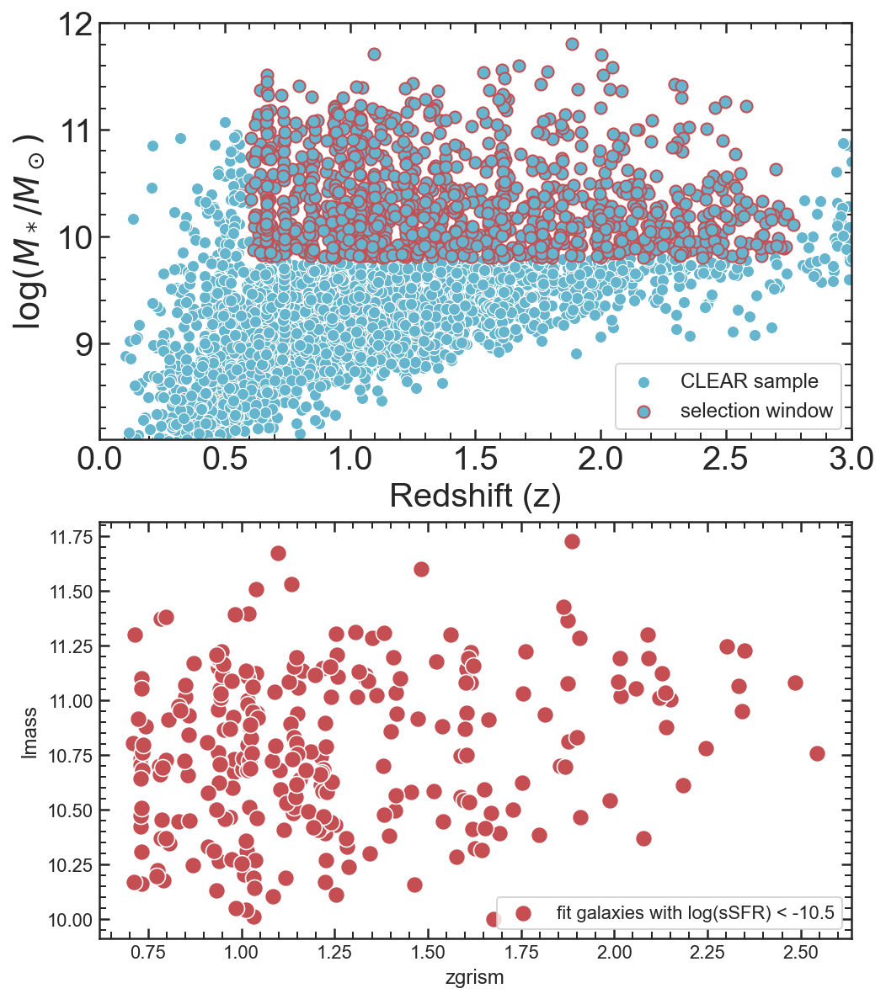

In [358]:
plt.figure(figsize = [8,10])
ax1 = plt.subplot(211)

sea.scatterplot(Nz,Nlm, color = 'c',
               label = 'CLEAR sample', s=50)
sea.scatterplot(Sz,Slm, color = 'c',
               s=50)


sea.scatterplot(Nzr,Nlmr, 
                edgecolor = 'r', color = 'c', linewidth = 1,
               label = 'selection window', s=50)
sea.scatterplot(Szr,Slmr,
                edgecolor = 'r', color = 'c', linewidth = 1, s=50)

# plt.plot(np.linspace(0.6, 2.8,10),M, color = 'k', linewidth = 3, label = 'mass limit for F105W < 25')
plt.xlim(0,3)
plt.ylim(8.1,12)

plt.xlabel('Redshift (z)',size=20)
plt.ylabel('$\log(M_*/M_\odot)$',size=20)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.legend(fontsize = 12)

ax2 = plt.subplot(212)
sea.scatterplot(adb.query('log_ssfr < -10.5 and 0.7 < zgrism < 2.7 and lmass > 10').zgrism, 
                adb.query('log_ssfr < -10.5 and 0.7 < zgrism < 2.7 and lmass > 10').lmass, 
                s = 100, color = 'r', label = 'fit galaxies with log(sSFR) < -10.5')
plt.plot(np.linspace(0.6, 2.8,10),M, color = 'k', linewidth = 3, label = 'mass limit for F105W < 25')
plt.ylim(9.1,12)
plt.xlabel('Redshift (z)',size=20)
plt.ylabel('$\log(M_*/M_\odot)$',size=20)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.fill_between([0.7,1.65], 10.25, 11.8, alpha = 0.2, label = 'final sample window')
plt.legend(fontsize = 12)

t= ax1.text(0.015,0.94, 'A', fontsize = 15, color = 'w',transform=ax1.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

t= ax2.text(0.015,0.94, 'B', fontsize = 15, color = 'w',transform=ax2.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

# plt.savefig('../plots/evolution_plots/mass_limit.pdf', bbox_inches = 'tight')    


In [344]:
len(Adb.query('6.3 < lbt < 7.8').log_ssfr),len(Adb.query('7.8 < lbt < 8.6').log_ssfr),len(Adb.query('8.6 < lbt < 9.7').log_ssfr)

(154, 143, 157)

In [260]:
z_at_value(cosmo.lookback_time, 8.6 * u.Gyr)

1.2541834336295976

In [406]:
Nz=[]
Nvz = []
for i in Adb.query('field == "GND" and sf_prob_ml > 0.9').id:
    Nz.append(v4N.query('id == {}'.format(i)).z500.values[0])
    Nvz.append(Adb.query('id == {}'.format(i)).zgrism.values[0])

Sz=[]
Svz = []
for i in Adb.query('field == "GSD" and sf_prob_ml > 0.9').id:
    Sz.append(v4S.query('id == {}'.format(i)).z500.values[0])
    Svz.append(Adb.query('id == {}'.format(i)).zgrism.values[0])

In [408]:
Nz.extend(Sz)
Nvz.extend(Svz)

0.11185257033968436


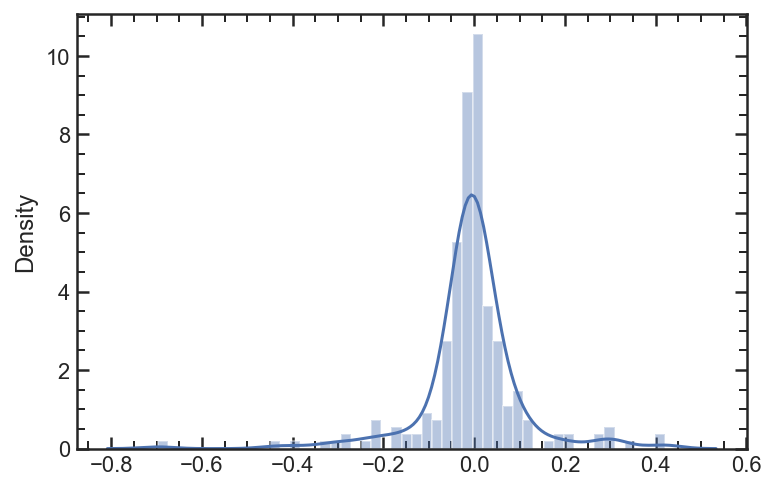

In [412]:

z = np.array(Nz)
vz = np.array(Nvz)
sea.distplot((vz - z)/vz)
print(np.std((vz - z)/vz))

In [404]:
Nvz.extend(Svz)

In [405]:
Nvz

[1.6245,
 1.22386,
 1.38391560388669,
 0.7995059689461584,
 1.136323308468093,
 1.029298084087802,
 1.362009472212123,
 1.377817737865874,
 1.405315253811531,
 1.645364048029668,
 1.366308247753254,
 1.012340637164277,
 1.258882448096858,
 0.940546010970262,
 0.9715168544074578,
 0.8580507228194759,
 1.358358568440785,
 1.054820443256208,
 0.8524699141694211,
 1.244676521596456,
 0.9348747552938191,
 1.455957034243679,
 1.094057505570228,
 0.8453576199479642,
 0.8386213425724701,
 1.425299549357451,
 1.146741067050126,
 1.324642544251259,
 1.426966778158416,
 0.9165097456218344,
 0.9758234154721394,
 1.522961696488724,
 1.05,
 1.018286296563475,
 1.196206256829188,
 0.9085765777612222,
 1.010655618231335,
 1.52968871994947,
 0.9643141497615922,
 0.7964201837895645,
 1.012737223879097,
 1.243796313026901,
 0.7864455249209922,
 1.573627918664377,
 1.42,
 1.605,
 1.222506100360727,
 0.9477038771212112,
 1.009981504674731,
 1.305432167839877,
 1.436726983261583,
 1.144527707524951,
 0.9354

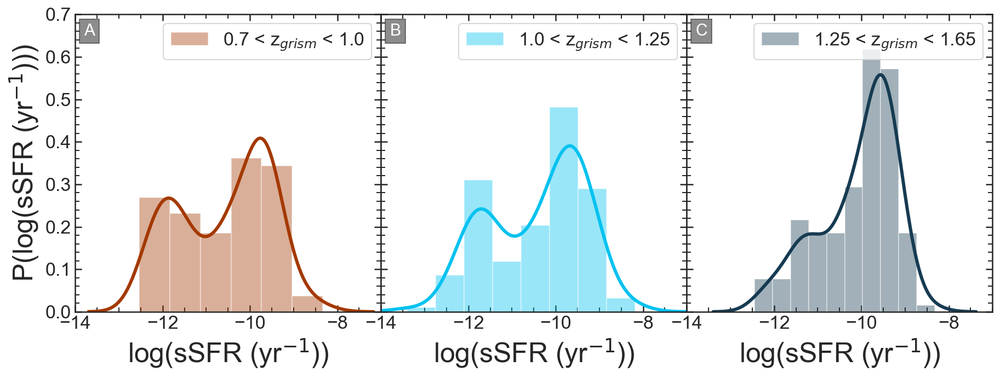

In [53]:
gs = gridspec.GridSpec(1,3, wspace = 0)
plt.figure(figsize = [15,5])
ax1 = plt.subplot(gs[0]); ax2 = plt.subplot(gs[1]); ax3 = plt.subplot(gs[2])

# sea.distplot(Adb.query('0.7 < zgrism < 0.9').log_ssfr, ax = ax1, color = '#a43900', kde_kws = {'linewidth': 3}, label = '0.7 < z$_{grism}$ < 1.0')
# sea.distplot(Adb.query('0.9 < zgrism < 1.3').log_ssfr, ax = ax2, color = '#00c2f0', kde_kws = {'linewidth': 3}, label = '0.9 < z$_{grism}$ < 1.3')
# sea.distplot(Adb.query('1.3 < zgrism < 1.65').log_ssfr, ax = ax3,  color = '#163b52', kde_kws = {'linewidth': 3}, label = '1.3 < z$_{grism}$ < 1.65')

sea.distplot(Adb.query('6.3 < lbt < 7.8').log_ssfr, ax = ax1, color = '#a43900', kde_kws = {'linewidth': 3}, label = '0.7 < z$_{grism}$ < 1.0')
sea.distplot(Adb.query('7.8 < lbt < 8.6').log_ssfr, ax = ax2, color = '#00c2f0', kde_kws = {'linewidth': 3}, label = '1.0 < z$_{grism}$ < 1.25')
sea.distplot(Adb.query('8.6 < lbt < 9.6').log_ssfr, ax = ax3,  color = '#163b52', kde_kws = {'linewidth': 3}, label = '1.25 < z$_{grism}$ < 1.65')


ax1.set_xlabel('log(sSFR (yr$^{-1}$))',size=25)
ax2.set_xlabel('log(sSFR (yr$^{-1}$))',size=25)
ax3.set_xlabel('log(sSFR (yr$^{-1}$))',size=25)
ax1.set_ylabel('P(log(sSFR (yr$^{-1}$)))',size=25)
ax1.tick_params(axis='both', which='major', labelsize=17)
ax2.tick_params(axis='both', which='major', labelsize=17)
ax3.tick_params(axis='both', which='major', labelsize=17)
   
ax1.legend(fontsize = 17);ax2.legend(fontsize = 17);ax3.legend(fontsize = 17);
    
ax1.set_ylim(0, 0.7) ;ax2.set_ylim(0, 0.7) ;ax3.set_ylim(0, 0.7) 
ax1.set_xlim(-14, -7) ;ax2.set_xlim(-14, -7) ;ax3.set_xlim(-14, -7) 
   
t= ax1.text(-13.8, 0.65, 'A', fontsize = 15, color = 'w')
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))
 
t= ax2.text(-13.8, 0.65, 'B', fontsize = 15, color = 'w')
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))
 
t= ax3.text(-13.8, 0.65, 'C', fontsize = 15, color = 'w')
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))
        
ax2.set_ylabel('')
ax3.set_ylabel('')
ax2.set_yticklabels([])
ax3.set_yticklabels([])

plt.savefig('../plots/evolution_plots/sSFR_dists.png', bbox_inches = 'tight')    


In [78]:
zdb = Adb.sort_values('zgrism')

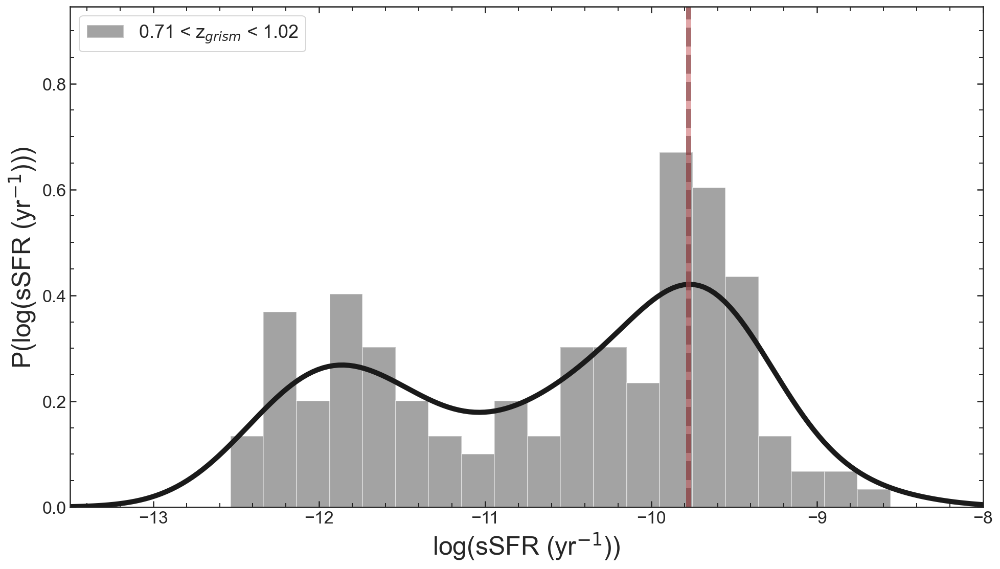

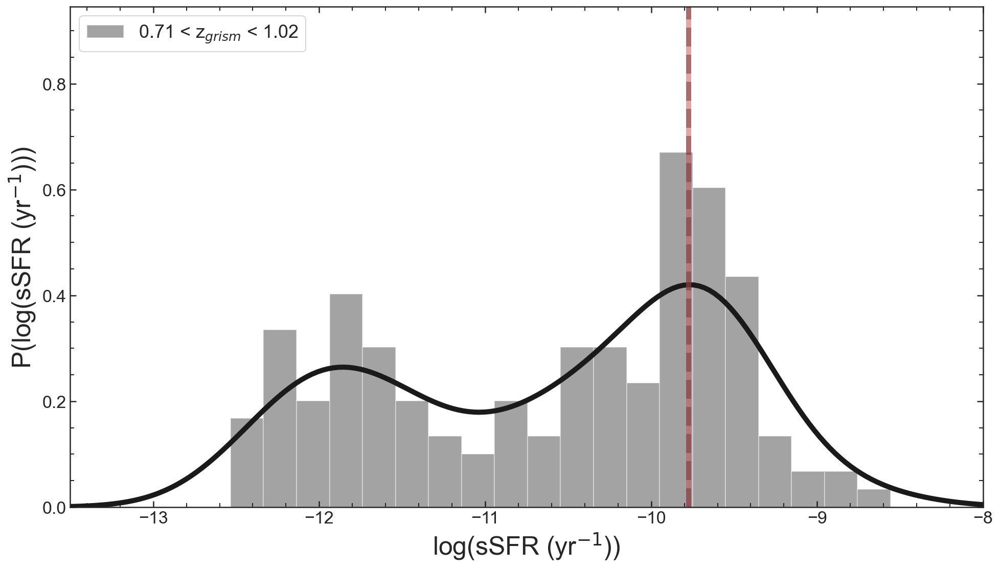

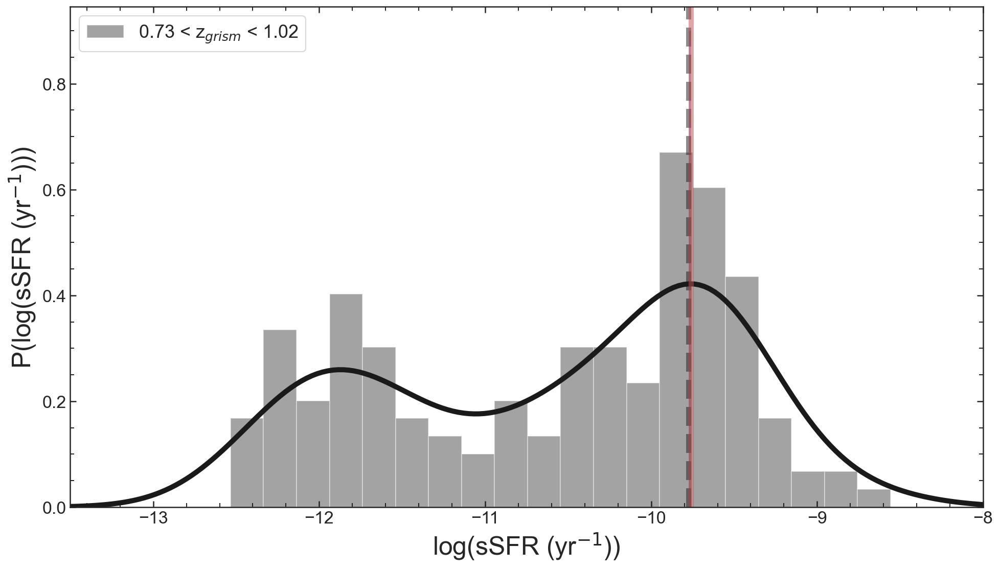

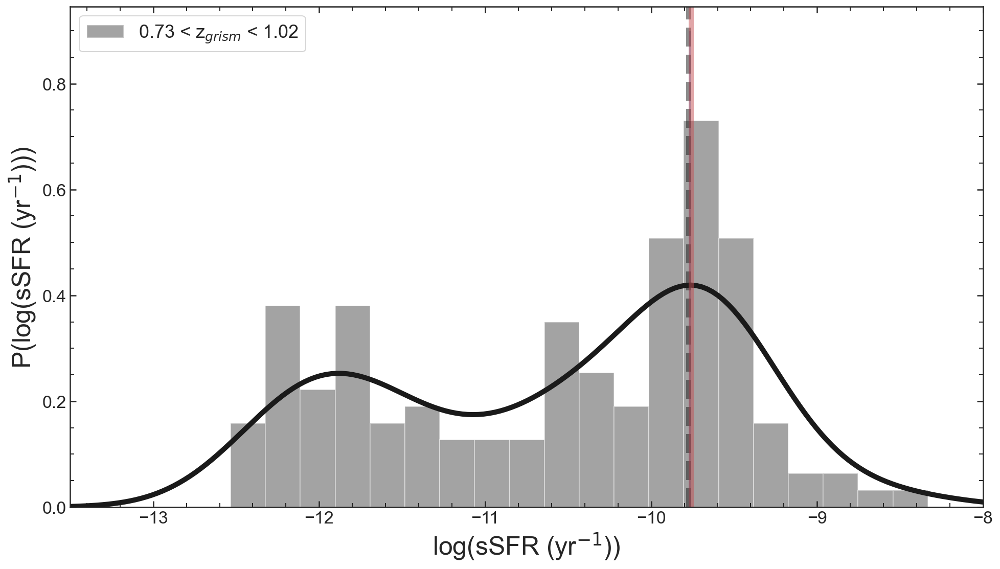

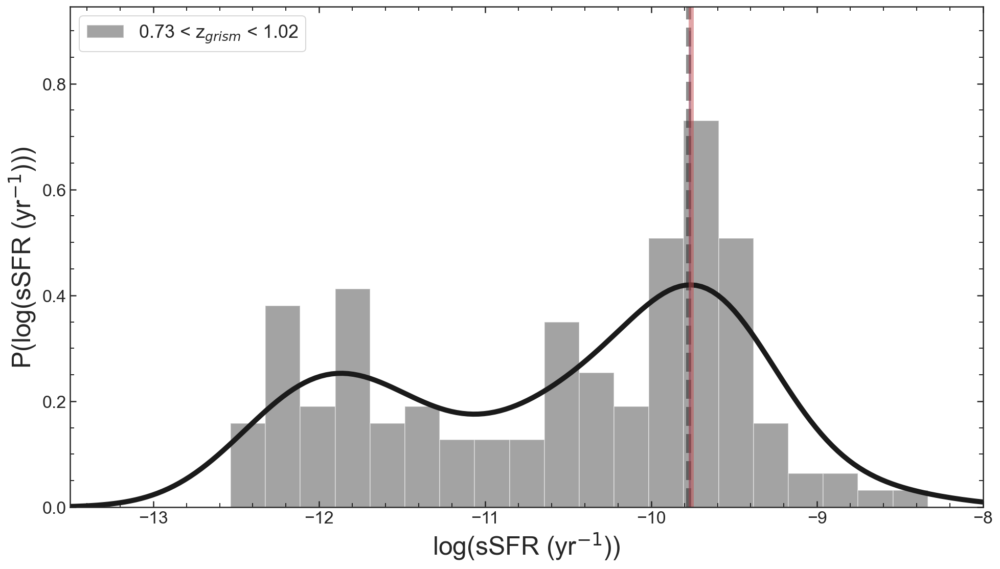

In [104]:
idx = 0


Zdx = zdb.index[0 :150]

kde =stats.gaussian_kde(Adb.log_ssfr[Zdx])

y = kde(X)
Y0 = np.array(y)
for i in range(len(Y0)):
    if i < 250:
        Y0[i] = 0
mu = X[Y0 == max(Y0)]

while len(zdb.index[0 + idx:150 + idx]) == 150:
    Zdx = zdb.index[0 + idx:150 + idx]
    
    
    plt.figure(figsize = [16,9])
    ax1=plt.subplot()
    sea.distplot(Adb.log_ssfr[Zdx], ax = ax1, color = 'k', kde_kws = {'linewidth': 5}, bins = 20, label = '{:1.2f} '.format(min(Adb.zgrism[Zdx])) + '< z$_{grism}$ < ' + '{:1.2f}'.format(max(Adb.zgrism[Zdx]) ))

    ax1.set_xlabel('log(sSFR (yr$^{-1}$))',size=25)
    ax1.set_ylabel('P(log(sSFR (yr$^{-1}$)))',size=25)
    ax1.tick_params(axis='both', which='major', labelsize=17)

    ax1.set_xlim(-13.5, -8) 
    ax1.legend(fontsize = 18, loc = 2)

    ax1.axvline(mu, color = 'k', alpha = 0.5, linestyle = '--', linewidth = 5)
    
    kde =stats.gaussian_kde(Adb.log_ssfr[Zdx])

    y = kde(X)
    Y0 = np.array(y)
    for i in range(len(Y0)):
        if i < 250:
            Y0[i] = 0
    mu2 = X[Y0 == max(Y0)]
    ax1.axvline(mu2, color = 'r', alpha = 0.5, linewidth = 5)
    ax1.fill_between([mu[0], mu2[0]], [0.9,0.9], alpha = 0.5)
#     plt.savefig('../plots/evolution_plots/all_sSFR_dists.png', bbox_inches = 'tight')   
    
    
    idx +=1
    
    if idx == 5:
        break

In [102]:
mu2

array([-9.77354709])

In [105]:
import imageio
from pygifsicle import optimize

frames_path = "../plots/evolution_plots/ssfr_gif/gif_sSFR_{i}.png"

n = len(glob('../plots/evolution_plots/ssfr_gif/*png'))
with imageio.get_writer('../plots/evolution_plots/ssfr_gif/ssfr_gif.gif', mode='I') as writer:
    for i in range(n):
        writer.append_data(imageio.imread(frames_path.format(i=i)))

optimize('../plots/evolution_plots/ssfr_gif/ssfr_gif.gif')

In [94]:
n

305

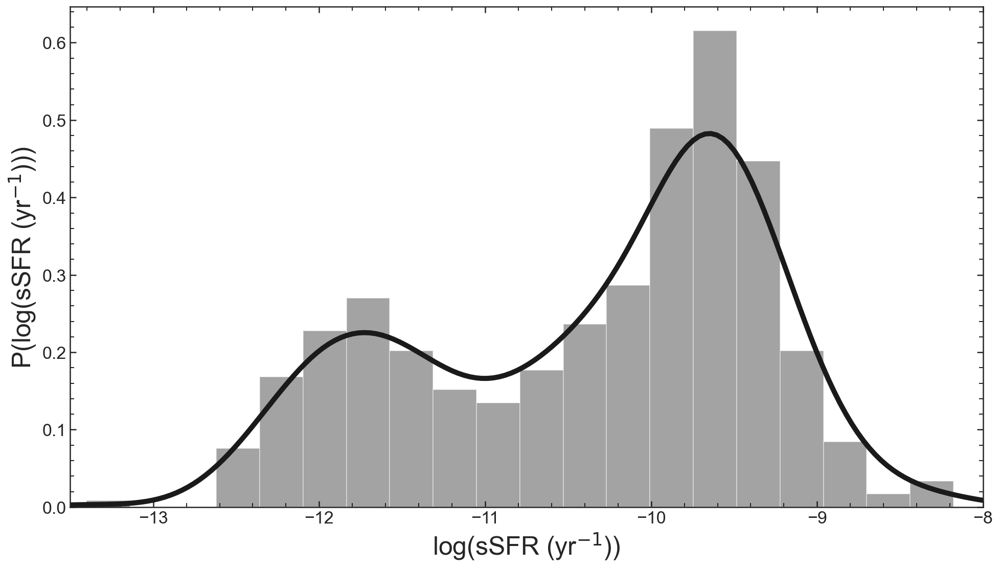

In [51]:
plt.figure(figsize = [16,9])
ax1=plt.subplot()
sea.distplot(Adb.log_ssfr, ax = ax1, color = 'k', kde_kws = {'linewidth': 5}, bins = 20)

ax1.set_xlabel('log(sSFR (yr$^{-1}$))',size=25)
ax1.set_ylabel('P(log(sSFR (yr$^{-1}$)))',size=25)
ax1.tick_params(axis='both', which='major', labelsize=17)

   
# ax1.legend(fontsize = 17);ax2.legend(fontsize = 17);ax3.legend(fontsize = 17);
    
# ax1.set_ylim(0, 0.7) 
ax1.set_xlim(-13.5, -8) 


plt.savefig('../plots/evolution_plots/all_sSFR_dists.png', bbox_inches = 'tight')    


In [712]:
def Whitaker_UVJ_select(rshift, UV,VJ):   
    if 0 < rshift < 1.5:
        UVlim = 1.3
        VJlim = 1.6
    
    if 1.5 < rshift < 2.0:
        UVlim = 1.3
        VJlim = 1.5
        
    if 2.0 < rshift < 3.5:
        UVlim = 1.2
        VJlim = 1.4
    
    if UV>=0.88*VJ+0.59 and UV>UVlim and VJ<VJlim:
        sf = 'Q'           
    else:
        sf = 'SF'
                     
    return sf

def Color(band1, band2):
    m1=-2.5*np.log10(band1)
    m2=-2.5*np.log10(band2)
    return m1-m2


/Users/Vince.ec/miniconda3/envs/astroconda3.6/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Users/Vince.ec/miniconda3/envs/astroconda3.6/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Users/Vince.ec/miniconda3/envs/astroconda3.6/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit ke

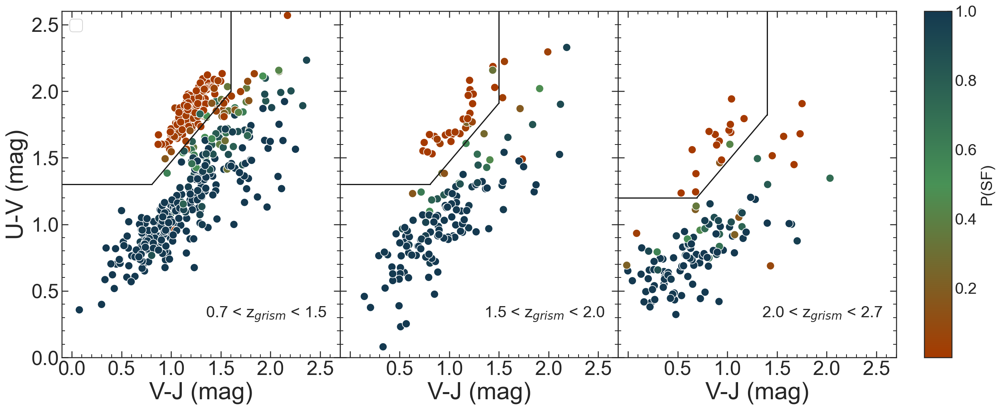

In [267]:
UVy = np.linspace(0,2.5)
VJx = np.linspace(-1,2.5)

iUVJ = interp1d(VJx, 0.88 * VJx +0.59)
invUVJ = interp1d(0.88 * VJx +0.59, VJx)

gs = gridspec.GridSpec(1,5, wspace=0, width_ratios=[1,1,1, 0.1,0.1])

plt.figure(figsize = [20, 8])

ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])
ax3 = plt.subplot(gs[2])
ax4 = plt.subplot(gs[4])

ax1.plot([-1,invUVJ(1.3)],[1.3,1.3], color = 'k')
ax1.plot([1.6,1.6],[iUVJ(1.6),2.7], color = 'k')
ax1.plot([invUVJ(1.3),1.6],[1.3,iUVJ(1.6)], color = 'k')

sea.scatterplot(Adb.query('0.7 < zgrism < 1.5').VJ, Adb.query('0.7 < zgrism < 1.5').UV, hue_norm = (0,1),
                hue = Adb.query('0.7 < zgrism < 1.5').sf_prob_mu, palette =  CMAP, ax = ax1, legend = False, s = 100)

######################################
ax2.plot([-1,invUVJ(1.3)],[1.3,1.3], color = 'k')
ax2.plot([1.5,1.5],[iUVJ(1.5),2.7], color = 'k')
ax2.plot([invUVJ(1.3),1.5],[1.3,iUVJ(1.5)], color = 'k')

sea.scatterplot(Adb.query('1.5 < zgrism < 2.0').VJ, Adb.query('1.5 < zgrism < 2.0').UV.values, hue_norm = (0,1),
                hue = Adb.query('1.5 < zgrism < 2.0').sf_prob_mu, palette =  CMAP, ax = ax2, legend = False, s = 100,)
############################################
ax3.plot([-1,invUVJ(1.2)],[1.2,1.2], color = 'k')
ax3.plot([1.4,1.4],[iUVJ(1.4),2.7], color = 'k')
ax3.plot([invUVJ(1.2),1.4],[1.2,iUVJ(1.4)], color = 'k')

sea.scatterplot(Adb.query('2.0 < zgrism < 2.7').VJ, Adb.query('2.0 < zgrism < 2.7').UV.values, hue_norm = (0,1),
                hue = Adb.query('2.0 < zgrism < 2.7').sf_prob_mu, palette =  CMAP, ax = ax3, legend = False, s = 100)

ax1.set_xlabel('V-J (mag)', fontsize=30)
ax2.set_xlabel('V-J (mag)', fontsize=30)
ax3.set_xlabel('V-J (mag)', fontsize=30)

ax1.set_ylabel('U-V (mag)', fontsize=30)

ax1.set_xticks(np.arange(0,3,0.5))
ax1.set_xticklabels(np.arange(0,3,0.5))
ax2.set_xticks(np.arange(0,3,0.5))
ax2.set_xticklabels(['',0.5,1.0,1.5,2.0,2.5])
ax3.set_xticks(np.arange(0,3,0.5))
ax3.set_xticklabels(['',0.5,1.0,1.5,2.0,2.5])

ax2.set_yticks([0,0.5,1.0,1.5,2.0])
ax2.set_yticklabels([])

ax3.set_yticks([0,0.5,1.0,1.5,2.0])
ax3.set_yticklabels([])

ax1.minorticks_on()
ax2.minorticks_on()
ax3.minorticks_on()

ax1.tick_params(axis='both', which='major', labelsize=25, length = 8)
ax2.tick_params(axis='both', which='major', labelsize=25, length = 8)
ax3.tick_params(axis='both', which='major', labelsize=25, length = 8)

ax1.text(1.35, 0.3, '0.7 < z$_{grism}$ < 1.5', fontsize =20)
ax2.text(1.35, 0.3, '1.5 < z$_{grism}$ < 2.0', fontsize =20)
ax3.text(1.35, 0.3, '2.0 < z$_{grism}$ < 2.7', fontsize =20)

ax1.set_xlim(-0.1, 2.7)
ax2.set_xlim(-0.1, 2.7)
ax3.set_xlim(-0.1, 2.7)

ax1.set_ylim(0.0,2.6)
ax2.set_ylim(0.0,2.6)
ax3.set_ylim(0.0,2.6)

ax1.legend( fontsize =20, loc = 2)

norm = mpl.colors.Normalize(vmin=min(Adb.sf_prob_mu), vmax = max(Adb.sf_prob_mu))
mpl.colorbar.ColorbarBase(ax4, cmap = CMAP, norm=norm, orientation='vertical')
ax4.set_ylabel('P(SF)', fontsize=20)
plt.tick_params(axis='both', which='major', labelsize=20)

# ax3.legend( fontsize = 18)
plt.savefig('../plots/UVJ_aas.png', bbox_inches = 'tight')    


In [185]:
from shutil import copy
for i in Adb.index:
    if os.path.isfile('../data/posteriors/{}_{}_tabfit.npy'.format(Adb.field[i], Adb.id[i])):
        copy('../data/posteriors/{}_{}_tabfit.npy'.format(Adb.field[i], Adb.id[i]), '../data/posterior_cat/{}_{}_tabfit.npy'.format(Adb.field[i], Adb.id[i]))
    if os.path.isfile('../data/posteriors/{}_{}_SFfit_p1_fits.npy'.format(Adb.field[i], Adb.id[i])):
        copy('../data/posteriors/{}_{}_SFfit_p1_fits.npy'.format(Adb.field[i], Adb.id[i]), '../data/posterior_cat/{}_{}_SFfit_p1_fits.npy'.format(Adb.field[i], Adb.id[i]))

In [161]:
params = ['m', 'a', 'm1', 'm2', 'm3', 'm4', 'm5', 'm6', 'm7', 'm8', 'm9', 'm10', 'lm',
          'z', 'd', 'bp1', 'rp1', 'ba', 'bb', 'bl', 'ra', 'rb', 'rl']
P_params = ['Pm', 'Pa', 'Pm1', 'Pm2', 'Pm3', 'Pm4', 'Pm5', 'Pm6', 'Pm7', 'Pm8', 'Pm9', 'Pm10', 'Plm',
          'Pz', 'Pd', 'Pbp1', 'Prp1', 'Pba', 'Pbb', 'Pbl', 'Pra', 'Prb', 'Prl']

bf_params = ['bfm', 'bfa', 'bfm1', 'bfm2', 'bfm3', 'bfm4', 'bfm5', 'bfm6', 'bfm7', 'bfm8', 'bfm9', 'bfm10', 'bflm',
          'bfz', 'bfd', 'bfbp1', 'bfrp1', 'bfba', 'bfbb', 'bfbl', 'bfra', 'bfrb', 'bfrl']

for i in Adb.index:
    if os.path.isfile('../data/bestfits/{}_{}_tabfit_bfit.npy'.format(Adb.field[i], Adb.id[i])):
        fit_dict = {}
        
        bfdict = np.load('../data/bestfits/{}_{}_tabfit_bfit.npy'.format(Adb.field[i], Adb.id[i]))
        for ii in range(len(params)):
            t,pt = np.load('../data/posteriors/{}_{}_tabfit_P{}.npy'.format(Adb.field[i], Adb.id[i], params[ii]))
            fit_dict[params[ii]] = t
            fit_dict[P_params[ii]] = pt

        for ii in range(len(bf_params)):
            fit_dict[bf_params[ii]] = bfdict[ii]

        np.save('../data/posterior_cat/{}_{}_tabfit'.format(Adb.field[i], Adb.id[i]),fit_dict, allow_pickle = True)

In [174]:
from shutil import copy
for i in Adb.index:
    if not (os.path.isfile('../data/posterior_cat/{}_{}_tabfit.npy'.format(Adb.field[i], 
        Adb.id[i])) | os.path.isfile('../data/posterior_cat/{}_{}_SFfit_p1_fits.npy'.format(Adb.field[i], Adb.id[i]))):
        print(Adb.field[i], Adb.id[i])


In [173]:
params = ['m', 'a', 'm1', 'm2', 'm3', 'm4', 'm5', 'm6', 'lm', 'd', 'bp1', 'rp1', 'ba', 'bb', 'bl', 'ra', 'rb', 'rl']
P_params = ['Pm', 'Pa', 'Pm1', 'Pm2', 'Pm3', 'Pm4', 'Pm5', 'Pm6', 'Plm',
          'Pd', 'Pbp1', 'Prp1', 'Pba', 'Pbb', 'Pbl', 'Pra', 'Prb', 'Prl']

bf_params = ['bfm', 'bfa', 'bfm1', 'bfm2', 'bfm3', 'bfm4', 'bfm5', 'bfm6', 'bflm',
          'bfd', 'bfbp1', 'bfrp1', 'bfba', 'bfbb', 'bfbl', 'bfra', 'bfrb', 'bfrl']

for i in Adb.index:
    if os.path.isfile('../data/bestfits/{}_{}_SFfit_p1_bfit.npy'.format(Adb.field[i], Adb.id[i])):
        fit_dict = {}
        
        bfdict = np.load('../data/bestfits/{}_{}_SFfit_p1_bfit.npy'.format(Adb.field[i], Adb.id[i]))
        for ii in range(len(params)):
            t,pt = np.load('../data/posteriors/{}_{}_SFfit_p1_P{}.npy'.format(Adb.field[i], Adb.id[i], params[ii]))
            fit_dict[params[ii]] = t
            fit_dict[P_params[ii]] = pt

        for ii in range(len(bf_params)):
            fit_dict[bf_params[ii]] = bfdict[ii]

        np.save('../data/posterior_cat/{}_{}_SFfit_p1_fits'.format(Adb.field[i], Adb.id[i]),fit_dict, allow_pickle = True)

In [3]:
ssfr = []
idx=1
for i in Adb.index:
    fname = glob('../data/posterior_cat/{}_{}*'.format(Adb.field[i], Adb.id[i]))
    if len(fname) > 1:
        print(fname, idx, Adb.field[i], Adb.id[i])
        
    fit_db = np.load(fname[0], allow_pickle = True).item()    
    m, hdr, mn = Highest_density_region(fit_db['Pssfr'],fit_db['ssfr'])
    Adb.log_ssfr[i] = m
    Adb.log_ssfr_hdr[i] = hdr
    
    ssfr.append(m)
    idx+=1

In [102]:
size =1.
step = 0.1
start = 6.35 - size/2
stop = 9.6 + size/2

idx = 0

llim = start + step*idx
hlim = llim + size

ssfr_grid = []

epsilon = 0.1

# X = np.linspace(-15, -7, 500)
X = np.arange(-15, -7, epsilon)

# XX = np.linspace(-15, -7, 5000)
XX = np.arange(-15, -7, epsilon/2)
DB = Adb

for i in DB.query('{} <lbt < {}'.format(llim,hlim)).index:
    fname = glob('../data/posterior_cat/{}_{}*'.format(DB.field[i], DB.id[i]))  
    fit_db = np.load(fname[0], allow_pickle = True).item()    
    ssfr_grid.append(interp1d(fit_db['ssfr'],fit_db['Pssfr'], bounds_error=False, fill_value=0)(XX))

IT, WEI = Iterative_stacking(ssfr_grid, XX, iterations=1, resampling=5000)
iIT = interp1d(XX, WEI)(X)        
out = smooth(iIT, 2,int(0.14*len(X))+1)
out /= np.trapz(out, X)
#         oo.append(out)
        
#         sf, s_mu, s_sig, qs, q_p, sp = X_dist_3(out, X)   

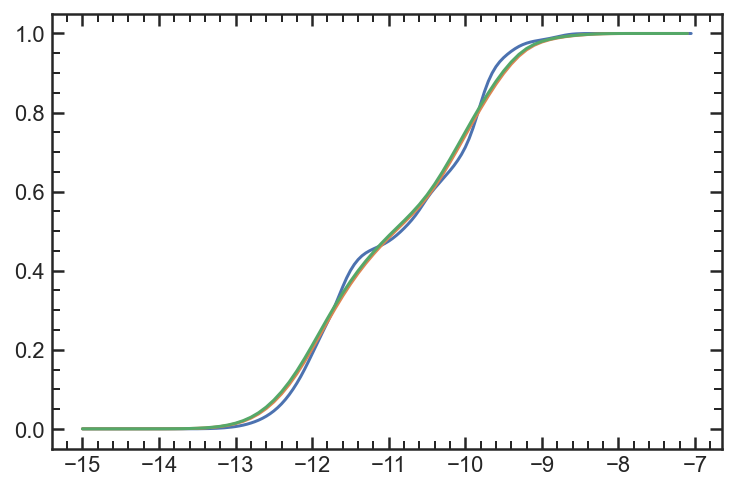

In [18]:
plt.plot(XX,  np.cumsum(WEI)/np.cumsum(WEI)[-1])
iW = interp1d(XX,np.cumsum(WEI))(X)  
plt.plot(X,  smooth(iW, 2,int(0.14*len(X))+1)/smooth(iW, 2,int(0.14*len(X))+1)[-1])

plt.plot(X,np.cumsum(out)/np.cumsum(out)[-1])

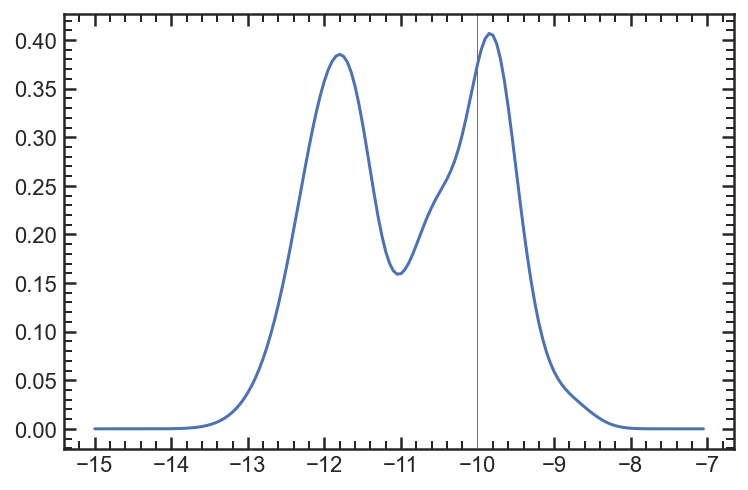

In [107]:
eps = 0.02
plt.plot(XX,IT)
plt.axvspan(-10 - eps, -10 + eps)

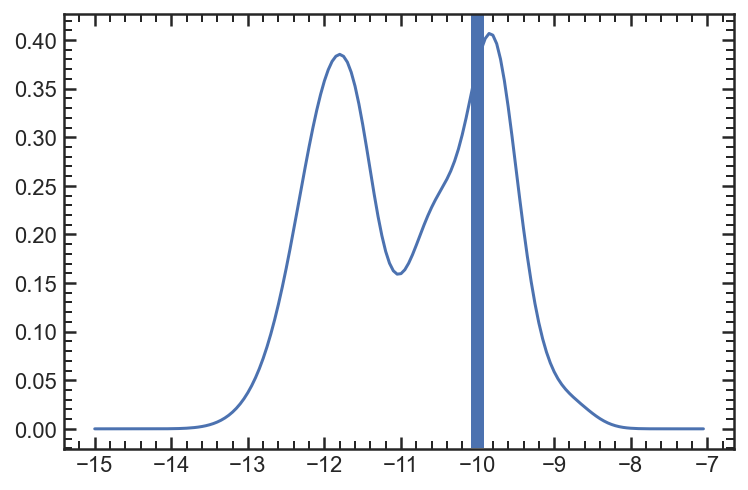

In [105]:
eps = 0.1
plt.plot(XX,IT)
plt.axvspan(-10 - eps, -10 + eps)

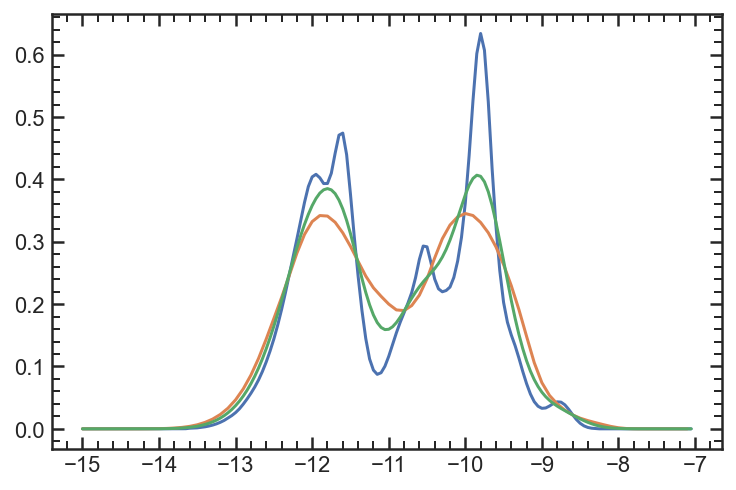

In [174]:
plt.plot(XX,WEI)
plt.plot(X,out)
plt.plot(XX,IT)

In [172]:
from scipy.signal import find_peaks

def X_dist(samp,X = np.linspace(-15, -7, 1000), dfit = False):
    kde =stats.gaussian_kde(samp)
    
    y = kde(X)
    x = X
    peaks, _ = find_peaks(-np.abs(np.gradient(y)) + 10)
#     mu = (x[peaks])[-1]    
    for i in range(len(peaks)):
        if peaks[-(i+1)] < 800:
            mu = (x[peaks])[-(i+1)]
            break
            
    hy = np.array(y)
    hy[x < mu] = 0
    hy /= np.trapz(hy, x)

    cdist = np.cumsum(hy) / max(np.cumsum(hy))
    icdist = interp1d(cdist, x)
    sig = np.abs(mu - icdist(0.68))

    sfdist = stats.norm.pdf(x, mu, sig) / max(stats.norm.pdf(x, mu, sig)) * max(y)
    
    qdist = y- sfdist
    qdist[qdist < 0] = 0

    switch = 0
    for i in range(len(x)):
        if switch == 0 and qdist[i] == 0:
            pass
        if switch == 0 and qdist[i] > 0:
            switch = 1
            pass
        if switch == 1 and qdist[i] > 0:
            pass
        if switch == 1 and qdist[i] == 0:
            switch = 2
            pass
        if switch == 2:
            qdist[i] = 0
            
    if dfit:
        killswitch = 0
        while len(check_peaks(qdist, X)) > 1 and killswitch < 1:
            sfdist, qdist = gfit_iteration(sfdist,qdist,X)
            killswitch +=1

#         print(killswitch)
        
    Qint = []
    Sint = []
    for i in range(len(X)):
        Qint.append(np.trapz(qdist[i:i+2],X[i:i+2]))
        Sint.append(np.trapz(sfdist[i:i+2],X[i:i+2]))    

    Fint = np.add(Qint, Sint)
    SFprob = interp1d(X,np.array(Sint) / np.array(Fint))

    # return Sf, S_mu, S_sig, Qs, Q_p, Sp
    return sfdist, mu, sig, qdist, X[qdist == max(qdist)], SFprob(x)[:-1]

def Get_dist(DB, dfit = False):
    DB['lbt'] = cosmo.lookback_time(DB.zgrism.values).value

    idx=0
    Qs = []
    Sf = []
    Sp = []
    zs = []
    S_mu = []
    S_sig=[]
    Q_p = []

    size =1.5
    step = 0.15
    start = 6.35 - size/2
    stop = 9.6 + size/2
#     X = np.linspace(-15, -7, 1000)

    while (start + step*idx + size) < stop:
        zs.append(start + step*idx + size/2)

        llim = start + step*idx
        hlim = llim + size

        samp = DB.query('{} <lbt < {}'.format(llim,hlim)).log_ssfr.values
        
        
        if dfit and idx > 25:
#         if dfit:
            sf, s_mu, s_sig, qs, q_p, sp = X_dist(samp, dfit = True)

        else:
            sf, s_mu, s_sig, qs, q_p, sp = X_dist(samp)
        idx+=1
        Qs.append(qs)
        Sf.append(sf)
        Sp.append(sp)
        S_mu.append(s_mu)
        S_sig.append(s_sig)
        Q_p.append(q_p)
    return Sp, zs#, Sf

def Plot_dist(Sp,ax, zs, ax2, X = X):
    sea.heatmap(Sp, cmap=CMAP, ax = ax, linewidths=0.0, rasterized=True, cbar = True, 
                cbar_ax = ax2, cbar_kws = {"orientation": "horizontal"})

    ynum = np.arange(0,len(zs),10)
    znum = []

    xnum = np.arange(0,len(X[:-1]),int(len(X)/10))
    snum = []

    for i in range(len(ynum)):
        znum.append(np.round(z_at_value(cosmo.lookback_time,u.Gyr*zs[ynum[i]]), 1))
    for i in range(len(xnum)):
        snum.append(np.round(X[xnum[i]],1))

    ax.set_yticks(ynum)
    ax.set_yticklabels(znum, rotation = 'horizontal')
    ax.set_xticks(xnum)
    ax.set_xticklabels(snum, rotation = 'horizontal')

    ax.set_ylabel('Redshift (z)')
    ax.set_xlabel('log(sSFR)')
    ax.tick_params(axis='both', which='major')

#     ax.set_xlim(250,880)
    ax.set_xlim(int((len(X)/10) * 3),int((len(X)/5) * 4))
    print(int((len(X)/10) * 3),int((len(X)/5) * 4))
    print(len(X))
    
def gfit_iteration(SF,Q,X):
    peaks, _ = find_peaks(-np.abs(np.gradient(Q)) + 10)
    mu = (X[peaks])[-1]    

    hy = np.array(Q)
    hy[X < mu] = 0
    hy /= np.trapz(hy, X)

    cdist = np.cumsum(hy) / max(np.cumsum(hy))
    icdist = interp1d(cdist, X)
    sig = np.abs(mu - icdist(0.68))

    sfldist = stats.norm.pdf(X, mu, sig) / max(stats.norm.pdf(X, mu, sig)) * max(Q)

    qdist = Q - sfldist
    qdist[qdist < 0] = 0

    switch = 0
    for i in range(len(X)):
        if switch == 0 and qdist[i] == 0:
            pass
        if switch == 0 and qdist[i] > 0:
            switch = 1
            pass
        if switch == 1 and qdist[i] > 0:
            pass
        if switch == 1 and qdist[i] == 0:
            switch = 2
            pass
        if switch == 2:
            qdist[i] = 0
            
    return SF + sfldist, qdist

def check_peaks(qdist, X):
    grad = np.gradient(qdist)

    switch = 1
    yinter = []
    for i in range(len(X)):
        if switch == 1 and grad[i] > 0:
            pass
        if switch == 1 and grad[i] < 0:
            switch = -1
            yinter.append(X[i])
            pass
        if switch == -1 and grad[i] < 0:
            pass
        if switch == -1 and grad[i] > 0:
            switch = 1
            yinter.append(X[i])
            pass
        
    return yinter

In [153]:
from scipy.signal import find_peaks
epsilon = 0.01

# X = np.linspace(-15, -7, 500)
X = np.arange(-15, -7, epsilon)

XX = np.linspace(-15, -7, 5000)
# XX = np.arange(-15, -7, epsilon/2)

def X_dist_2(y,x): 
    Y0 = np.array(y)
    for i in range(len(Y0)):
        if i < 250:
            Y0[i] = 0
    mu = x[Y0 == max(Y0)]
    hy = np.array(y)
    hy[x < mu] = 0
    hy /= np.trapz(hy, x)

    cdist = np.cumsum(hy) / max(np.cumsum(hy))
    icdist = interp1d(cdist, x)
    sig = np.abs(mu - icdist(0.68))

    sfdist = stats.norm.pdf(x, mu, sig) / max(stats.norm.pdf(x, mu, sig)) * max(y)
    
    qdist = y- sfdist
    qdist[qdist < 0] = 0

    switch = 0
    for i in range(len(x)):
        if switch == 0 and qdist[i] == 0:
            pass
        if switch == 0 and qdist[i] > 0:
            switch = 1
            pass
        if switch == 1 and qdist[i] > 0:
            pass
        if switch == 1 and qdist[i] == 0:
            switch = 2
            pass
        if switch == 2:
            qdist[i] = 0
            
        
    Qint = []
    Sint = []
    for i in range(len(x)):
        Qint.append(np.trapz(qdist[i:i+2],x[i:i+2]))
        Sint.append(np.trapz(sfdist[i:i+2],x[i:i+2]))    

    Fint = np.add(Qint, Sint)
    SFprob = interp1d(x,np.array(Sint) / np.array(Fint))

    # return Sf, S_mu, S_sig, Qs, Q_p, Sp
    return sfdist, mu, sig, qdist, X[qdist == max(qdist)], SFprob(x)[:-1]


def X_dist_3(y,x): 
    Y0 = np.array(y)
    for i in range(len(Y0)):
        if i < len(x)/2:

            Y0[i] = 0
    mu = x[Y0 == max(Y0)]
    hy = np.array(y)
    hy[x < mu] = 0
    hy /= np.trapz(hy, x)

    cdist = np.cumsum(hy) / max(np.cumsum(hy))
    icdist = interp1d(cdist, x)
    sig = np.abs(mu - icdist(0.68))

    sfdist = stats.norm.pdf(x, mu, sig) / max(stats.norm.pdf(x, mu, sig)) * max(y)
    
    qdist = y- sfdist
    qdist[qdist < 0] = 0

    switch = 0
    for i in range(len(x)):
        if switch == 0 and qdist[i] == 0:
            pass
        if switch == 0 and qdist[i] > 0:
            switch = 1
            pass
        if switch == 1 and qdist[i] > 0:
            pass
        if switch == 1 and qdist[i] == 0:
            switch = 2
            pass
        if switch == 2:
            qdist[i] = 0
            
        
    Qint = []
    Sint = []
    for i in range(len(x)-2):
        Qint.append(np.trapz(qdist[i :i+1 +2],x[i :i+1 +2]))
        Sint.append(np.trapz(sfdist[i :i+1 +2],x[i :i+1 +2]))    

    Fint = np.add(Qint, Sint)
    SFprob = np.array(Sint) / np.array(Fint)

    # return Sf, S_mu, S_sig, Qs, Q_p, Sp
    return sfdist, mu, sig, qdist, X[qdist == max(qdist)], SFprob

def Get_dist_2(DB, dfit = False):
    idx=0
    Qs = []
    Sf = []
    Sp = []
    zs = []
    S_mu = []
    S_sig=[]
    Q_p = []
    oo = []
    
    size =1.
    step = 0.1
    start = 6.35 - size/2
    stop = 9.6 + size/2

    while (start + step*idx + size) < stop:
        zs.append(start + step*idx + size/2)

        llim = start + step*idx
        hlim = llim + size

        ssfr_grid = []

        for i in DB.query('{} <lbt < {}'.format(llim,hlim)).index:
            fname = glob('../data/posterior_cat/{}_{}*'.format(DB.field[i], DB.id[i]))  
            fit_db = np.load(fname[0], allow_pickle = True).item()    
            ssfr_grid.append(interp1d(fit_db['ssfr'],fit_db['Pssfr'], bounds_error=False, fill_value=0)(XX))

        IT, WEI = Iterative_stacking(ssfr_grid, XX, iterations=1, resampling=5000)
        iIT = interp1d(XX, WEI)(X)        
        out = smooth(iIT, 2,int(0.14*len(X)))
        out /= np.trapz(out, X)
        oo.append(out)
        
        sf, s_mu, s_sig, qs, q_p, sp = X_dist_3(out, X)       
        for i in range(len(sp)):
            if i < int(len(X)/5):
                sp[i]=0
        
        idx+=1
        Qs.append(qs)
        Sf.append(sf)
        Sp.append(sp)
        S_mu.append(s_mu)
        S_sig.append(s_sig)
        Q_p.append(q_p)
    return Sp, zs, Sf, oo, Qs

def smooth(x,beta, winlen):
    """ kaiser window smoothing """
#     winlen = int(250) 
    window_len= winlen + 1
    # extending the data at beginning and at the end
    # to apply the window at the borders
    s = np.r_[x[window_len-1:0:-1],x,x[-1:-window_len:-1]]
    w = np.kaiser(window_len,beta)
    y = np.convolve(w/w.sum(),s,mode='valid')
    return y[int(winlen / 2):len(y)-int(winlen / 2)]


In [86]:
X[1] - X[0]

0.010224948875254825

In [111]:
PLM, ZZ, sf, oo, qq = Get_dist_2(Adb)

In [133]:
int(len(X)/5)

100

239 638
798


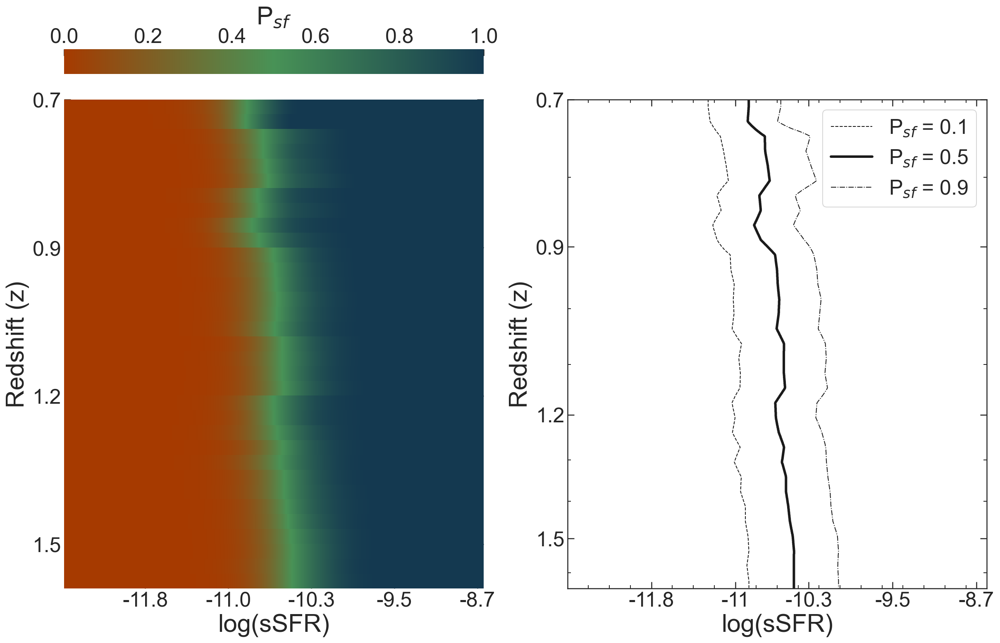

In [178]:
gs = gridspec.GridSpec(2,2, height_ratios=[1,20], hspace=0.1)
plt.figure(figsize = [20,12])
ax1 = plt.subplot(gs[1,0])
ax2 = plt.subplot(gs[0,0])
ax3 = plt.subplot(gs[1,1])

Plot_dist(PLM, ax1, ZZ, ax2= ax2, X = X[1:-1])
ax1.set_xlabel('log(sSFR)',fontsize=30)
ax1.set_ylabel('Redshift (z)',fontsize=30)
ax1.tick_params(axis='both', which='major', labelsize=25, length = 8)

ax2.set_xlabel('P$_{sf}$',fontsize=30)
ax2.tick_params(axis='both', which='major', labelsize=25, length = 8)
ax2.xaxis.set_label_position("top")
ax2.xaxis.tick_top()


ax3.plot(L,Z, 'k--', linewidth=1, label = 'P$_{sf}$ = 0.1')
ax3.plot(M,Z, 'k', linewidth=3, label = 'P$_{sf}$ = 0.5')
ax3.plot(H,Z, 'k-.', linewidth=1, label = 'P$_{sf}$ = 0.9')
ax3.set_yticks(cosmo.lookback_time([0.7, 0.9, 1.2, 1.5]).value)
ax3.set_yticklabels([0.7, 0.9, 1.2, 1.5])
ax3.set_yticks(cosmo.lookback_time([0.8, 1.0, 1.1, 1.3, 1.4, 1.6]).value, minor  = True)

ax3.set_ylim(cosmo.lookback_time(1.65).value,cosmo.lookback_time(0.7).value)
ax3.set_xlim(-12.6, -8.6)
ax3.set_xticks([-11.8, -11,-10.3, -9.5, -8.7])

ax3.set_xticklabels([-11.8, -11,-10.3, -9.5, -8.7])

ax3.legend(fontsize = 25)
ax3.set_xlabel('log(sSFR)',fontsize=30)
ax3.set_ylabel('Redshift (z)',fontsize=30)
ax3.tick_params(axis='both', which='major', labelsize=25, length = 8)

plt.savefig('../plots/evolution_plots/Psf_dist.pdf', bbox_inches = 'tight')    


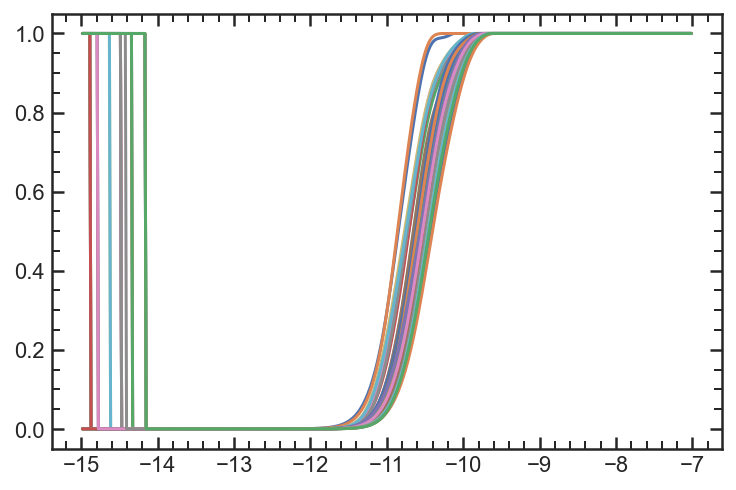

In [31]:
X0 = np.linspace(-15, -7, 500)
for i in range(len(PLMO)):
    plt.plot(X0[1:-1],PLMO[i])
#     plt.axvline(X[100])

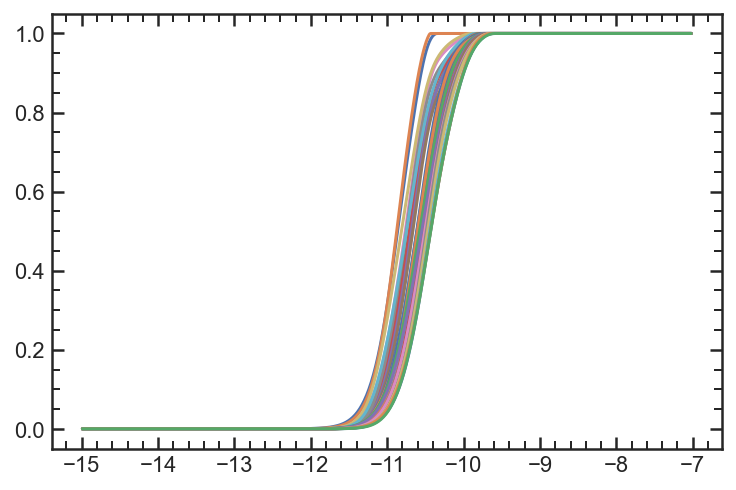

In [113]:
for i in range(len(PLM)):
    plt.plot(X[1:-1],PLM[i])
#     plt.axvline(X[100])

In [11]:
X[1] - X[0]

0.01603206412825564

In [114]:
# Z = np.linspace(6.3,9.6,500)
# X = np.linspace(-15, -7, 500)

Z = np.linspace(6.3,9.6, len(X))
# X = np.linspace(-15, -7, 50)

iSprob = interp2d(X[1:-1],ZZ,PLM)
M = []
L = []
H = []
for ii in range(len(Z)):
    mt = lt = ht = False
    for x in XX[:-10]:
        if not mt and iSprob(x,Z[ii]) > 0.49:
            M.append(x)
            mt = True
        if not lt and iSprob(x,Z[ii]) > 0.09:
            L.append(x)
            lt = True
        if not ht and iSprob(x,Z[ii]) > 0.89:
            H.append(x)
            ht = True  

In [42]:

len(M),len(H),len(L),len(ZZ), np.array(PLM).shape, len(X[:-1])

(80, 80, 80, 33, (33, 78), 79)

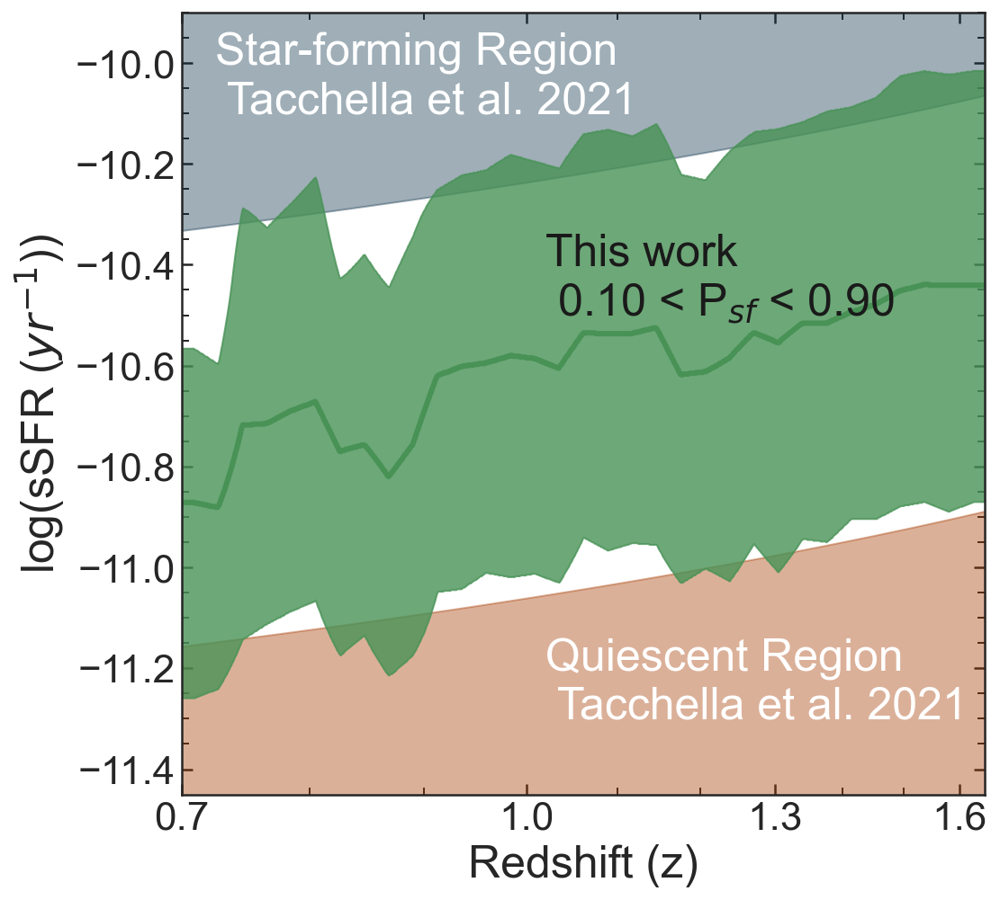

In [186]:
t =(cosmo.age(0.7).value - (np.array(Z) - min(Z)))*1E9

lsflim = np.log10(1/(3*t))
lqlim = np.log10(1/(20*t))

plt.figure(figsize = [8,8])
ax = plt.subplot()

ax.fill_between(Z,lsflim, np.repeat(-9, len(Z)), color = '#10354c', alpha = 0.4)
ax.fill_between(Z,lqlim, np.repeat(-12, len(Z)), color = '#a63b00', alpha = 0.4)

ax.plot(Z,M, '#489256', linewidth=3)
ax.fill_between(Z,L, H, color = '#489256', alpha = 0.8)

plt.xlim(Z[0],Z[-1])
plt.ylim(-11.45,-9.9 )

plt.xlabel('Redshift (z)',size=25)
plt.ylabel('log(sSFR ($yr^{-1}$))',size=25)

plt.xticks(cosmo.lookback_time([0.7, 1.0, 1.3, 1.6]).value, [0.7, 1.0, 1.3, 1.6])
ax.set_xticks(cosmo.lookback_time([0.8, 0.9, 1.1, 1.2, 1.4, 1.5] ).value, minor = True)

plt.text(cosmo.lookback_time(0.725).value, -10.1, 'Star-forming Region\n Tacchella et al. 2021', color = 'w', fontsize = 25)
plt.text(cosmo.lookback_time(1.02).value, -11.3, 'Quiescent Region\n Tacchella et al. 2021', color = 'w', fontsize = 25)
plt.text(cosmo.lookback_time(1.02).value, -10.5, 'This work\n 0.10 < P$_{sf}$ < 0.90', color = 'k', fontsize = 25)

plt.tick_params(axis='both', which='major', labelsize=22)
plt.savefig('../plots/evolution_plots/green_valley_region.pdf', bbox_inches = 'tight')    


In [58]:
# Z0 = np.array(Z)
# M0 = np.array(M)
# L0 = np.array(L)
# H0 = np.array(H)

(-12.6, -8.6)

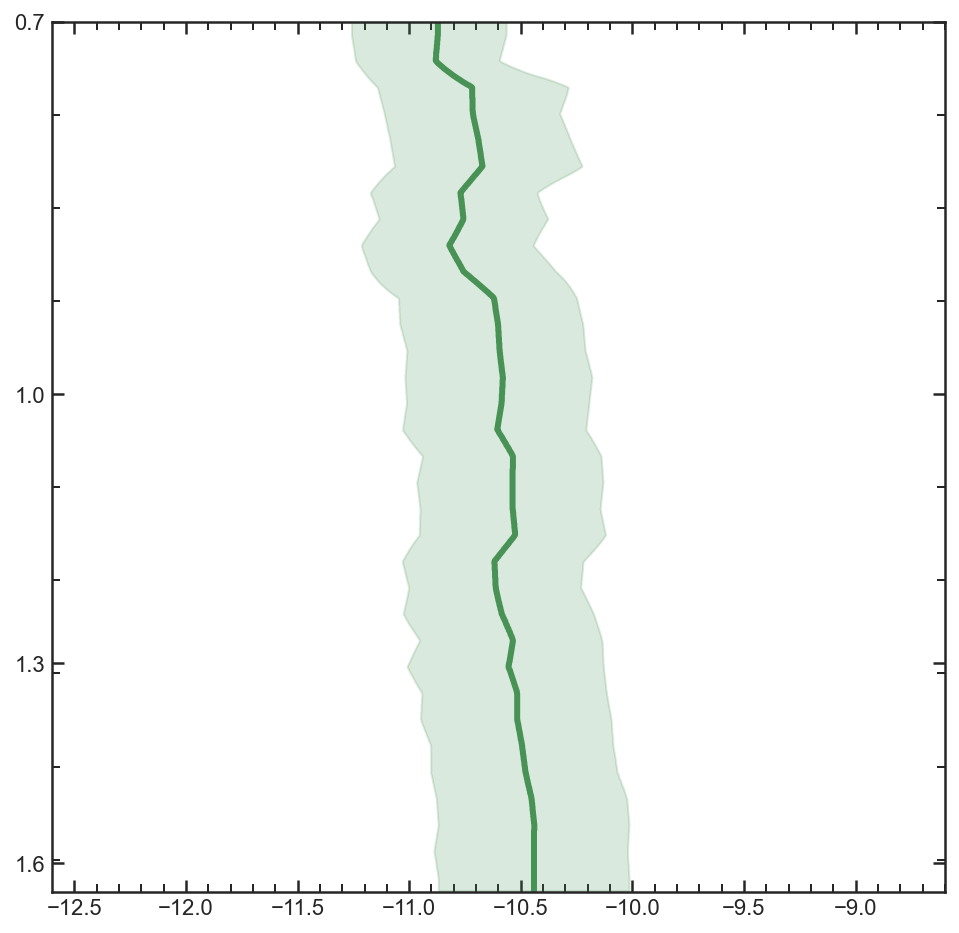

In [147]:
plt.figure(figsize = [8,8])

plt.plot(M,Z, '#489256', linewidth=3)
plt.fill_betweenx(Z,L, H, color = '#489256', alpha = 0.2)
plt.yticks(cosmo.lookback_time([0.7, 1.0, 1.3, 1.6]).value, [0.7, 1.0, 1.3, 1.6])
plt.ylim(cosmo.lookback_time(1.65).value,cosmo.lookback_time(0.7).value)
plt.xlim(-12.6, -8.6)

In [573]:
Z = np.linspace(6.35,9.6,500)
X = np.linspace(-15, -7, 500)

iSprob = interp2d(X[:-1],ZZ,PLM)


sfp = []

for i in Adb.index:
    idx =0
    sfp.append(iSprob(Adb.log_ssfr[i], cosmo.lookback_time(Adb.zgrism[i]).value)[0])
    
# Adb['sf_prob_ml_all'] = sfp_grid
Adb['sf_prob_ml'] = sfp

<AxesSubplot:xlabel='sf_prob_ml', ylabel='Sigma1'>

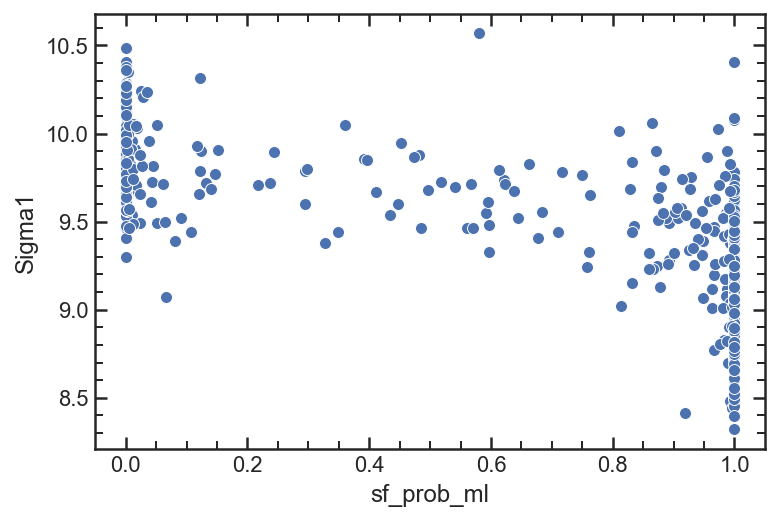

In [578]:
sea.scatterplot(Adb.sf_prob_ml, np.log10(Adb.Sigma1))

In [64]:
adb.to_pickle('../dataframes/fitdb/evolution_db_v2.pkl')

In [569]:
def bootstrap_samp(samp):
    allsamp = np.random.choice(samp, [1000, len(samp)])

    dist_grid = []
    for i in range(len(allsamp)):
        kde =stats.gaussian_kde(allsamp[i])
        dist_grid.append(kde(X_rng))

    mn = np.percentile(dist_grid,50, axis = 0)
    err = (np.percentile(dist_grid,84, axis = 0) - np.percentile(dist_grid,16, axis = 0)) / 2
    return mn, err


In [ ]:
'#a63b00','#d99300', '#3488ff','#10354c'

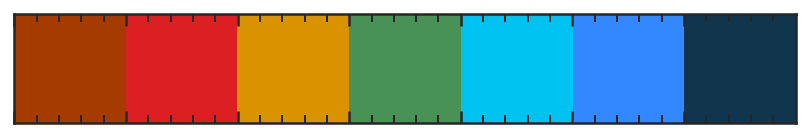

In [24]:
from matplotlib.colors import ListedColormap
sea.palplot(sea.color_palette(['#a63b00','#dc1f22','#d99300','#489256','#00c2f0', '#3488ff','#10354c'], ) )
clist = [[166, 58, 0],
[72, 146, 86],
[20, 57, 80]]

A = []
B = []
C = []
for i in range(2):
    A.extend(np.linspace(clist[i][0]/255, clist[i+1][0]/255, 500))
    B.extend(np.linspace(clist[i][1]/255, clist[i+1][1]/255, 500))
    C.extend(np.linspace(clist[i][2]/255, clist[i+1][2]/255, 500))
CMAP = ListedColormap(np.array([A,B,C]).T)


In [22]:
ssfr_grid = []
for i in Adb.query('0.7 < zgrism < 1.0').index:
    fname = glob('../data/posterior_cat/{}_{}*'.format(Adb.field[i], Adb.id[i]))  
    fit_db = np.load(fname[0], allow_pickle = True).item()    
    ssfr_grid.append(interp1d(fit_db['ssfr'],fit_db['Pssfr'], bounds_error=False, fill_value=0)(XX))

IT, WEI = Iterative_stacking(ssfr_grid, XX, iterations=1, resampling=5000)
iIT = interp1d(XX, WEI)(X)        
out = smooth(iIT, 2,74)
out /= np.trapz(out, X)

sf, s_mu, s_sig, qs, q_p, sp = X_dist_2(out, X)   


In [23]:
for i in range(50):
    sp[i]=0

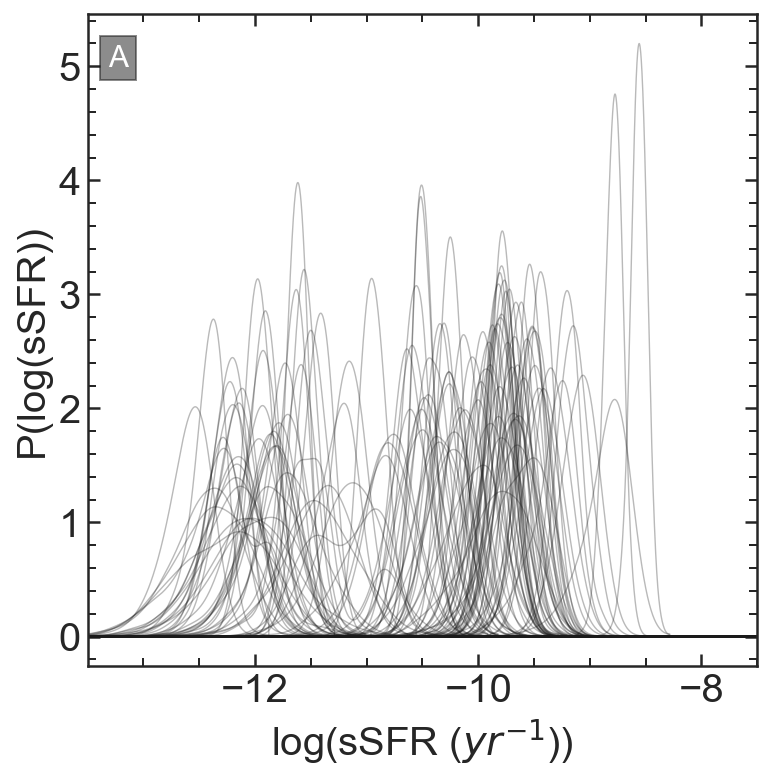

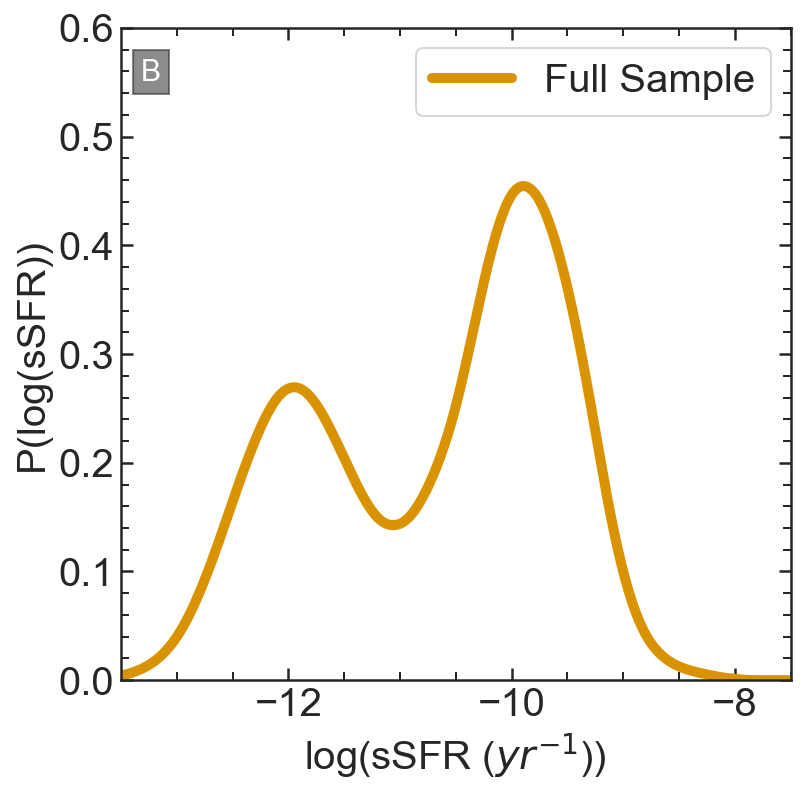

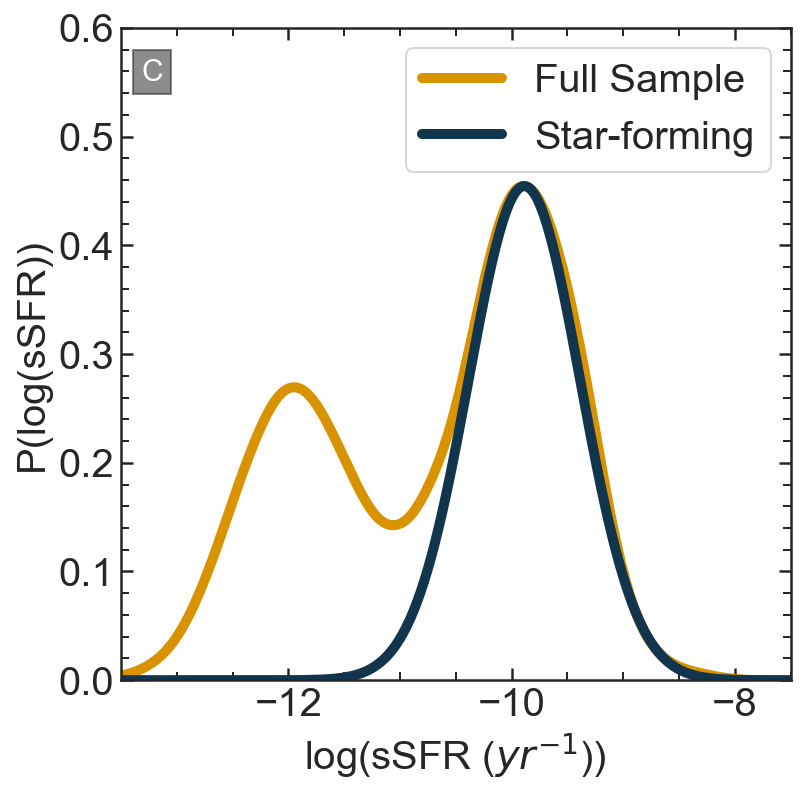

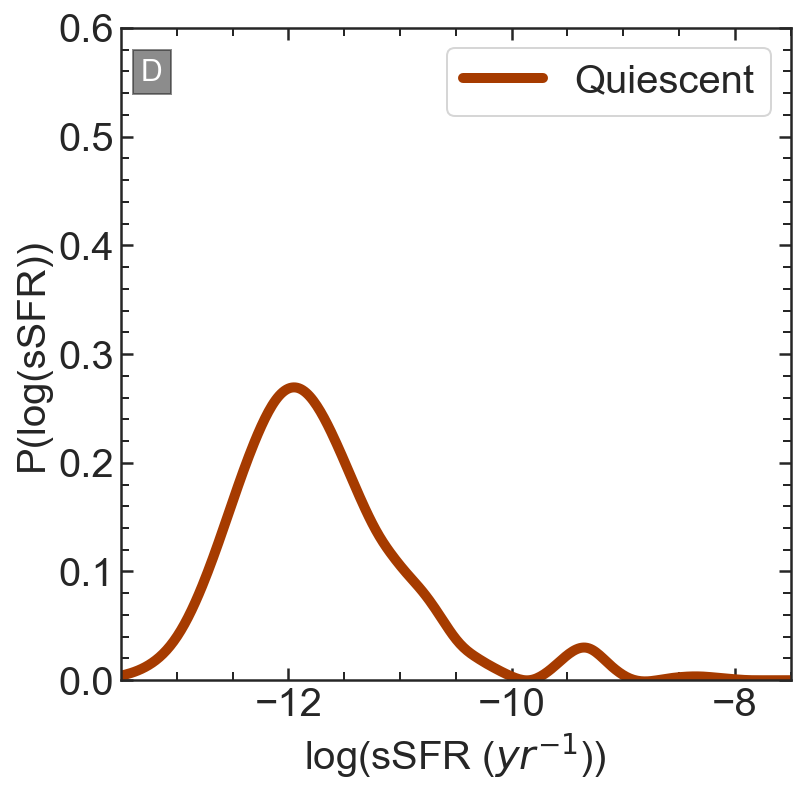

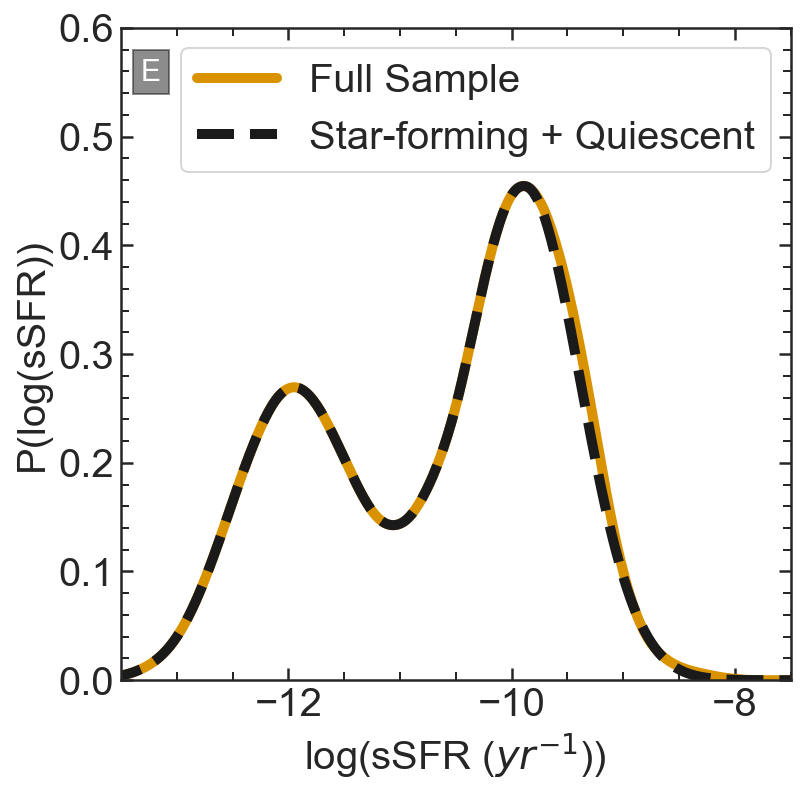

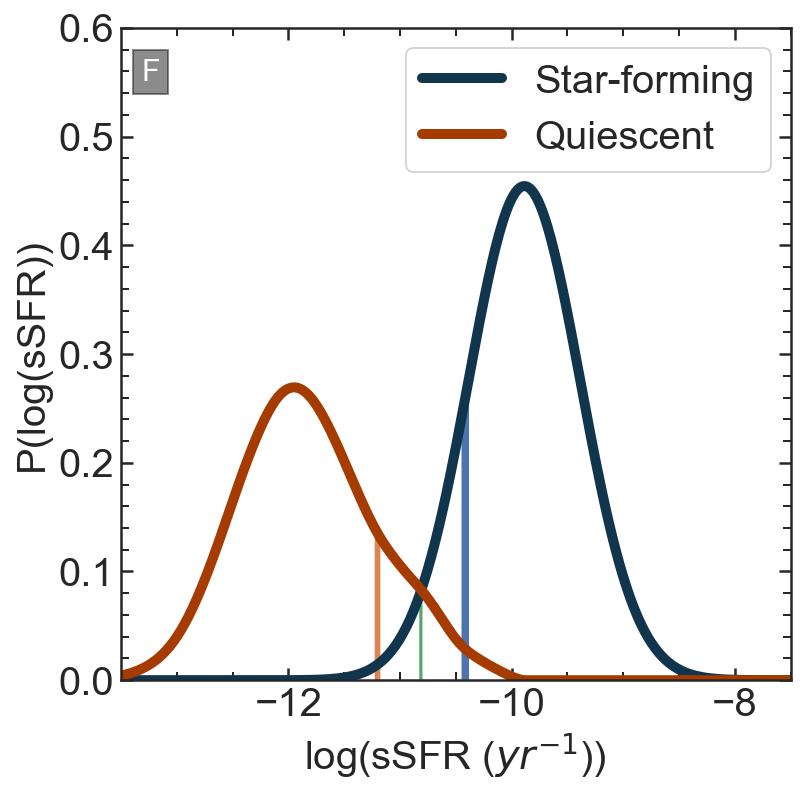

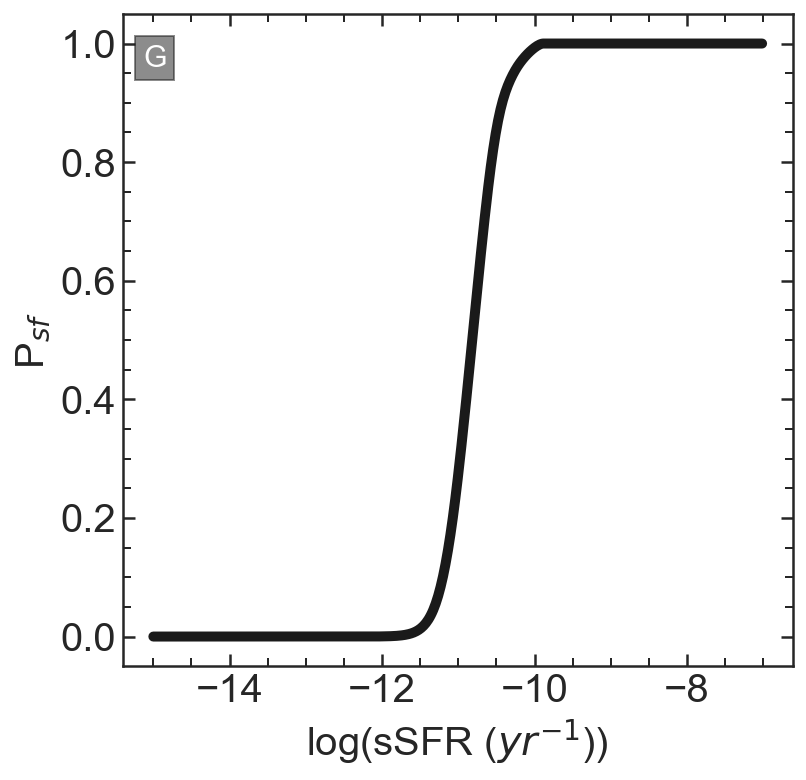

In [24]:
plt.figure(figsize = [6,6])
ax = plt.subplot()

plt.plot(XX, np.array(ssfr_grid).T, 'k', alpha = 0.3, linewidth = 0.7)
# plt.legend(loc = 2, fontsize = 20)

plt.ylabel('P(log(sSFR))',size=20)
plt.xlabel('log(sSFR ($yr^{-1}$))',size=20)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlim(-13.5,-7.5)
t= plt.text(0.03,0.92, 'A', fontsize = 15, color = 'w',transform=ax.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))
plt.savefig('../plots/evolution_plots/Prob_SF1.png', bbox_inches = 'tight')    
########

plt.figure(figsize = [6,6])
ax = plt.subplot()

plt.plot(X, out, linewidth = 5, color = '#DA9300', label = 'Full Sample')
plt.legend(loc = 1, fontsize = 20)

plt.ylabel('P(log(sSFR))',size=20)
plt.xlabel('log(sSFR ($yr^{-1}$))',size=20)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlim(-13.5,-7.5)
plt.ylim(0,0.6)
t= plt.text(0.03,0.92, 'B', fontsize = 15, color = 'w',transform=ax.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))
plt.savefig('../plots/evolution_plots/Prob_SF2.png', bbox_inches = 'tight')    
########

plt.figure(figsize = [6,6])
ax = plt.subplot()

plt.plot(X, out, linewidth = 5, color = '#DA9300', label = 'Full Sample')
plt.plot(X, sf, linewidth = 5, color = '#10354c', label = 'Star-forming')
plt.legend(loc = 1, fontsize = 20)

plt.ylabel('P(log(sSFR))',size=20)
plt.xlabel('log(sSFR ($yr^{-1}$))',size=20)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlim(-13.5,-7.5)
plt.ylim(0,0.6)
t= plt.text(0.03,0.92, 'C', fontsize = 15, color = 'w',transform=ax.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))
plt.savefig('../plots/evolution_plots/Prob_SF3.png', bbox_inches = 'tight')    
########
plt.figure(figsize = [6,6])
ax = plt.subplot()

plt.plot(X, out - sf, linewidth = 5, color = '#a63b00', label ='Quiescent')
plt.legend(loc = 1, fontsize = 20)

plt.ylabel('P(log(sSFR))',size=20)
plt.xlabel('log(sSFR ($yr^{-1}$))',size=20)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlim(-13.5,-7.5)
plt.ylim(0,0.6)
t= plt.text(0.03,0.92, 'D', fontsize = 15, color = 'w',transform=ax.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))
plt.savefig('../plots/evolution_plots/Prob_SF4.png', bbox_inches = 'tight')    
########
plt.figure(figsize = [6,6])
ax = plt.subplot()

plt.plot(X, out, linewidth = 5, color = '#DA9300', label = 'Full Sample')
# plt.plot(X, sf, linewidth = 5, color = '#10354c', label = 'Star-forming')
# plt.plot(X, qs, linewidth = 5, color = '#a63b00', label ='Quiescent')
plt.plot(X, sf + qs,'--', linewidth = 5, color = 'k', label ='Star-forming + Quiescent')

plt.legend(loc = 1, fontsize = 20)

plt.ylabel('P(log(sSFR))',size=20)
plt.xlabel('log(sSFR ($yr^{-1}$))',size=20)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlim(-13.5,-7.5)
plt.ylim(0,0.6)
t= plt.text(0.03,0.92, 'E', fontsize = 15, color = 'w',transform=ax.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))
plt.savefig('../plots/evolution_plots/Prob_SF5.png', bbox_inches = 'tight')    
#######

mini_sf = np.linspace(-10.46246571, -10.37718048)
isf = interp1d(X,sf)(mini_sf)

mini_sf2 = np.linspace(-10.84088949, -10.79449159)
isf2 = interp1d(X,sf)(mini_sf2)


mini_qs = np.linspace(-11.2405435, -11.1717566)
iqs = interp1d(X,qs)(mini_qs)

plt.figure(figsize = [6,6])
ax = plt.subplot()

plt.plot(X, sf, linewidth = 5, color = '#10354c', label = 'Star-forming')
plt.plot(X, qs, linewidth = 5, color = '#a63b00', label ='Quiescent')
plt.fill_between(mini_sf, isf)
plt.fill_between(mini_qs, iqs)
plt.fill_between(mini_sf2, isf2)

plt.legend(loc = 1, fontsize = 20)

plt.ylabel('P(log(sSFR))',size=20)
plt.xlabel('log(sSFR ($yr^{-1}$))',size=20)
plt.tick_params(axis='both', which='major', labelsize=20)
plt.xlim(-13.5,-7.5)
plt.ylim(0,0.6)
t= plt.text(0.03,0.92, 'F', fontsize = 15, color = 'w',transform=ax.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))
plt.savefig('../plots/evolution_plots/Prob_SF6.png', bbox_inches = 'tight')    
#######
plt.figure(figsize = [6,6])
ax = plt.subplot()
plt.plot(X[:-1], sp, color = 'k', linewidth = 5)

plt.ylabel('P$_{sf}$',size=20)
plt.xlabel('log(sSFR ($yr^{-1}$))',size=20)
plt.tick_params(axis='both', which='major', labelsize=20)

t= plt.text(0.03,0.92, 'G', fontsize = 15, color = 'w',transform=ax.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))
    
plt.savefig('../plots/evolution_plots/Prob_SF7.png', bbox_inches = 'tight')    

In [177]:
interp1d(sp,X[:-1])([0.08, 0.12]),interp1d(sp,X[:-1])([0.47, 0.53]),interp1d(sp,X[:-1])([0.88, 0.92]),

(array([-11.2405435, -11.1717566]),
 array([-10.84088949, -10.79449159]),
 array([-10.46246571, -10.37718048]))

In [355]:
# for i in Adb.query('-9.7 < log_ssfr < -9.5').index:
#     fld = Adb.field[i]
#     gal = Adb.id[i]
#     sp = np.load('../full_specs/{}_{}_fullspec.npy'.format(fld, gal), allow_pickle=True).item()
#     rshift = Adb.query('field == "{}" and id == {}'.format(fld, gal)).zgrism.values[0]
#     gs = gridspec.GridSpec(2,3, wspace = 0.25, hspace = 0.25)
#     plt.figure(figsize = [20,10])
#     ax1 = plt.subplot()

#     if len(sp['Bwv']) > 0:
#         IDX = [U for U in range(len(sp['Bwv'])) if 8150 < sp['Bwv'][U] < 15000]
#         ax1.errorbar(sp['Bwv'][IDX]/(1+rshift), sp['Bfl'][IDX], sp['Ber'][IDX], fmt = 'bo' ,markersize=3)

#     if len(sp['Rwv']) > 0:
#         ax1.errorbar(sp['Rwv']/(1+rshift), sp['Rfl'], sp['Rer'], fmt = 'ro' ,markersize=3)

#     ax1.errorbar(sp['Pwv']/(1+rshift), sp['Pfl'], sp['Per'], fmt = 'go', markersize = 10)

#     ax1.plot(sp['wave'], sp['flam'],
#             'k', linewidth = 2, label = '{}{}-{}, z = {:1.3f}'.format(fld[0], fld[1], gal, rshift))
#     ax1.set_xlim(0.95 * min(sp['Pwv']/(1+rshift)), 1.05 * max(sp['Pwv']/(1+rshift)))
#     ax1.legend(fontsize = 23)
#     ax1.set_xlabel(r'Observed Wavelength ($\AA$)',size=25)
#     ax1.set_ylabel(r'F$_\lambda$ (10$^{-18}$ erg/s/cm$^2$/$\AA$)',size=25)
#     ax1.tick_params(axis='both', which='major', labelsize=20)
#     ax1.set_xscale('log')
#     ax1.set_xticks([2500, 5000, 7500, 10000, 25000])
#     ax1.set_xticklabels([2500, 5000, 7500, 10000, 25000])
#     ax1.minorticks_off()

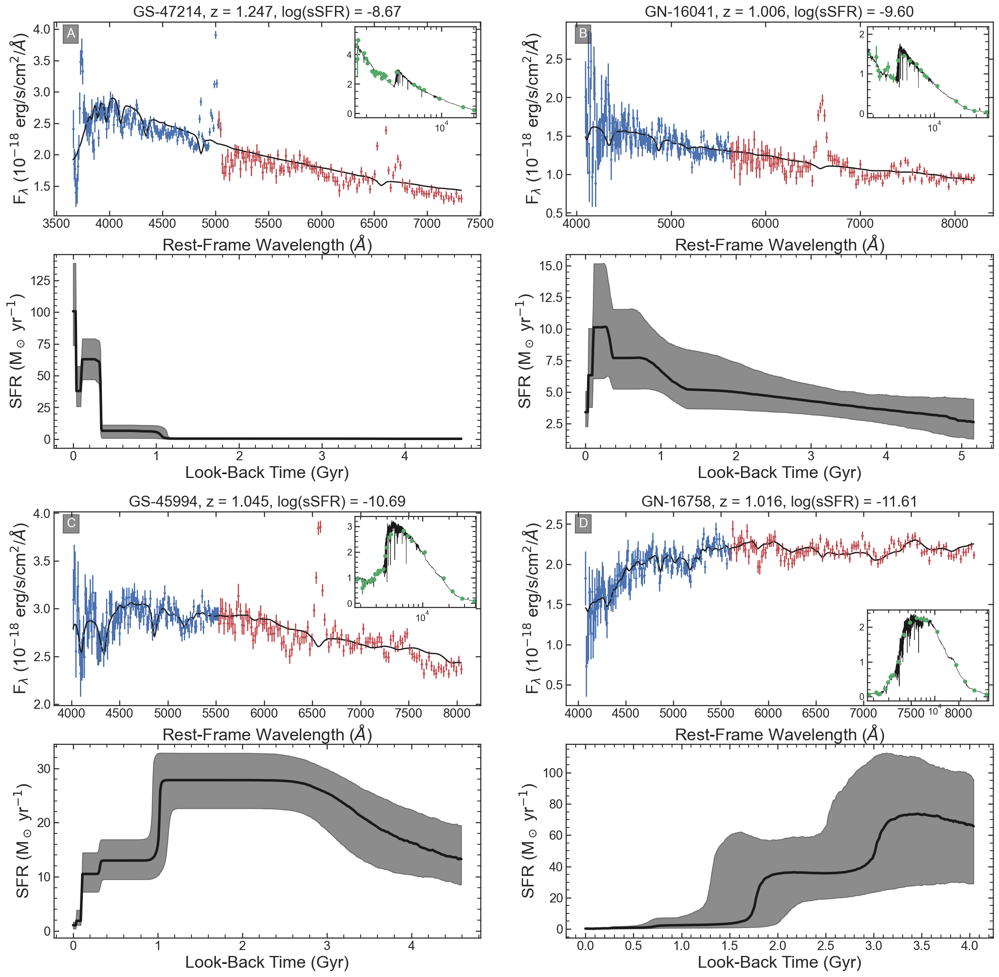

In [50]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes


gs = gridspec.GridSpec(2,2, hspace=0.15)
plt.figure(figsize = [20,20])
tags = ['A', 'B', 'C', 'D']
gids = [47214, 16041, 45994, 16758]
loc = ['upper right','upper right','upper right','lower right']
for i in range(len(gids)):
    gss = gridspec.GridSpecFromSubplotSpec(2,1, gs[i], hspace = 0.2)

    ax1 = plt.subplot(gss[0])
    ax2 = inset_axes(ax1, width=2, height=1.5,loc = loc[i])#bbox_to_anchor=(720, 615))
    
    ax3 = plt.subplot(gss[1])

    fld = Adb.query('id == {}'.format(gids[i])).field.values[0]
    gal = Adb.query('id == {}'.format(gids[i])).id.values[0]
    lssfr = Adb.query('id == {}'.format(gids[i])).log_ssfr.values[0]
    
    sp = np.load('../full_specs/{}_{}_fullspec.npy'.format(fld, gal), allow_pickle=True).item()
    rshift = Adb.query('field == "{}" and id == {}'.format(fld, gal)).zgrism.values[0]

    if len(sp['Bwv']) > 0:
        IDX = [U for U in range(len(sp['Bwv'])) if 8200 < sp['Bwv'][U] < 15000]
        ax1.errorbar(sp['Bwv'][IDX]/(1+rshift), sp['Bfl'][IDX]*1E18, sp['Ber'][IDX]*1E18, fmt = 'bo' ,markersize=2)
        ax1.plot(sp['Bwv'][IDX]/(1+rshift), sp['Bmfl'][IDX]*1E18, 'k',
                 label = '{}{}-{}, z = {:1.3f}\nlog(sSFR) = {:1.2f}'.format(fld[0], fld[1], gal, rshift, lssfr))

    if len(sp['Rwv']) > 0:
        ax1.errorbar(sp['Rwv']/(1+rshift), sp['Rfl']*1E18, sp['Rer']*1E18, fmt = 'ro' ,markersize=2)
        ax1.plot(sp['Rwv']/(1+rshift), sp['Rmfl']*1E18, 'k')

    
    ax2.plot(sp['wave'], sp['flam']*1E18,'k', linewidth = 0.5,zorder = 0)
    ax2.errorbar(sp['Pwv']/(1+rshift), sp['Pfl']*1E18, sp['Per']*1E18, fmt = 'go', markersize = 4, zorder=1)

    t= ax1.text(0.03,0.92, tags[i], fontsize = 15, color = 'w',transform=ax1.transAxes)
    t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))
    
    ax2.set_xlim(0.95 * min(sp['Pwv']/(1+rshift)), 1.05 * max(sp['Pwv']/(1+rshift)))
#     ax1.legend(fontsize = 15)
    ax1.set_xlabel(r'Rest-Frame Wavelength ($\AA$)',size=20)
    ax1.set_ylabel(r'F$_\lambda$ (10$^{-18}$ erg/s/cm$^2$/$\AA$)',size=20)
    ax1.tick_params(axis='both', which='major', labelsize=15)
    ax2.set_xscale('log')
    ax1.minorticks_off()
    ax1.set_title('{}{}-{}, z = {:1.3f}, log(sSFR) = {:1.2f}'.format(fld[0], fld[1], gal, rshift, lssfr),
                 fontsize = 18)
    
    lbt,sfh = np.load('../data/SFH/{}_{}.npy'.format(fld, gal))
    lbt,sfh16 = np.load('../data/SFH/{}_{}_16.npy'.format(fld, gal))
    lbt,sfh84 = np.load('../data/SFH/{}_{}_84.npy'.format(fld, gal))
    
    ax3.plot(lbt,sfh, color = 'k', linewidth = 3)
    ax3.fill_between(lbt, sfh16,sfh84, alpha =0.5, color = 'k')
    ax3.set_xlabel(r'Look-Back Time (Gyr)',size=20)
    ax3.set_ylabel(r'SFR (M$_\odot$ yr$^{-1}$)',size=20)
    ax3.tick_params(axis='both', which='major', labelsize=15)
plt.savefig('../plots/evolution_plots/spec_plot_2.pdf', bbox_inches = 'tight')    

In [226]:
def SSFH(lbt,sfh, lmass, rshift):
    mass = 10**lmass
    massevo = (np.cumsum(sfh[::-1]) /max(np.cumsum(sfh[::-1])))[::-1] * mass
    age = cosmo.age(rshift).value
    t = (age - lbt)*1E9
    return sfh / massevo, t


Qts = []
Qts_s = []
Qz = []
lm=[]
tq=[]
t50=[]
gslp = []
rshift = []
# for i in Adb.query('sf_prob_ml < 0.1').index:
for i in Adb.index:
    
    lbt, sfh = np.load('../data/B_sfh/{}_{}.npy'.format(Adb.field[i], Adb.id[i]))
    ssfh,t = SSFH(lbt,sfh,Adb.lmass[i], Adb.zgrism[i])

    lssfh = np.log10(ssfh)
    lsflim = np.log10(1/(3*t))
    lqlim = np.log10(1/(20*t))

    stoq,stoq_sf, qtos, falseq, falser,qz, gx ,gy =  crossover(lbt,lssfh,lqlim,lsflim, Adb.zgrism[i])
    if len(stoq) > 0:
        Qts.append(stoq[0])
        Qts_s.append(stoq_sf[0]/stoq[0])
        Qz.append(qz)
    else:
        Qts.append(-99)
        Qts_s.append(-99)
        Qz.append(-99)
        
    lm.append(Adb.lmass[i])
    tq.append(Adb.t_q[i])        
    t50.append(Adb.t_50[i]) 
    rshift.append(Adb.zgrism[i])
    if gx > 0:
        gslp.append(gy/gx) 
    else:
        gslp.append(-99) 
        
#     break

Qts = np.array(Qts)
Qts_s = np.array(Qts_s)
Qz = np.array(Qz)
lm=np.array(lm)
tq=np.array(tq)
t50=np.array(t50)
gslp = np.array(gslp)
rshift= np.array(rshift)

<AxesSubplot:>

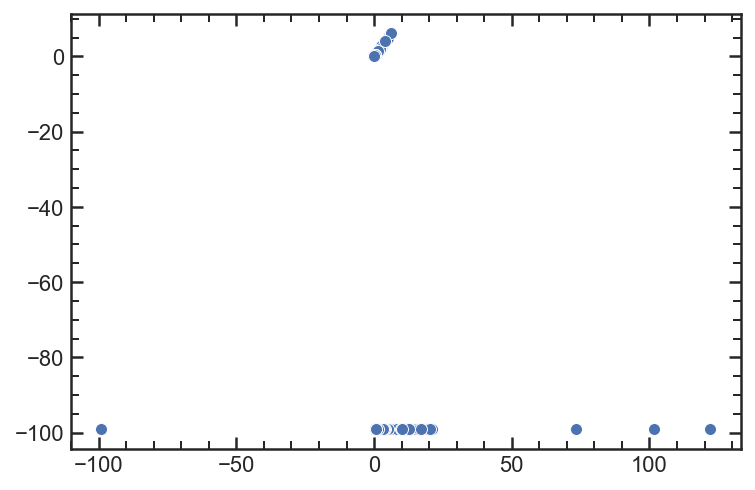

In [205]:
for i in range(len(Qts_s)):
    if Qts_s[i] < 0:
        Qts_s[i] = gslp[i]

sea.scatterplot(Qts_s, gslp)

In [227]:
Adb['q_slope'] = Qts_s
Adb['q_time'] = Qts

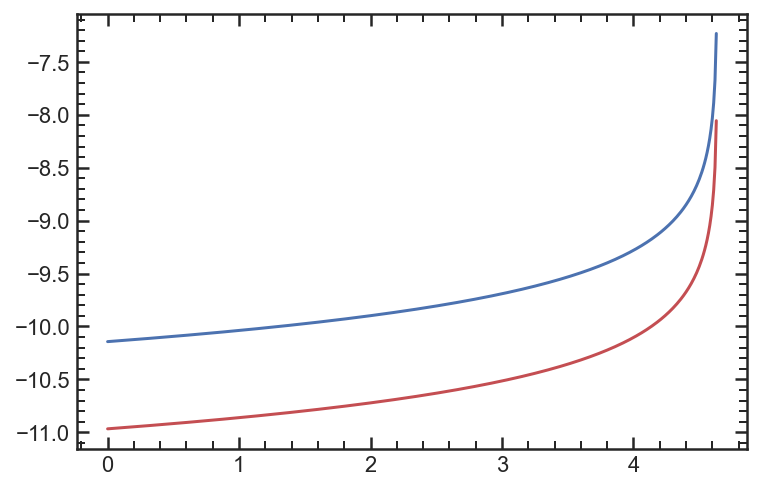

In [148]:
for i in Adb.index:
    lbt, sfh = np.load('../data/B_sfh/{}_{}.npy'.format(Adb.field[i], Adb.id[i]))
    lbt, sfh_16 = np.load('../data/B_sfh/{}_{}_16.npy'.format(Adb.field[i], Adb.id[i]))
    lbt, sfh_84 = np.load('../data/B_sfh/{}_{}_84.npy'.format(Adb.field[i], Adb.id[i]))
    
    ssfh,t = SSFH(lbt,sfh,Adb.lmass[i], Adb.zgrism[i])
    ssfh_16,t = SSFH(lbt,sfh_16,Adb.lmass[i], Adb.zgrism[i])
    ssfh_84,t = SSFH(lbt,sfh_84,Adb.lmass[i], Adb.zgrism[i])

    lssfh = np.log10(ssfh)
    lssfh_16 = np.log10(ssfh_16)
    lssfh_84 = np.log10(ssfh_84)
    
    lsflim = np.log10(1/(3*t))
    lqlim = np.log10(1/(20*t))
    
#     plt.plot(lbt, lssfh,'k', linewidth = 2)
#     plt.plot(lbt, lssfh_16,'y', linewidth = 2)
#     plt.plot(lbt, lssfh_84,'c', linewidth = 2)
    
    plt.plot(lbt, lqlim, 'r')
    plt.plot(lbt, lsflim,'b')
    
    break

(-0.1, 5.0)

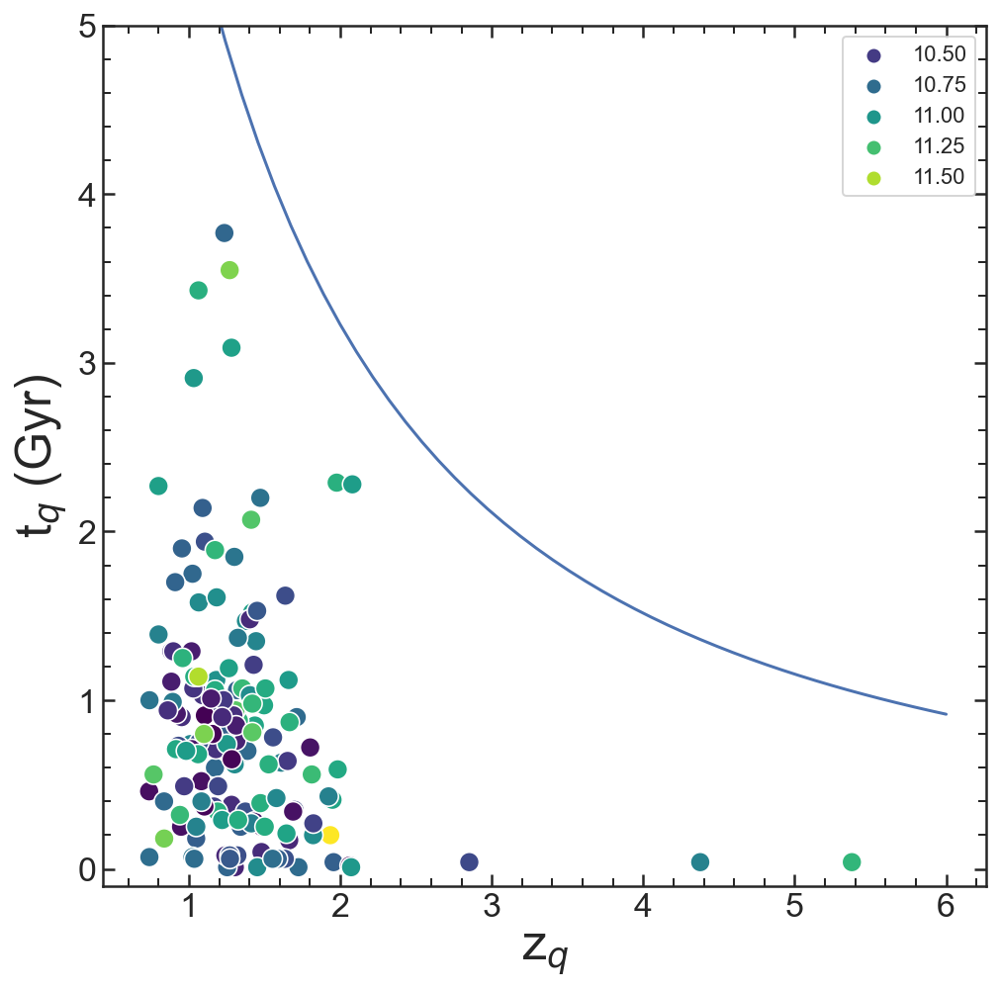

In [178]:
rshifts = np.linspace(0.7,6)
plt.figure(figsize = [8,8])

sea.scatterplot(Qz[Qz>0],Qts[Qz>0], hue = lm[Qz>0], s=100, palette = 'viridis')

plt.plot(rshifts, cosmo.age(rshifts))

plt.xlabel('z$_q$', fontsize = 25)
plt.ylabel('t$_{q}$ (Gyr)', fontsize = 25)

plt.tick_params(axis='both', which='major', labelsize=17)
plt.ylim(-0.1,5)

# plt.savefig('../plots/evolution_plots/tq_zq.png', bbox_inches = 'tight')    


<AxesSubplot:>

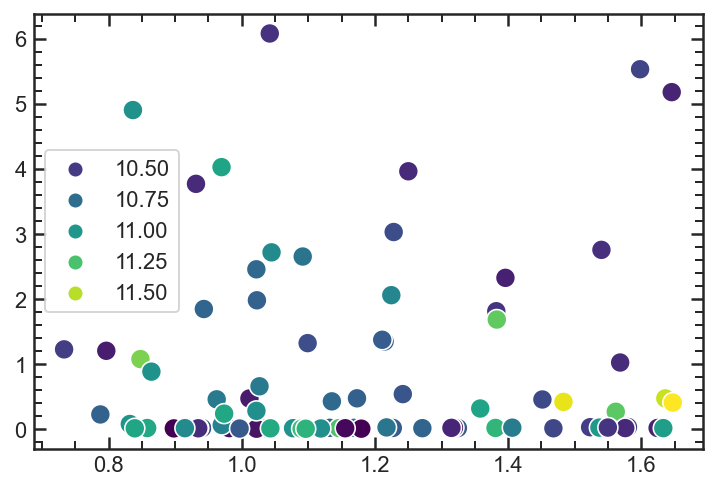

In [195]:
sea.scatterplot( rshift[gslp > -99],gslp[gslp > -99], lm[gslp>-99], s=100, palette = 'viridis')

<AxesSubplot:>

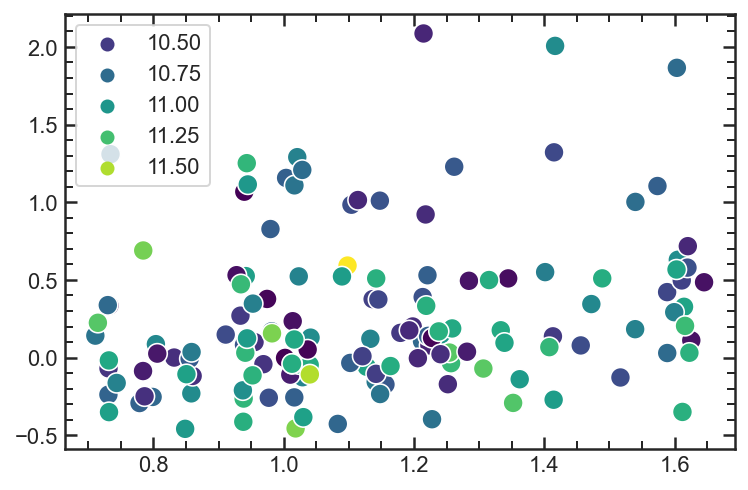

In [197]:
sea.scatterplot(rshift[Qz>0],np.log10(Qts_s[Qz>0]), hue = lm[Qz>0], s=100, palette = 'viridis')


<AxesSubplot:ylabel='Density'>

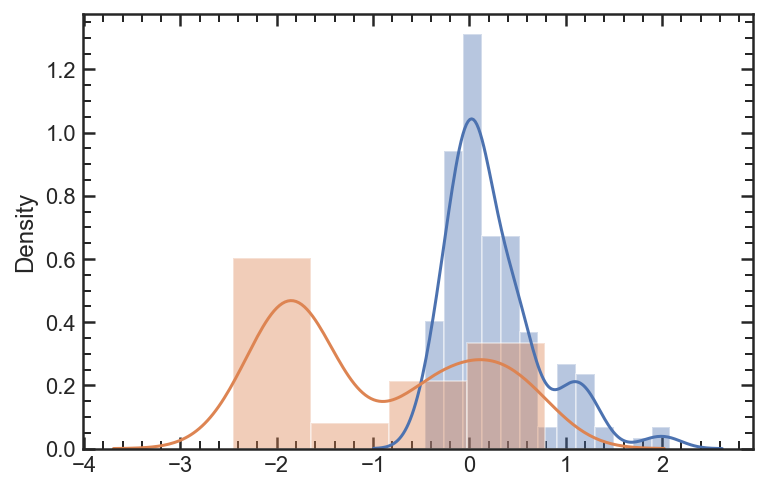

In [200]:
sea.distplot(np.log10(Qts_s[Qz>0]))
sea.distplot(np.log10(gslp[gslp > -99]))

<AxesSubplot:>

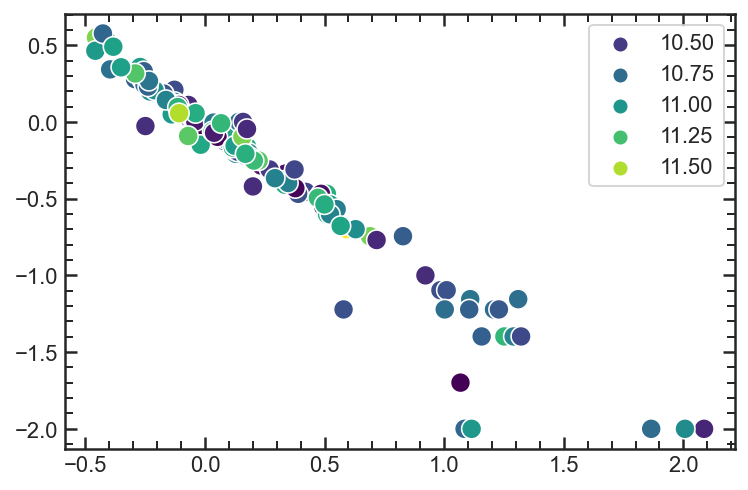

In [202]:
sea.scatterplot(np.log10(Qts_s[Qz>0]), np.log10(Qts[Qz>0]), hue = lm[Qz>0], s=100, palette = 'viridis')
# Qts_s

In [460]:
def crossover(lbt,lssfh,lqlim,lsflim, rshift):
    stoq = []
    stoq_t = []
    qtos= []
    A = 'SF'
    falseq = 0
    falser = 0
    lbtq = 0
    ssfr_span = []
    span = []
    for i in range(len(lbt)):
        if lssfh[-(i+1)] > lsflim[-(i+1)] and A == 'SF':
            A = 'SF'
            span = []
            ssfr_span = []
    
        if lssfh[-(i+1)] > lsflim[-(i+1)] and A == 'Gs':
            A = 'SF'
            span = []  
            ssfr_span = []
            
            falseq +=1

        if lssfh[-(i+1)] > lsflim[-(i+1)] and A == 'Gq':
            span.append(lbt[-(i+1)]) 
            ssfr_span.append([lssfh[-(i+1)]])
            
            A='SF'   
            qtos.append(np.abs(np.diff(span)[0]))
            span=[]
            ssfr_span = []

        if lqlim[-(i+1)] < lssfh[-(i+1)] < lsflim[-(i+1)] and A == 'SF':
            span.append(lbt[-(i+1)]) 
            ssfr_span.append(lssfh[-(i+1)])
            
            A='Gs'

        if lqlim[-(i+1)] < lssfh[-(i+1)] < lsflim[-(i+1)] and A == 'Q':
            span.append(lbt[-(i+1)]) 
            ssfr_span.append(lssfh[-(i+1)])
            
            A='Gq'

        if lssfh[-(i+1)] < lqlim[-(i+1)] and A == 'Gs':
            span.append(lbt[-(i+1)]) 
            ssfr_span.append(lssfh[-(i+1)])
            
            A='Q'   
            stoq.append(np.abs(np.diff(span)[0]))
            stoq_t.append(np.abs(np.diff(ssfr_span)[0]))
            
            lbtq = lbt[-(i+1)]
            span=[]
            ssfr_span = []

        if lssfh[-(i+1)] < lqlim[-(i+1)] and A == 'Gq':
            A = 'Q'
            span = []  
            ssfr_span = []
            
            falser +=1

        if lssfh[-(i+1)] < lqlim[-(i+1)] and A == 'SF':
            span.append(lbt[-(i+1)]) 
            ssfr_span.append(lssfh[-(i+1)])
            
            A='Q'   
            stoq.append(0)
            stoq_t.append(0)
            
            lbtq = lbt[-(i+1)]
            span=[]
            ssfr_span = []      
            
            
    qz = -99
    
    for i in range(len(stoq)):
        qz = z_at_value(cosmo.lookback_time, cosmo.lookback_time(rshift) + lbtq*u.Gyr)
        
    gx = 0
    gy = 0
    if len(stoq) == 0 and len(span) > 0:
        gx = np.abs(span[0])
        gy = np.abs(ssfr_span[0] - lssfh[0])
        
        
    return stoq, stoq_t, qtos, falseq, falser, qz, gx, gy

In [9]:
params = ['bfm1','bfm2','bfm3','bfm4','bfm5','bfm6']


for i in Adb.index:
    if not Adb.bfa[i]**2 > 0:
        print(Adb.field[i], Adb.id[i], Adb.bfm6[i])
        fl = glob('../data/posteriors/{}_{}_SFfit_p1_fits.npy'.format(Adb.field[i], Adb.id[i]))[0]
        dfit = np.load(fl, allow_pickle = True).item()
#         for p in params:
        Adb['bfa'][i] = dfit['bfa']

In [20]:
f = []
g = []
for i in Adb.index:
    if not os.path.isfile('../full_specs/{}_{}_fullspec.npy'.format(Adb.field[i], Adb.id[i])):
        f.append(Adb.field[i])
        g.append(Adb.id[i])
        print(Adb.field[i], Adb.id[i])
print(f,g)

[] []


In [392]:
Adb.to_pickle('../dataframes/fitdb/evolution_db_masslim.pkl')

In [607]:
dfit = np.load('../data/posteriors/GND_25773_SFfit_p1_fits.npy', allow_pickle = True).item()

In [7]:
Adb.query('field == "{}" and id == {}'.format(f[0],g[0]))['zgrism'].values[0]
# specz = fit_db['zgrism'].values[0]


1.089594699366129

In [14]:
lbt,sfh = np.load('../data/SFH/GSD_46846.npy')

plt.plot(lbt,sfh)

In [109]:
def Stack(wv, flxgrid , errgrid):
    flgrid = np.transpose(flxgrid)
    errgrid = np.transpose(errgrid)
    weigrid = errgrid ** (-2)
    infmask = np.isinf(weigrid)
    weigrid[infmask] = 0
    ################

    stack, err = np.zeros([2, len(wv)])
    for i in range(len(wv)):
        stack[i] = np.sum(flgrid[i] * weigrid[[i]]) / (np.sum(weigrid[i]))        
        err[i] = 1 / np.sqrt(np.sum(weigrid[i]))
    ################
    
    return stack, err

def stack_setup(db, swave):
    flxgrid = []
    errgrid = []

    for i in db.index:
        try:
            ffl = np.zeros_like(swave).astype(float)
            fer = np.zeros_like(swave).astype(float)
            sp = np.load('../full_specs/{}_{}_fullspec.npy'.format(db.field[i], db.id[i]), allow_pickle=True).item()
            IDX = [U for U in range(len(sp['wave'])) if 5400 < sp['wave'][U] < 5800]
            Nfact = np.trapz(sp['flam'][IDX],sp['wave'][IDX])
    #         print(Nfact)

            if not Nfact > 0:
                print(db.field[i], db.id[i],i)

            if len(sp['Bwv']) > 0:
                bwv = sp['Bwv'] / (1 + db.zgrism[i])
                bfl = interp1d(bwv,sp['Bfl']/Nfact, fill_value=0, bounds_error=False)(swave)
                ber = interp1d(bwv,sp['Ber']/Nfact, fill_value=0, bounds_error=False)(swave)
                ffl += bfl
                fer += ber

            if len(sp['Rwv']) > 0:
                rwv = sp['Rwv'] / (1 + db.zgrism[i])
                rfl = interp1d(rwv,sp['Rfl']/Nfact, fill_value=0, bounds_error=False)(swave)
                rer = interp1d(rwv,sp['Rer']/Nfact, fill_value=0, bounds_error=False)(swave)
                ffl += rfl
                fer += rer
            fer[fer == 0] = 1
            flxgrid.append(ffl)
            errgrid.append(fer)   
        except:
            print('error',db.field[i], db.id[i],i)
            
    W = Leave_one_out_STACK(swave,flxgrid,errgrid)
    
    for i in range(len(W)):
        errgrid[i] = np.sqrt(errgrid[i]**2 + (flxgrid[i]*W[i])**2)
    
    return Stack(swave, flxgrid, errgrid)#, flxgrid, errgrid

def plot_spec(ax,wv,fl,er, lim1, lim2, color, label):
    IDS = [U for U in range(len(wv)) if lim1 < wv[U] < lim2]
    ax.errorbar(wv[IDS], fl[IDS], er[IDS], fmt = 'o', markersize = 2,color=color,label = '{}'.format(label))
    # O
    ax.axvline(3727.092 ,linestyle='--', alpha=0.3, color = 'b', linewidth = 2)
    ax.axvline(5008.240,linestyle='--', alpha=0.3, color = 'b', linewidth = 2)
    # Balmer
    ax.axvline(4102.89 ,linestyle='--', alpha=0.3, color = 'r', linewidth = 2)
    ax.axvline(4341.68 ,linestyle='--', alpha=0.3, color = 'r', linewidth = 2)
    ax.axvline(4862.68 ,linestyle='--', alpha=0.3, color = 'r', linewidth = 2)
    ax.axvline(6564.61 ,linestyle='--', alpha=0.3, color = 'r', linewidth = 2)

    ax.axvline(6718.29,linestyle='--', alpha=0.3, color = 'b', linewidth = 2) #SII
#     ax.axvline(2799.117,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) # MgII

    ax.axvline(3934,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) # H
    ax.axvline(3969,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) # K
    ax.axvline(4305,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) # G

    ax.axvline(5176.7,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) # Mg
    ax.axvline(5895.6,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) #Na
    ax.axvline(8500,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) #CaII
    ax.axvline(8544,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) #CaII
    ax.axvline(8664,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) #CaII
    ax.legend(loc=4, fontsize=15)

def stack_phot(DB):
    PWV = []
    PER = []
    PFL = []

    for ID in DB.index:
        pwv,pfl,per,pnum = np.load('../phot/{0}_{1}_phot.npy'.format(DB.field[ID], DB.id[ID]))

        pwv = pwv[pfl > 0] 
        per = per[pfl > 0] 
        pfl = pfl[pfl > 0]

        pfl = pfl[np.argsort(pwv)]
        per = per[np.argsort(pwv)]
        pwv = pwv[np.argsort(pwv)]

        IDX = [U for U in range(len(pwv)) if 4000 < pwv[U] < 18000]
        
        norm = np.trapz(pfl[IDX],pwv[IDX]/ (1 +DB.zgrism[ID] ))

        for w in range(len(pwv)):
            if 7000 < pwv[w]/ (1 +DB.zgrism[ID] ) < 9000 and pfl[w] /norm < 5E-5:
                print(DB.field[ID], DB.id[ID])
        
        PWV.extend(pwv / (1 +DB.zgrism[ID] ))
        PER.extend(per/norm)
        PFL.extend(pfl/norm)

        
    PWV = np.array(PWV)
    PFL = np.array(PFL)
    PER = np.array(PER)
    
    return PWV, PFL, PER

def Leave_one_out_STACK(wave, flxgrid, errgrid):
    
    Y,Ye = Stack(wave, flxgrid, errgrid)

    weights = np.zeros([len(flxgrid), len(wave)])
    for i in range(len(flxgrid)):
        fgrid = []
        egrid = []
        for ii in range(len(flxgrid)):
            if i != ii:
                fgrid.append(flxgrid[ii])
                egrid.append(errgrid[ii])  
        Ybar, Ybare = Stack(wave, fgrid, egrid)
        weights[i] = np.abs(Ybar - Y) / Y
    return weights

In [33]:
swave = np.arange(1000,10000,15)
Ldb = Adb.query('lmass < 10.8')
Hdb = Adb.query('lmass > 10.8')

s1_flx, s1_err = stack_setup(Ldb.query('0.0 < sf_prob_ml < 0.1'), swave)
s2_flx, s2_err = stack_setup(Ldb.query('0.1 < sf_prob_ml < 0.9'), swave)
s3_flx, s3_err = stack_setup(Ldb.query('0.9 < sf_prob_ml < 1'), swave)

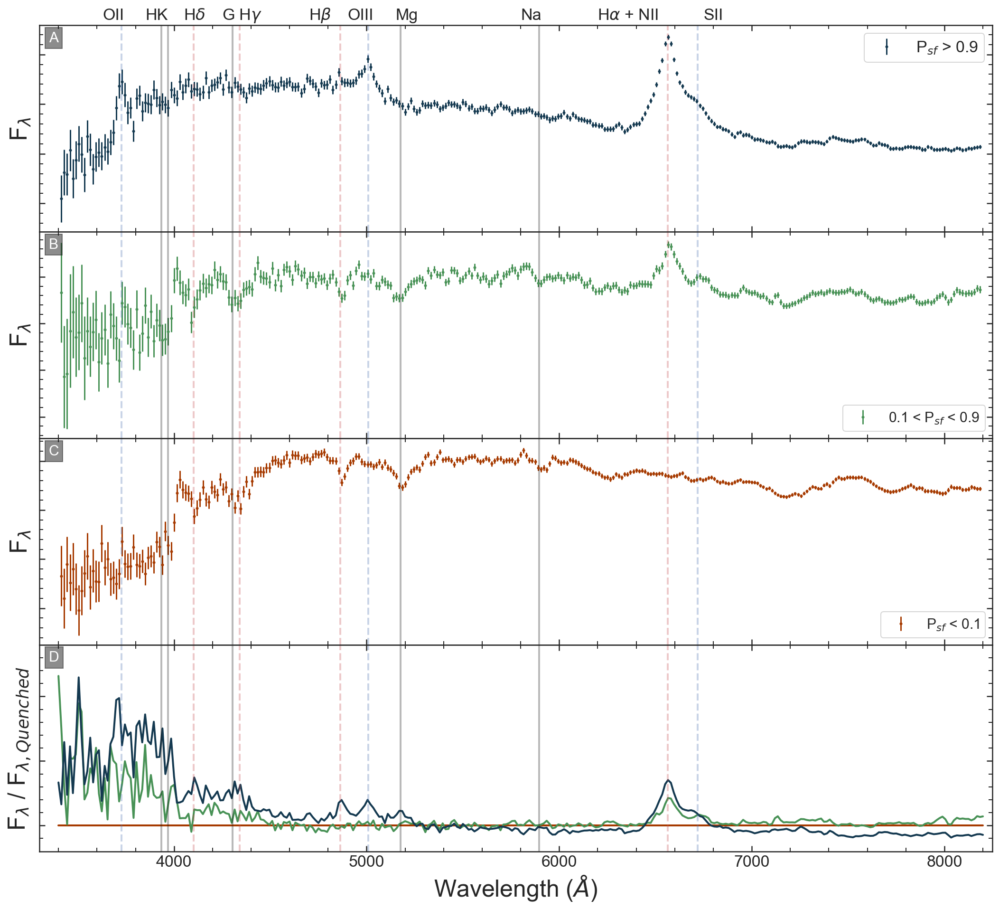

In [35]:
gs = gridspec.GridSpec(4,1,wspace=0,hspace = 0 )
    
plt.figure(figsize=[18,16])
ax1=plt.subplot(gs[0]);ax2=plt.subplot(gs[1]);ax3=plt.subplot(gs[2]);ax4=plt.subplot(gs[3])

plot_spec(ax3, swave, s1_flx, s1_err, 3400, 8200, color = CMAP(0/2),label = 'P$_{sf}$ < 0.1')
plot_spec(ax2, swave, s2_flx, s2_err, 3400, 8200, color = CMAP(1/2),label = '0.1 < P$_{sf}$ < 0.9')
plot_spec(ax1, swave, s3_flx, s3_err, 3400, 8200, color = CMAP(2/2),label = 'P$_{sf}$ > 0.9')

ax4.plot(swave[160:481], s1_flx[160:481]/s1_flx[160:481], color = CMAP(0/2), linewidth = 2)
ax4.plot(swave[160:481], s2_flx[160:481]/s1_flx[160:481], color = CMAP(1/2), linewidth = 2)
ax4.plot(swave[160:481], s3_flx[160:481]/s1_flx[160:481], color = CMAP(2/2), linewidth = 2)
ax4.set_xlim(3300, 8250)
ax4.set_ylim(0.8, 2.4)

ax4.axvline(3727.092 ,linestyle='--', alpha=0.3, color = 'b', linewidth = 2)
ax4.axvline(5008.240,linestyle='--', alpha=0.3, color = 'b', linewidth = 2)
# Balmer
ax4.axvline(4102.89 ,linestyle='--', alpha=0.3, color = 'r', linewidth = 2)
ax4.axvline(4341.68 ,linestyle='--', alpha=0.3, color = 'r', linewidth = 2)
ax4.axvline(4862.68 ,linestyle='--', alpha=0.3, color = 'r', linewidth = 2)
ax4.axvline(6564.61 ,linestyle='--', alpha=0.3, color = 'r', linewidth = 2)

ax4.axvline(6718.29,linestyle='--', alpha=0.3, color = 'b', linewidth = 2) #SII
#     ax.axvline(2799.117,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) # MgII

ax4.axvline(3934,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) # H
ax4.axvline(3969,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) # K
ax4.axvline(4305,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) # G

ax4.axvline(5176.7,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) # Mg
ax4.axvline(5895.6,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) #Na
ax4.axvline(8500,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) #CaII
ax4.axvline(8544,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) #CaII
ax4.axvline(8664,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) #CaII

ax1.set_yticklabels([]);ax2.set_yticklabels([]);ax3.set_yticklabels([]);ax4.set_yticklabels([])

ax1.set_xlim(3300,8250);ax2.set_xlim(3300,8250);ax3.set_xlim(3300,8250);


ax1.set_xlabel('Wavelength ($\AA$)', fontsize = 25);ax2.set_xlabel('Wavelength ($\AA$)', fontsize = 25);
ax3.set_xlabel('Wavelength ($\AA$)', fontsize = 25);ax4.set_xlabel('Wavelength ($\AA$)', fontsize = 25);


ax1.set_ylabel('F$_\lambda$', fontsize = 25);ax2.set_ylabel('F$_\lambda$', fontsize = 25);
ax3.set_ylabel('F$_\lambda$', fontsize = 25);ax4.set_ylabel('F$_\lambda$ / F$_{\lambda, Quenched}$', fontsize = 25);

ax1.legend(fontsize = 17)
# ax3.legend(fontsize = 12)
ax1.tick_params(axis='both', which='major', labelsize=17);ax2.tick_params(axis='both', which='major', labelsize=17)
ax3.tick_params(axis='both', which='major', labelsize=17);ax4.tick_params(axis='both', which='major', labelsize=17)

l_n = ['OII', 'HK','H$\delta$', 'G H$\gamma$', 'H$\\beta$', 'OIII', 'Mg', 'Na', 'H$\\alpha$ + NII', 'SII']
l_x = [3630,3850, 4050, 4250, 4700, 4900, 5150, 5800, 6200, 6750]

ax1.set_xticklabels([])
ax2.set_xticklabels([])

for i in range(len(l_n)):
    ax1.text(l_x[i], 0.00335, l_n[i], fontsize=17)

t= ax1.text(0.01,0.92, 'A', fontsize = 15, color = 'w',transform=ax1.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))
    
t= ax2.text(0.01,0.92, 'B', fontsize = 15, color = 'w',transform=ax2.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

t= ax3.text(0.01,0.92, 'C', fontsize = 15, color = 'w',transform=ax3.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

t= ax4.text(0.01,0.92, 'D', fontsize = 15, color = 'w',transform=ax4.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

plt.savefig('../plots/evolution_plots/PSF_stacked_lm_4.pdf', bbox_inches = 'tight')    

In [36]:
swave = np.arange(1000,10000,15)
s1_flx, s1_err = stack_setup(Hdb.query('sf_prob_ml < 0.1'), swave)
s2_flx, s2_err = stack_setup(Hdb.query('0.1 < sf_prob_ml < 0.9'), swave)
s3_flx, s3_err = stack_setup(Hdb.query('sf_prob_ml > 0.9'), swave)


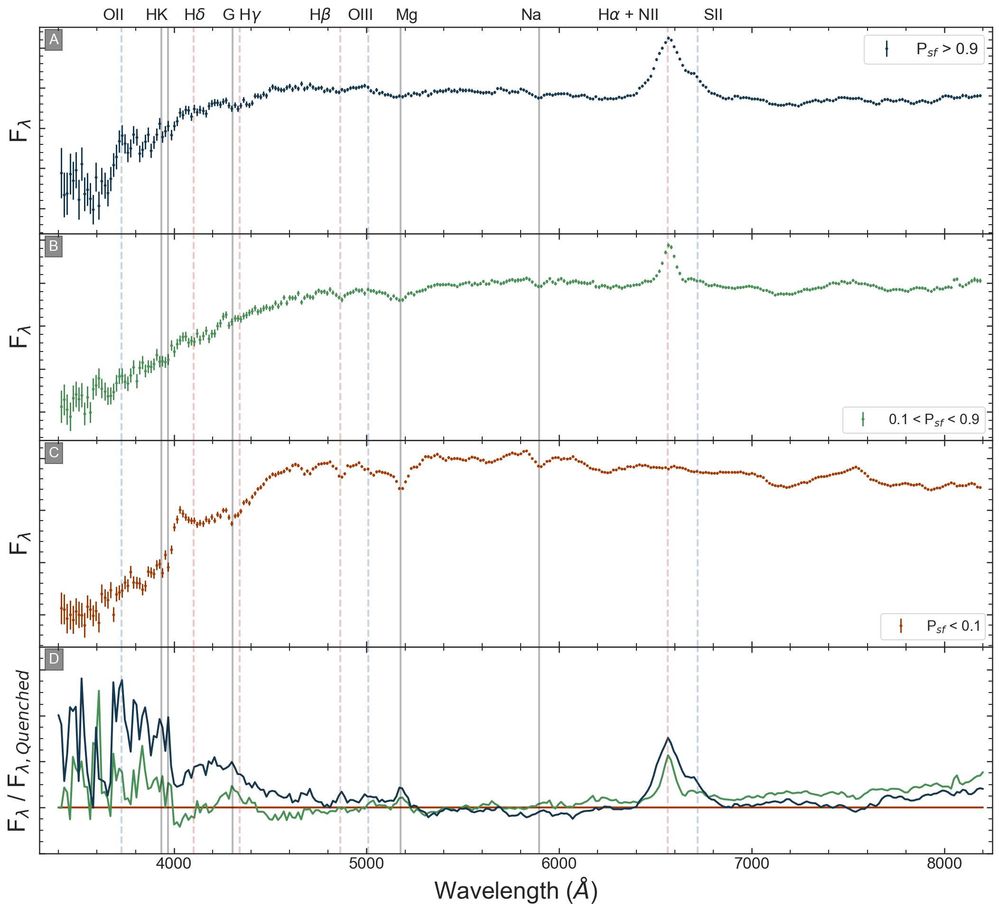

In [38]:
gs = gridspec.GridSpec(4,1,wspace=0,hspace = 0 )
    
plt.figure(figsize=[18,16])
ax1=plt.subplot(gs[0]);ax2=plt.subplot(gs[1]);ax3=plt.subplot(gs[2]);ax4=plt.subplot(gs[3])

plot_spec(ax3, swave, s1_flx, s1_err, 3400, 8200, color = CMAP(0/2),label = 'P$_{sf}$ < 0.1')
plot_spec(ax2, swave, s2_flx, s2_err, 3400, 8200, color = CMAP(1/2),label = '0.1 < P$_{sf}$ < 0.9')
plot_spec(ax1, swave, s3_flx, s3_err, 3400, 8200, color = CMAP(2/2),label = 'P$_{sf}$ > 0.9')

ax4.plot(swave[160:481], s1_flx[160:481]/s1_flx[160:481], color = CMAP(0/2), linewidth = 2)
ax4.plot(swave[160:481], s2_flx[160:481]/s1_flx[160:481], color = CMAP(1/2), linewidth = 2)
ax4.plot(swave[160:481], s3_flx[160:481]/s1_flx[160:481], color = CMAP(2/2), linewidth = 2)
ax4.set_xlim(3300, 8250)
ax4.set_ylim(0.8, 1.7)

ax4.axvline(3727.092 ,linestyle='--', alpha=0.3, color = 'b', linewidth = 2)
ax4.axvline(5008.240,linestyle='--', alpha=0.3, color = 'b', linewidth = 2)
# Balmer
ax4.axvline(4102.89 ,linestyle='--', alpha=0.3, color = 'r', linewidth = 2)
ax4.axvline(4341.68 ,linestyle='--', alpha=0.3, color = 'r', linewidth = 2)
ax4.axvline(4862.68 ,linestyle='--', alpha=0.3, color = 'r', linewidth = 2)
ax4.axvline(6564.61 ,linestyle='--', alpha=0.3, color = 'r', linewidth = 2)

ax4.axvline(6718.29,linestyle='--', alpha=0.3, color = 'b', linewidth = 2) #SII
#     ax.axvline(2799.117,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) # MgII

ax4.axvline(3934,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) # H
ax4.axvline(3969,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) # K
ax4.axvline(4305,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) # G

ax4.axvline(5176.7,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) # Mg
ax4.axvline(5895.6,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) #Na
ax4.axvline(8500,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) #CaII
ax4.axvline(8544,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) #CaII
ax4.axvline(8664,linestyle='-', alpha=0.3, color = 'k', linewidth = 2) #CaII

ax1.set_yticklabels([]);ax2.set_yticklabels([]);ax3.set_yticklabels([]);ax4.set_yticklabels([])

ax1.set_xlim(3300,8250);ax2.set_xlim(3300,8250);ax3.set_xlim(3300,8250);


ax1.set_xlabel('Wavelength ($\AA$)', fontsize = 25);ax2.set_xlabel('Wavelength ($\AA$)', fontsize = 25);
ax3.set_xlabel('Wavelength ($\AA$)', fontsize = 25);ax4.set_xlabel('Wavelength ($\AA$)', fontsize = 25);


ax1.set_ylabel('F$_\lambda$', fontsize = 25);ax2.set_ylabel('F$_\lambda$', fontsize = 25);
ax3.set_ylabel('F$_\lambda$', fontsize = 25);ax4.set_ylabel('F$_\lambda$ / F$_{\lambda, Quenched}$', fontsize = 25);

ax1.legend(fontsize = 17)
# ax3.legend(fontsize = 12)
ax1.tick_params(axis='both', which='major', labelsize=17);ax2.tick_params(axis='both', which='major', labelsize=17)
ax3.tick_params(axis='both', which='major', labelsize=17);ax4.tick_params(axis='both', which='major', labelsize=17)

l_n = ['OII', 'HK','H$\delta$', 'G H$\gamma$', 'H$\\beta$', 'OIII', 'Mg', 'Na', 'H$\\alpha$ + NII', 'SII']
l_x = [3630,3850, 4050, 4250, 4700, 4900, 5150, 5800, 6200, 6750]

ax1.set_xticklabels([])
ax2.set_xticklabels([])

for i in range(len(l_n)):
    ax1.text(l_x[i], 0.00335, l_n[i], fontsize=17)
#     ax2.text(l_x[i], 0.00305, l_n[i], fontsize=13)

t= ax1.text(0.01,0.92, 'A', fontsize = 15, color = 'w',transform=ax1.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))
    
t= ax2.text(0.01,0.92, 'B', fontsize = 15, color = 'w',transform=ax2.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

t= ax3.text(0.01,0.92, 'C', fontsize = 15, color = 'w',transform=ax3.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

t= ax4.text(0.01,0.92, 'D', fontsize = 15, color = 'w',transform=ax4.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

plt.savefig('../plots/evolution_plots/PSF_stacked_hm_4.png', bbox_inches = 'tight')    

In [106]:
pdb = Adb.sort_values('sf_prob_ml', ascending = False)
pdb.reset_index(drop=True, inplace=True)

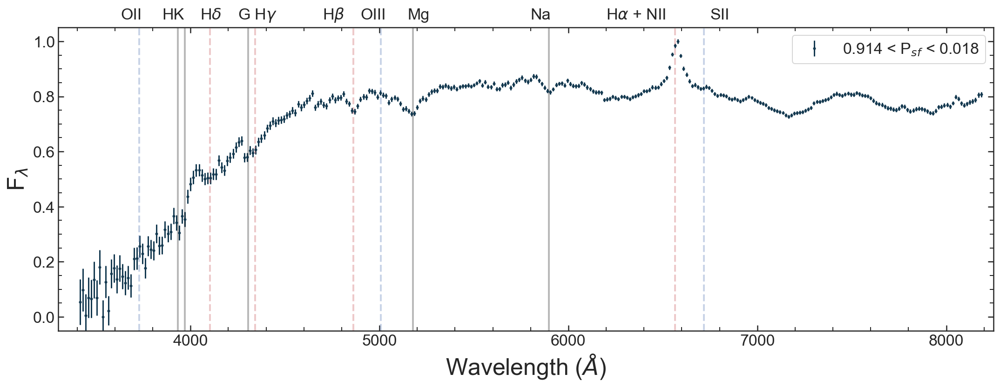

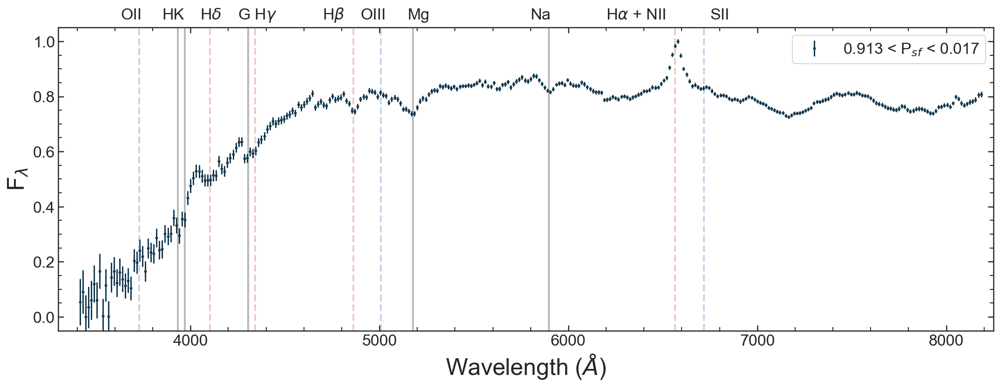

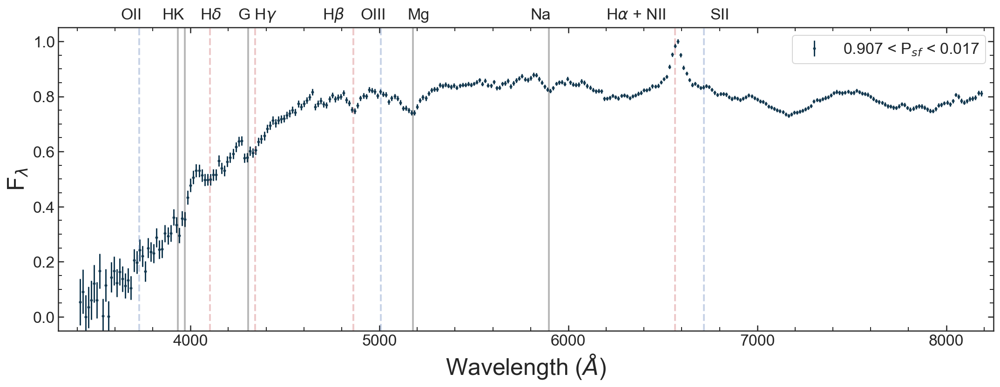

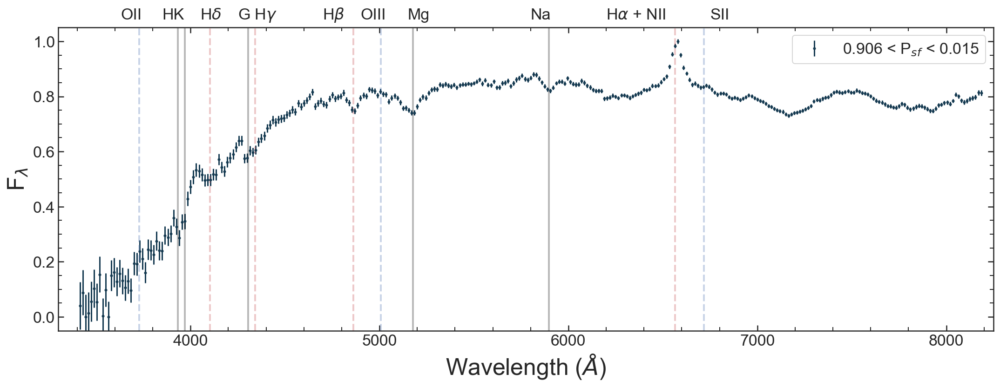

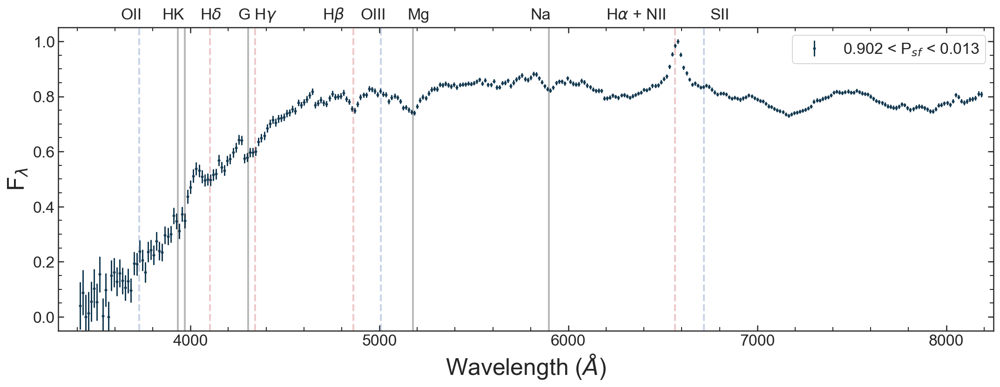

In [150]:
l_n = ['OII', 'HK','H$\delta$', 'G H$\gamma$', 'H$\\beta$', 'OIII', 'Mg', 'Na', 'H$\\alpha$ + NII', 'SII']
l_x = [3630,3850, 4050, 4250, 4700, 4900, 5150, 5800, 6200, 6750]
swave = np.arange(1000,10000,15)

idx = 240

while len(pdb.index[0 + idx:100 + idx]) == 100:    
    s1_flx, s1_err = stack_setup(pdb.query('{} < index < {}'.format(0 + idx,100 + idx)), swave)
    
    mn = 1
    mx = 0

    for i in range(len(s1_flx)):
        f = s1_flx[i]
        if 3400 < swave[i] < 8200:
            
            if f < mn:
                mn = f
            if f > mx:
                mx = f
    
    mx -= mn
    
    s1_flx -= mn
    s1_err /= mx
    s1_flx /= mx
    
    plt.figure(figsize=[18,6])
    ax1=plt.subplot()

    plot_spec(ax1, swave, s1_flx, s1_err, 3400, 8200, color = CMAP(2/2),
              label = '{:1.3f} '.format(pdb.sf_prob_ml[0 + idx]) + '< P$_{sf}$ < ' + '{:1.3f}'.format(pdb.sf_prob_ml[100 + idx]))

#     ax1.set_yticklabels([])
    ax1.set_xlim(3300,8250)
    ax1.set_xlabel('Wavelength ($\AA$)', fontsize = 25)
    ax1.set_ylabel('F$_\lambda$', fontsize = 25)
    ax1.legend(fontsize = 17)
    ax1.tick_params(axis='both', which='major', labelsize=17)
    ax1.set_ylim(-0.05,1.05)

    for i in range(len(l_n)):
        ax1.text(l_x[i], 1.08, l_n[i], fontsize=17)

#     plt.savefig('../plots/evolution_plots/PSF_stacked_hm_4.png', bbox_inches = 'tight')    
  
    idx +=1
    
    if idx == 245:
        break

In [151]:
import imageio
from pygifsicle import optimize

frames_path = "../plots/evolution_plots/stack_gif/stack_{i}.png"

n = len(glob('../plots/evolution_plots/stack_gif/*png'))
with imageio.get_writer('../plots/evolution_plots/ssfr_gif/stack_gif.gif', mode='I') as writer:
    for i in range(n):
        writer.append_data(imageio.imread(frames_path.format(i=i)))

optimize('../plots/evolution_plots/ssfr_gif/stack_gif.gif')

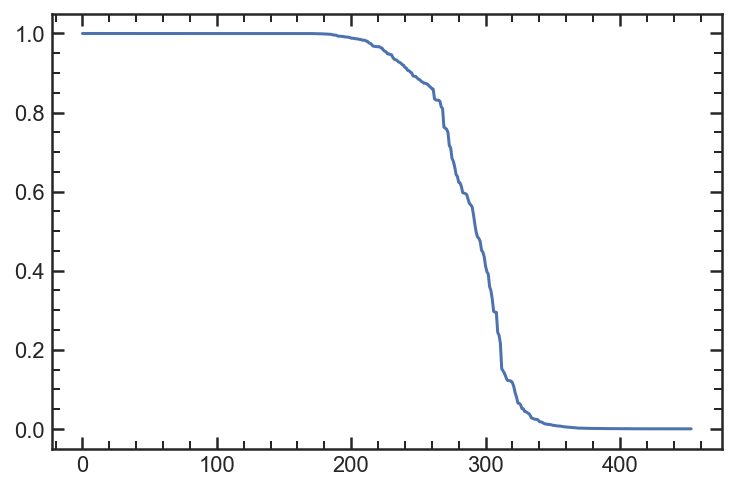

In [144]:
plt.plot(pdb.sf_prob_ml)

In [145]:
pdb

,AGN,Av,Av_hdr,Av_modality,Ra,Ra_f125,Ra_f125_sig,Ra_f160,Ra_f160_sig,Ra_nsig,...,lbt,Ha_EW,Ha_EW_sig,scl_tq,sf_prob_LM,sf_prob_HM,sf_prob_cont_all,sf_prob_cont,sf_prob_ml,Sigma1_err
0,-,0.895815,"[0.8489368728236801, 0.9583196180329918]",[0.0],0.523830,0.552906,0.002831,0.523830,0.002141,NaN,...,9.509636,418.160496,59.221319,0.014033,1.000000e+00,1.000000,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",1.000000e+00,1.000000e+00,7.919879e+07
1,-,0.885248,"[0.7531846227547024, 1.0068307857746985]",[0.0],0.464184,0.464184,0.006873,0.467286,0.007009,NaN,...,8.911683,90.458340,33.497004,0.177413,9.999984e-01,1.000000,"[0.9999681891192865, 1.0, 0.9999898730593408, ...",1.000000e+00,1.000000e+00,8.992530e+07
2,-,0.786944,"[0.6801644209848419, 0.8855092631439386]",[0.0],0.412746,0.412746,0.003800,0.400014,0.003540,NaN,...,9.084343,135.604148,16.646224,0.293268,1.000000e+00,1.000000,"[0.9997418146796528, 0.9999872969539015, 0.999...",1.000000e+00,1.000000e+00,5.735796e+07
3,-,0.810466,"[0.7594317326865708, 0.858097487362629]",[0.0],0.944406,0.944406,0.004434,0.922356,0.004633,NaN,...,8.779668,121.071997,9.497599,0.017858,1.000000e+00,1.000000,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",1.000000e+00,1.000000e+00,2.157783e+07
4,-,0.702447,"[0.6257125813714479, 0.7669031983747191]",[0.0],0.963396,0.963396,0.038788,1.282090,0.030442,NaN,...,8.917827,283.279514,14.014149,0.271584,1.000000e+00,1.000000,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",1.000000e+00,1.000000e+00,2.294562e+08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
449,-,0.033987,"[0.006157191844595424, 0.09376922619148254]",[0.6532540171854184],0.164400,0.164400,0.001995,0.155352,0.001711,0.010064,...,8.105330,14.681200,2.467880,0.256174,1.736304e-05,0.001481,"[6.27185607238706e-08, 7.422982511186782e-08, ...",6.071014e-06,1.341736e-06,3.782062e+08
450,-,0.021168,"[0.010001116771156279, 0.046293949022772216]",[0.0],0.422250,0.422250,0.002380,0.415626,0.002213,0.025447,...,7.786604,9.655422,2.016208,0.094998,1.028358e-05,0.001664,"[1.7057104455129424e-05, 2.891333848819542e-05...",2.865338e-05,9.900251e-07,9.817408e+08
451,-,0.181353,"[0.11107092781735775, 0.2395435600336472]",[0.0],0.552468,0.552468,0.002013,0.545964,0.001913,0.033209,...,7.642905,0.000000,0.000000,0.157186,6.291736e-05,0.006487,"[0.00018193049102964304, 0.0002624335227180375...",2.624335e-04,9.272852e-07,1.003098e+09
452,-,0.249305,"[0.21795210285217748, 0.36359201614875625]","[0.06258381042844295, 0.035368630477673975, 0....",0.349992,0.349992,0.003859,0.342222,0.003363,0.021351,...,7.827832,5.858031,5.503249,0.153158,9.079162e-07,0.000183,"[1.1286992394262748e-10, 1.4811844346138838e-1...",8.538947e-08,5.145180e-07,4.510024e+08


In [752]:
def Stack_sfh(lbts, sfhgrid , errgrid):
    flgrid = np.transpose(sfhgrid)
    errgrid = np.transpose(errgrid)
    weigrid = errgrid ** (-2)
    infmask = np.isinf(weigrid)
    weigrid[infmask] = 0
    ################

    stack, err = np.zeros([2, len(lbts)])
    for i in range(len(lbts)):
        stack[i] = np.sum(flgrid[i])        
        err[i] = np.sqrt(np.sum(errgrid[i]**2))
    ################
    
#     return stack / np.trapz(stack,lbts), err/ np.trapz(stack,lbts)
    return stack, err

def sfh_stack_setup(db, lbts):
    sfhgrid = []
    errgrid = []

    for i in db.index:
        lbt, sfh = np.load('../data/B_sfh/{}_{}.npy'.format(db.field[i], db.id[i]))
        lbt, sfh16 = np.load('../data/B_sfh/{}_{}_16.npy'.format(db.field[i], db.id[i]))
        lbt, sfh84 = np.load('../data/B_sfh/{}_{}_84.npy'.format(db.field[i], db.id[i]))
        
        lbt += cosmo.lookback_time(db.zgrism[i]).value
        
        isfh = interp1d(lbt,sfh, fill_value=0, bounds_error=False)(lbts)
        ierr = interp1d(lbt,(sfh84 - sfh16)/2, fill_value=0, bounds_error=False)(lbts)

#         ierr /= np.trapz(isfh, lbts)
#         isfh /= np.trapz(isfh, lbts)
        
        sfhgrid.append(isfh)
        errgrid.append(ierr)   

        
    W = Leave_one_out_SFH(lbts,sfhgrid,errgrid)
#     print(list(W))
    for i in range(len(W)):
        errgrid[i] = np.sqrt(errgrid[i]**2 + (sfhgrid[i]*W[i])**2)
        
    return Stack_sfh(lbts, sfhgrid, errgrid)


def Leave_one_out_SFH(lbts, sfhgrid, errgrid):
    
    Y,Ye = Stack_sfh(lbts, sfhgrid, errgrid)

    weights = np.zeros([len(sfhgrid), len(lbts)])
    for i in range(len(sfhgrid)):
        fgrid = []
        egrid = []
        for ii in range(len(sfhgrid)):
            if i != ii:
                fgrid.append(sfhgrid[ii])
                egrid.append(errgrid[ii])  
        Ybar, Ybare = Stack(lbts, fgrid, egrid)
        weights[i] = np.abs(Ybar - Y) / Y
    return weights

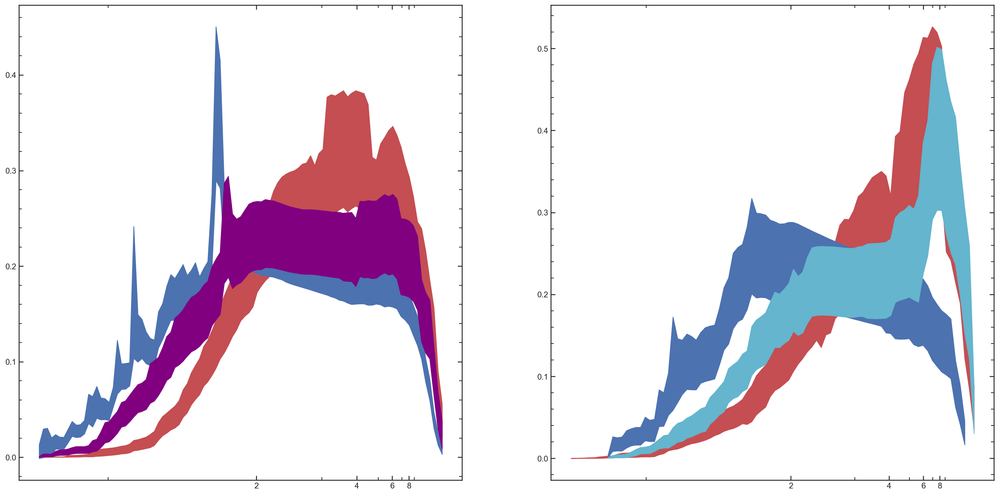

In [753]:
plt.figure(figsize = [24,12])
ax1 = plt.subplot(121)
LBT = np.linspace(6.47,13.4,100)

SFH, ERR = sfh_stack_setup(Ldb.query('sf_prob_ml < 0.05'), LBT)
ERR /= np.trapz(SFH, LBT)
SFH /= np.trapz(SFH, LBT)

plt.fill_between(LBT, SFH + ERR, SFH - ERR, color = 'r')

SFH, ERR = sfh_stack_setup(Ldb.query('sf_prob_ml > 0.95'), LBT)
ERR /= np.trapz(SFH, LBT)
SFH /= np.trapz(SFH, LBT)

plt.fill_between(LBT, SFH + ERR, SFH - ERR, color = 'b')

SFH, ERR = sfh_stack_setup(Ldb.query('0.05 < sf_prob_ml < 0.95'), LBT)
ERR /= np.trapz(SFH, LBT)
SFH /= np.trapz(SFH, LBT)

plt.fill_between(LBT, SFH + ERR, SFH - ERR, color = 'purple')

ax1.set_xticks(cosmo.lookback_time([2,4,6,8]).value);ax1.set_xticklabels([2,4,6,8])
ax1.set_xticks(cosmo.lookback_time([1,3,5,7,9]).value, minor = True)


ax2 = plt.subplot(122)
LBT = np.linspace(6,14,100)

SFH, ERR = sfh_stack_setup(Hdb.query('sf_prob_ml < 0.05'), LBT)
ERR /= np.trapz(SFH, LBT)
SFH /= np.trapz(SFH, LBT)

plt.fill_between(LBT, SFH + ERR, SFH - ERR, color = 'r')
# plt.plot(LBT, SFH)

SFH, ERR = sfh_stack_setup(Hdb.query('sf_prob_ml > 0.95'), LBT)
ERR /= np.trapz(SFH, LBT)
SFH /= np.trapz(SFH, LBT)

plt.fill_between(LBT, SFH + ERR, SFH - ERR, color = 'b')
# plt.plot(LBT, SFH)

SFH, ERR = sfh_stack_setup(Hdb.query('0.05 < sf_prob_ml < 0.95'), LBT)
ERR /= np.trapz(SFH, LBT)
SFH /= np.trapz(SFH, LBT)

plt.fill_between(LBT, SFH + ERR, SFH - ERR, color = 'c')
# plt.plot(LBT, SFH)


ax2.set_xticks(cosmo.lookback_time([2,4,6,8]).value);ax2.set_xticklabels([2,4,6,8])
ax2.set_xticks(cosmo.lookback_time([1,3,5,7,9]).value, minor = True)

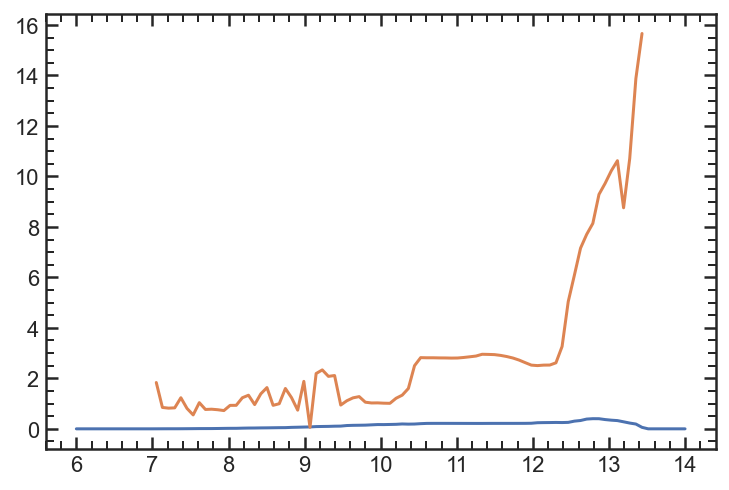

In [743]:
plt.plot(LBT, SFH)
plt.plot(LBT, ERR)

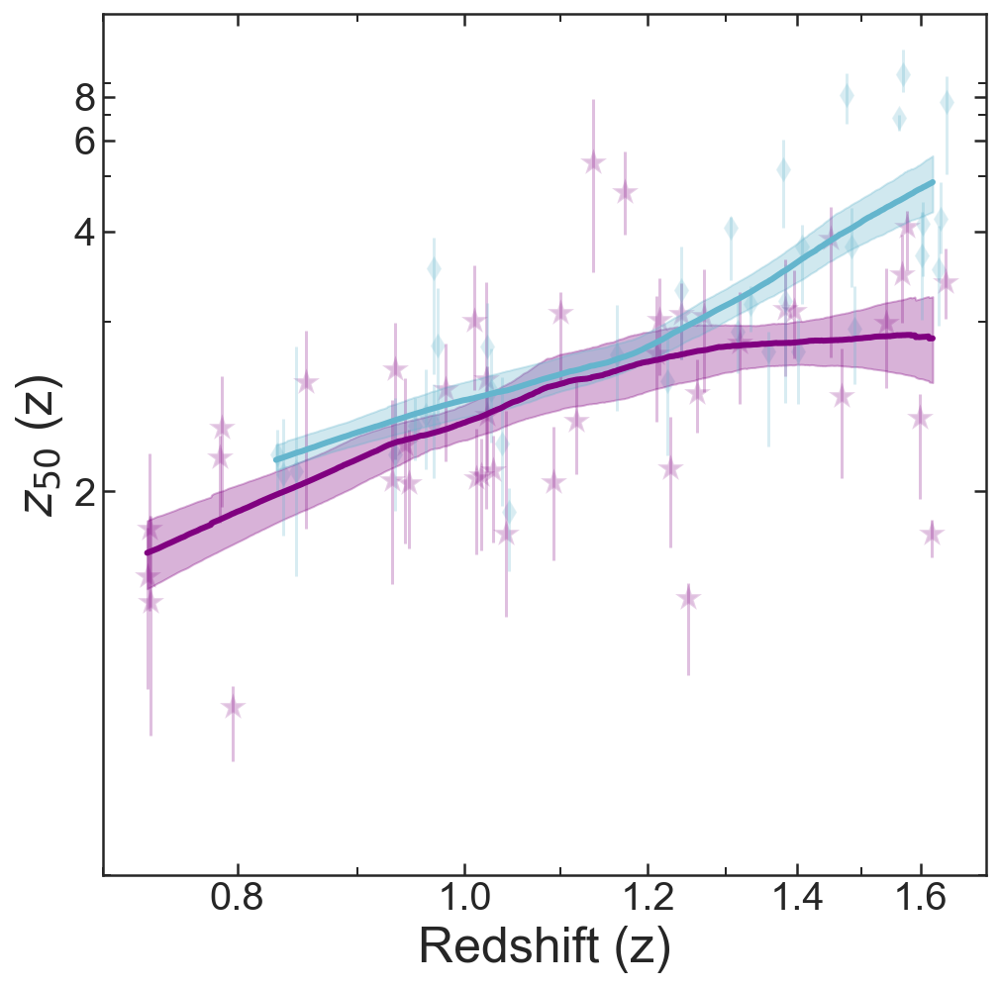

In [119]:
plt.figure(figsize = [8,8])
ax1 = plt.subplot()
       
sea.scatterplot(Ldb.query('0.1 < sf_prob_ml < 0.9').lbt, 
                cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').z_50).value, marker = '*', 
                alpha = 0.25, color = 'purple', s = 200 )
sea.scatterplot(Hdb.query('0.1 < sf_prob_ml < 0.9').lbt, 
                cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').z_50).value, marker = 'd',
                alpha=0.25, color = 'c', s = 80 )

lerr = []
herr = []

for i in Ldb.query('0.1 < sf_prob_ml < 0.9').index:
    hdr = cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9')['z_50_hdr'][i]).value
    val = cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9')['z_50'][i] ).value
    lerr.append(val - hdr[0])
    herr.append(hdr[1] - val) 

ax1.errorbar(Ldb.query('0.1 < sf_prob_ml < 0.9').lbt, 
                cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').z_50).value,
            yerr = [lerr, herr], linestyle = 'none',alpha = 0.25, color = 'purple')   

lerr = []
herr = []

for i in Hdb.query('0.1 < sf_prob_ml < 0.9').index:
    hdr = cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9')['z_50_hdr'][i]).value
    val = cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9')['z_50'][i] ).value
    lerr.append(val - hdr[0])
    herr.append(hdr[1] - val) 
ax1.errorbar(Hdb.query('0.1 < sf_prob_ml < 0.9').lbt, 
                cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').z_50).value,
            yerr = [lerr, herr], linestyle = 'none',alpha = 0.25, color = 'c')   

lbt,m,l,h =gen_grid_lims('../data/plot_points/Lz50.npy')
ax1.plot(lbt[10:-20], m[10:-20],'purple', linewidth = 3)
ax1.fill_between(lbt[10:-20],l[10:-20], h[10:-20],color = 'purple', alpha = 0.3)
  

lbt, m, l, h = gen_grid_lims('../data/plot_points/Hz50.npy')
ax1.plot(lbt[10:-20], m[10:-20],'c', linewidth = 3)
ax1.fill_between(lbt[10:-20],l[10:-20], h[10:-20],color = 'c', alpha = 0.3)
  

ax1.set_xticks(cosmo.lookback_time([0.8,1.0,1.2, 1.4,1.6]).value);ax1.set_xticklabels([0.8,1.0,1.2, 1.4,1.6])
ax1.set_yticks(cosmo.lookback_time([2,4,6,8]).value);ax1.set_yticklabels([2,4,6,8])
ax1.set_xticks(cosmo.lookback_time([0.7,0.9,1.1, 1.3,1.5]).value, minor = True)
ax1.set_yticks(cosmo.lookback_time([1,3,5,7,9]).value, minor = True)

ax1.set_ylabel('$z_{50}$ (z)', fontsize = 25);ax1.set_xlabel('Redshift (z)', fontsize = 25);

ax1.tick_params(axis='both', which='major', labelsize=20)
# plt.savefig('../plots/evolution_plots/PSF_z50.pdf', bbox_inches = 'tight')    

In [38]:
z50err = []
zerr = []

for i in Hdb.query('0.1 < sf_prob_ml < 0.9').index:
    hdr = cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9')['z_50_hdr'][i]).value
    val = cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9')['z_50'][i] ).value
    lerr = val - hdr[0]
    herr = hdr[1] - val 
    
    z50err.append((lerr + herr) / 2)
    
    hdr = cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9')['zgrism_hdr'][i]).value
    if np.sum(hdr)**2 >0:
        val = cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9')['zgrism'][i] ).value
        lerr = val - hdr[0]
        herr = hdr[1] - val 

        zerr.append((lerr + herr) / 2)
    else:
        zerr.append(0.02)

lx, ly, ller, lher = get_linmix_grid(Hdb.query('0.1 < sf_prob_ml < 0.9').lbt, 
                cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').z_50).value, zerr, z50err)

In [68]:
def get_linmix_grid(x, y, xerr, yerr):
    lm = linmix.LinMix(x, y , xerr, yerr, K=2)
    lm.run_mcmc(silent=True)
    xs = np.linspace(min(x),max(x))

    lgrid = []

    for i in range(0, len(lm.chain), 1000):
        lgrid.append(lm.chain[i]['alpha'] + xs * lm.chain[i]['beta'])
    
    alpha_x = np.linspace(min(lm.chain['alpha']), max(lm.chain['alpha']),100)
#     kde =stats.gaussian_kde(lm.chain['alpha'])

#     y = kde(alpha_x)
#     ALPHA = alpha_x[y == max(y)]
    ALPHA = np.median(lm.chain['alpha'])
    beta_x = np.linspace(min(lm.chain['beta']), max(lm.chain['beta']),100)
    kde =stats.gaussian_kde(lm.chain['beta'])

#     y = kde(beta_x)
#     BETA = beta_x[y == max(y)]
    BETA = np.median(lm.chain['beta'])

    return xs, ALPHA + xs * BETA, np.percentile(lgrid, 16, axis = 0), np.percentile(lgrid, 84, axis = 0)
    
    

In [66]:
lm = linmix.LinMix(Hdb.query('0.1 < sf_prob_ml < 0.9').lbt, 
                cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').z_50).value, zerr, z50err)
lm.run_mcmc(silent=True)


[4.67219722]


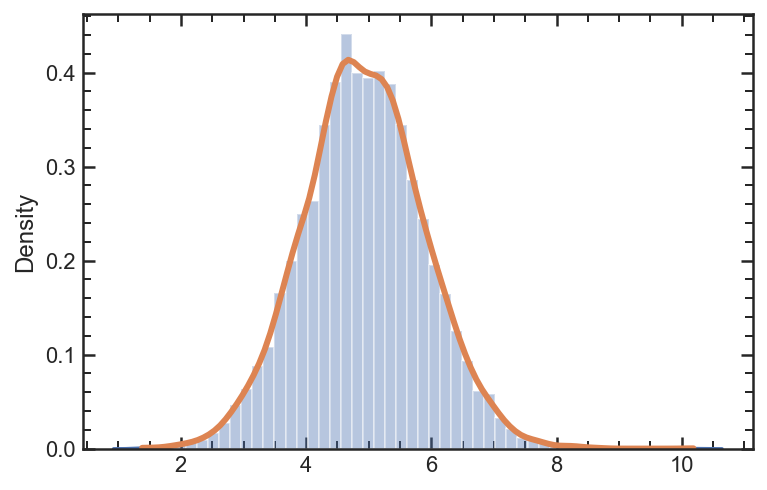

In [80]:
alpha_x = np.linspace(min(lm.chain['alpha']), max(lm.chain['alpha']),100)
kde =stats.gaussian_kde(lm.chain['alpha'])
    
y = kde(alpha_x)
print(alpha_x[y == max(y)])
sea.distplot(lm.chain['alpha'])
plt.plot(alpha_x, y, linewidth = 3)


[0.79577578]


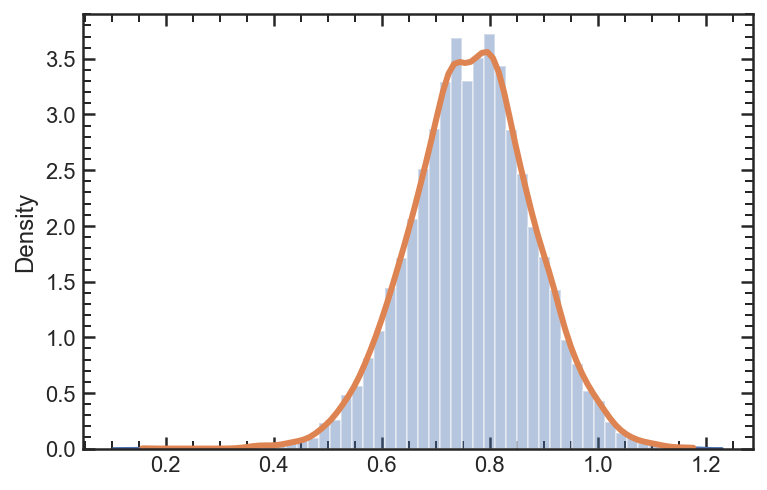

In [84]:
beta_x = np.linspace(min(lm.chain['beta']), max(lm.chain['beta']),100)
kde =stats.gaussian_kde(lm.chain['beta'])
    
y = kde(beta_x)
print(beta_x[y == max(y)])

sea.distplot(lm.chain['beta'])
plt.plot(beta_x, y, linewidth = 3)

<AxesSubplot:xlabel='lbt'>

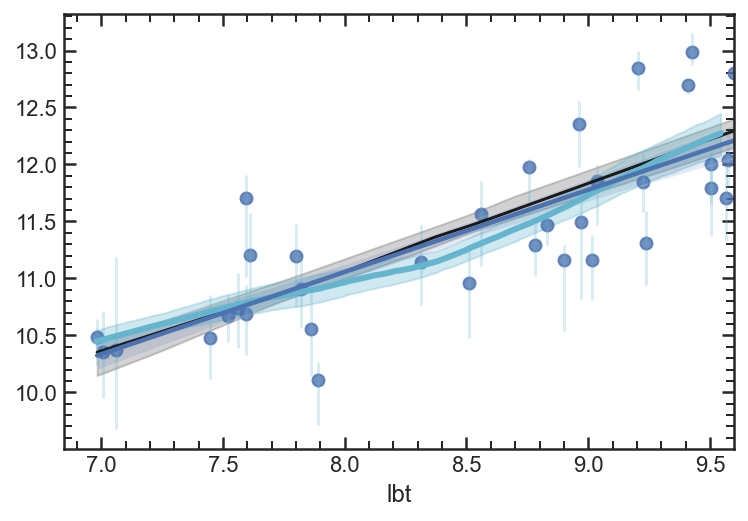

In [63]:
plt.figure()
ax = plt.subplot()
  
    
plt.plot(lx, ly, 'k')
plt.fill_between(lx, ller, lher, color ='k', alpha = 0.2)
    
lerr = []
herr = []

for i in Hdb.query('0.1 < sf_prob_ml < 0.9').index:
    hdr = cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9')['z_50_hdr'][i]).value
    val = cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9')['z_50'][i] ).value
    lerr.append(val - hdr[0])
    herr.append(hdr[1] - val) 
ax.errorbar(Hdb.query('0.1 < sf_prob_ml < 0.9').lbt, 
                cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').z_50).value,
            yerr = [lerr, herr], linestyle = 'none',alpha = 0.25, color = 'c') 

lbt, m, l, h = gen_grid_lims('../data/plot_points/Hz50.npy')
ax.plot(lbt[10:-20], m[10:-20],'c', linewidth = 3)
ax.fill_between(lbt[10:-20],l[10:-20], h[10:-20],color = 'c', alpha = 0.3)
  
    
sea.regplot(Hdb.query('0.1 < sf_prob_ml < 0.9').lbt, 
                cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').z_50).value, ci = 68)

In [40]:
len(lm.chain)

10000

<ErrorbarContainer object of 3 artists>

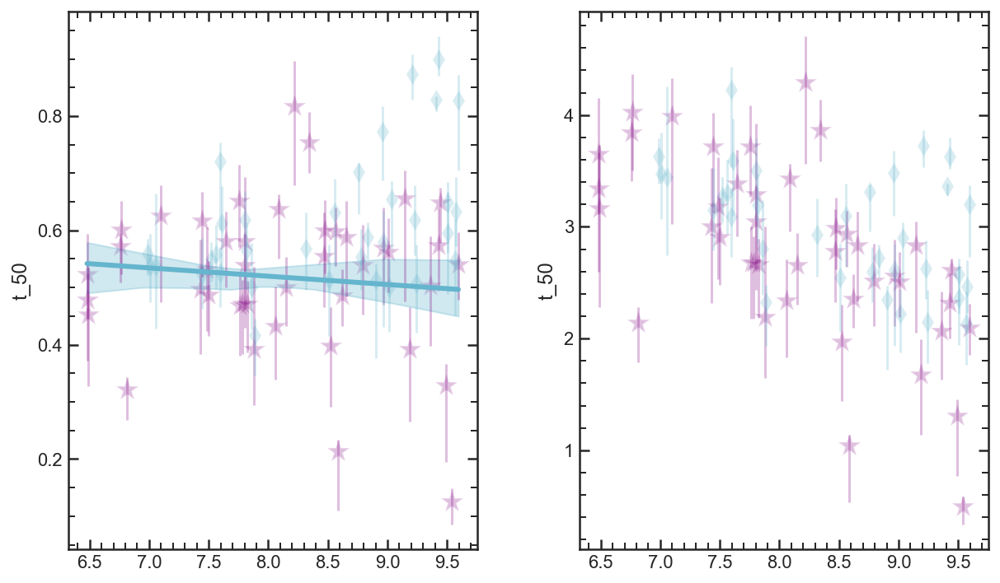

In [99]:
gs = gridspec.GridSpec(1,2, wspace = 0.25)
plt.figure(figsize = [10,6])
ax3 = plt.subplot(gs[0])
ax5 = plt.subplot(gs[1])

sea.scatterplot(cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Ldb.query('0.1 < sf_prob_ml < 0.9').t_50 / cosmo.age(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,  marker = '*', 
                alpha = 0.25, color = 'purple', s = 200, ax = ax3)
sea.scatterplot(cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Hdb.query('0.1 < sf_prob_ml < 0.9').t_50 / cosmo.age(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value, marker = 'd',
                alpha=0.25, color = 'c', s = 80, ax = ax3)

sea.scatterplot(cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Ldb.query('0.1 < sf_prob_ml < 0.9').t_50,  marker = '*', 
                alpha = 0.25, color = 'purple', s = 200, ax = ax5)
sea.scatterplot(cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Hdb.query('0.1 < sf_prob_ml < 0.9').t_50, marker = 'd',
                alpha=0.25, color = 'c', s = 80, ax = ax5)

lerr, herr = get_err_U(Ldb.query('0.1 < sf_prob_ml < 0.9'), 't_50')
ax3.errorbar(cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Ldb.query('0.1 < sf_prob_ml < 0.9').t_50 / cosmo.age(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
            yerr = [lerr, herr], linestyle = 'none',alpha = 0.25, color = 'purple')   

lx, ly, ller, lher = get_linmix_grid(cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Ldb.query('0.1 < sf_prob_ml < 0.9').t_50 / cosmo.age(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value, 
                np.repeat(0.02, len(lerr)), (lerr+herr)/2)

ax3.plot(lx, ly,'c', linewidth = 3)
ax3.fill_between(lx,ller, lher,color = 'c', alpha = 0.3)
     

lerr, herr = get_err_U(Hdb.query('0.1 < sf_prob_ml < 0.9'), 't_50')
ax3.errorbar(cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Hdb.query('0.1 < sf_prob_ml < 0.9').t_50 / cosmo.age(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
            yerr = [lerr, herr], linestyle = 'none',alpha = 0.25, color = 'c')   

lerr, herr = get_err(Ldb.query('0.1 < sf_prob_ml < 0.9'), 't_50')
ax5.errorbar(cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Ldb.query('0.1 < sf_prob_ml < 0.9').t_50,
            yerr = [lerr, herr], linestyle = 'none',alpha = 0.25, color = 'purple')   

lerr, herr = get_err(Hdb.query('0.1 < sf_prob_ml < 0.9'), 't_50')
ax5.errorbar(cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Hdb.query('0.1 < sf_prob_ml < 0.9').t_50,
            yerr = [lerr, herr], linestyle = 'none',alpha = 0.25, color = 'c')   

In [65]:
def get_err_U(DB, param):
    lerr = []
    herr = []

    for i in DB.index:
        hdr = DB['{}_hdr'.format(param)][i] / cosmo.age(DB.zgrism[i]).value
        val = DB[param][i] / cosmo.age(DB.zgrism[i]).value 
        lerr.append(val - hdr[0])
        herr.append(hdr[1] - val) 
    return np.array(lerr), np.array(herr)

def get_err(DB, param):
    lerr = []
    herr = []

    for i in DB.index:
        hdr = DB['{}_hdr'.format(param)][i]
        val = DB[param][i] 
        lerr.append(val - hdr[0])
        herr.append(hdr[1] - val) 
    return np.array(lerr), np.array(herr)


In [66]:

def gen_grid_lims(f):
# f = '../data/plot_points/Lt50_N.npy'
    lbt_range, s_g = np.load(f,allow_pickle=True)
    smooth_grid = np.array([s_g[U] for U in range(len(s_g))])


    m = []
    h = []
    l = []
    lbt = []
    for i in range(len(smooth_grid)):
        Tarray = smooth_grid.T[i]
        if sum(Tarray) != 0:
            lbt.append(lbt_range[i])
            m.append(np.percentile(Tarray[Tarray > 0], 50))
            h.append(np.percentile(Tarray[Tarray > 0], 84))
            l.append(np.percentile(Tarray[Tarray > 0], 16))

    return lbt, m, h, l

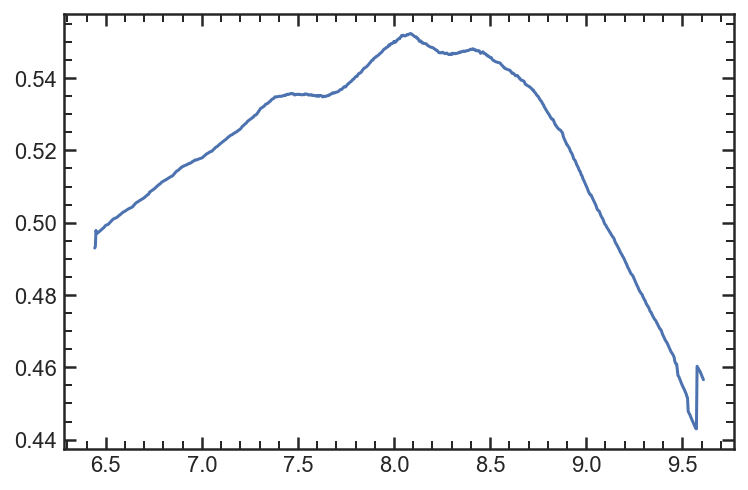

In [79]:
plt.plot(lbt, m)

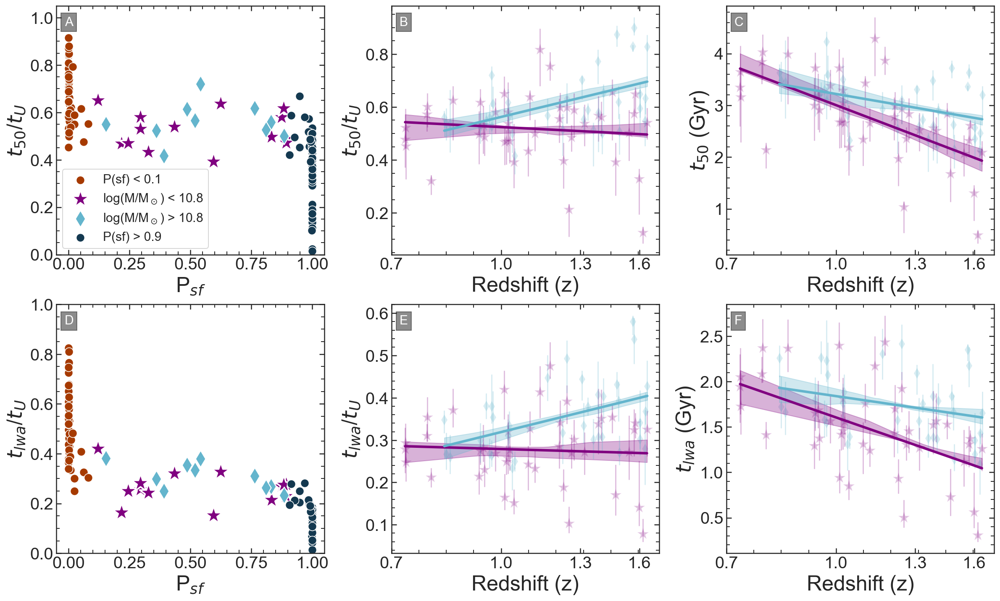

In [70]:
gs = gridspec.GridSpec(2,3, wspace = 0.25)
plt.figure(figsize = [20,12])
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[3])
ax3 = plt.subplot(gs[1])
ax4 = plt.subplot(gs[4])
ax5 = plt.subplot(gs[2])
ax6 = plt.subplot(gs[5])

###
sea.scatterplot(Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml < 0.1').sf_prob_ml, 
                Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml < 0.1').t_50/ \
                cosmo.age(Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml < 0.1').zgrism).value, ax = ax1, color = CMAP(0/3),
               label = 'P(sf) < 0.1', s=100)


sea.scatterplot(Ldb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
                Ldb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').t_50/\
                cosmo.age(Ldb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').zgrism).value, ax = ax1, color = 'purple',
               label = 'log(M/M$_\odot$) < 10.8', s=500, marker = '*')

sea.scatterplot(Hdb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
                Hdb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').t_50/\
                cosmo.age(Hdb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').zgrism).value, ax = ax1, color = 'c',
               marker = 'd',label = 'log(M/M$_\odot$) > 10.8', s=200)

sea.scatterplot(Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml >0.9').sf_prob_ml, 
                Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml >0.9').t_50/ \
                cosmo.age(Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml >0.9').zgrism).value, ax = ax1, color = CMAP(3/3),
               label = 'P(sf) > 0.9 ', s = 100)
#####
sea.scatterplot(Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml < 0.1').sf_prob_ml, 
                Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml < 0.1').lwa/ \
                cosmo.age(Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml < 0.1').zgrism).value, ax = ax2, color = CMAP(0/3),
                s=100)


sea.scatterplot(Ldb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
                Ldb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').lwa/\
                cosmo.age(Ldb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').zgrism).value, ax = ax2, color = 'purple',
               s=500, marker = '*')

sea.scatterplot(Hdb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
                Hdb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').lwa/\
                cosmo.age(Hdb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').zgrism).value, ax = ax2, color = 'c',
               marker = 'd', s=200)

sea.scatterplot(Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml >0.9').sf_prob_ml, 
                Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml >0.9').lwa/ \
                cosmo.age(Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml >0.9').zgrism).value, ax = ax2, color = CMAP(3/3),
                s = 100)
#####


sea.scatterplot(cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Ldb.query('0.1 < sf_prob_ml < 0.9').t_50 / cosmo.age(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,  marker = '*', 
                alpha = 0.25, color = 'purple', s = 200, ax = ax3)
sea.scatterplot(cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Hdb.query('0.1 < sf_prob_ml < 0.9').t_50 / cosmo.age(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value, marker = 'd',
                alpha=0.25, color = 'c', s = 80, ax = ax3)

sea.scatterplot(cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Ldb.query('0.1 < sf_prob_ml < 0.9').t_50,  marker = '*', 
                alpha = 0.25, color = 'purple', s = 200, ax = ax5)
sea.scatterplot(cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Hdb.query('0.1 < sf_prob_ml < 0.9').t_50, marker = 'd',
                alpha=0.25, color = 'c', s = 80, ax = ax5)
# ax3.set_ylim(0.1,0.9)
        
        
#####
sea.scatterplot(cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Ldb.query('0.1 < sf_prob_ml < 0.9').lwa / cosmo.age(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,  marker = '*', 
                alpha = 0.25, color = 'purple', s = 200, ax = ax4)
sea.scatterplot(cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Hdb.query('0.1 < sf_prob_ml < 0.9').lwa / cosmo.age(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value, marker = 'd',
                alpha=0.25, color = 'c', s = 80, ax = ax4)

sea.scatterplot(cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Ldb.query('0.1 < sf_prob_ml < 0.9').lwa,  marker = '*', 
                alpha = 0.25, color = 'purple', s = 200, ax = ax6)
sea.scatterplot(cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Hdb.query('0.1 < sf_prob_ml < 0.9').lwa, marker = 'd',
                alpha=0.25, color = 'c', s = 80, ax = ax6)

lerr, herr = get_err_U(Ldb.query('0.1 < sf_prob_ml < 0.9'), 't_50')
ax3.errorbar(cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Ldb.query('0.1 < sf_prob_ml < 0.9').t_50 / cosmo.age(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
            yerr = [lerr, herr], linestyle = 'none',alpha = 0.25, color = 'purple')   

lx, ly, ller, lher = get_linmix_grid(cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Ldb.query('0.1 < sf_prob_ml < 0.9').t_50 / cosmo.age(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value, 
                np.repeat(0.02, len(lerr)), (lerr+herr)/2)

ax3.plot(lx, ly,'purple', linewidth = 3)
ax3.fill_between(lx,ller, lher,color = 'purple', alpha = 0.3)

lerr, herr = get_err_U(Hdb.query('0.1 < sf_prob_ml < 0.9'), 't_50')
ax3.errorbar(cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Hdb.query('0.1 < sf_prob_ml < 0.9').t_50 / cosmo.age(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
            yerr = [lerr, herr], linestyle = 'none',alpha = 0.25, color = 'c')   

lx, ly, ller, lher = get_linmix_grid(cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Hdb.query('0.1 < sf_prob_ml < 0.9').t_50 / cosmo.age(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                np.repeat(0.02, len(lerr)), (lerr+herr)/2)

ax3.plot(lx, ly,'c', linewidth = 3)
ax3.fill_between(lx,ller, lher,color = 'c', alpha = 0.3)

lerr, herr = get_err(Ldb.query('0.1 < sf_prob_ml < 0.9'), 't_50')
ax5.errorbar(cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Ldb.query('0.1 < sf_prob_ml < 0.9').t_50,
            yerr = [lerr, herr], linestyle = 'none',alpha = 0.25, color = 'purple')   

lx, ly, ller, lher = get_linmix_grid(cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Ldb.query('0.1 < sf_prob_ml < 0.9').t_50,
                np.repeat(0.02, len(lerr)), (lerr+herr)/2)

ax5.plot(lx, ly,'purple', linewidth = 3)
ax5.fill_between(lx,ller, lher,color = 'purple', alpha = 0.3)

lerr, herr = get_err(Hdb.query('0.1 < sf_prob_ml < 0.9'), 't_50')
ax5.errorbar(cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Hdb.query('0.1 < sf_prob_ml < 0.9').t_50,
            yerr = [lerr, herr], linestyle = 'none',alpha = 0.25, color = 'c')   


lx, ly, ller, lher = get_linmix_grid(cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Hdb.query('0.1 < sf_prob_ml < 0.9').t_50,
                np.repeat(0.02, len(lerr)), (lerr+herr)/2)

ax5.plot(lx, ly,'c', linewidth = 3)
ax5.fill_between(lx,ller, lher,color = 'c', alpha = 0.3)
###

lerr, herr = get_err_U(Ldb.query('0.1 < sf_prob_ml < 0.9'), 'lwa')
ax4.errorbar(cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Ldb.query('0.1 < sf_prob_ml < 0.9').lwa / cosmo.age(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
            yerr = [lerr, herr], linestyle = 'none',alpha = 0.25, color = 'purple')   

lx, ly, ller, lher = get_linmix_grid(cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Ldb.query('0.1 < sf_prob_ml < 0.9').lwa / cosmo.age(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                np.repeat(0.02, len(lerr)), (lerr+herr)/2)

ax4.plot(lx, ly,'purple', linewidth = 3)
ax4.fill_between(lx,ller, lher,color = 'purple', alpha = 0.3)

lerr, herr = get_err_U(Hdb.query('0.1 < sf_prob_ml < 0.9'), 'lwa')
ax4.errorbar(cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Hdb.query('0.1 < sf_prob_ml < 0.9').lwa / cosmo.age(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
            yerr = [lerr, herr], linestyle = 'none',alpha = 0.25, color = 'c')   


lx, ly, ller, lher = get_linmix_grid(cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Hdb.query('0.1 < sf_prob_ml < 0.9').lwa / cosmo.age(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                np.repeat(0.02, len(lerr)), (lerr+herr)/2)

ax4.plot(lx, ly,'c', linewidth = 3)
ax4.fill_between(lx,ller, lher,color = 'c', alpha = 0.3)

lerr, herr = get_err(Ldb.query('0.1 < sf_prob_ml < 0.9'), 'lwa')
ax6.errorbar(cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Ldb.query('0.1 < sf_prob_ml < 0.9').lwa,
            yerr = [lerr, herr], linestyle = 'none',alpha = 0.25, color = 'purple')   

lx, ly, ller, lher = get_linmix_grid(cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Ldb.query('0.1 < sf_prob_ml < 0.9').lwa,
                np.repeat(0.02, len(lerr)), (lerr+herr)/2)

ax6.plot(lx, ly,'purple', linewidth = 3)
ax6.fill_between(lx,ller, lher,color = 'purple', alpha = 0.3)

lerr, herr = get_err(Hdb.query('0.1 < sf_prob_ml < 0.9'), 'lwa')
ax6.errorbar(cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Hdb.query('0.1 < sf_prob_ml < 0.9').lwa,
            yerr = [lerr, herr], linestyle = 'none',alpha = 0.25, color = 'c')   


lx, ly, ller, lher = get_linmix_grid(cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Hdb.query('0.1 < sf_prob_ml < 0.9').lwa,
                np.repeat(0.02, len(lerr)), (lerr+herr)/2)

ax6.plot(lx, ly,'c', linewidth = 3)
ax6.fill_between(lx,ller, lher,color = 'c', alpha = 0.3)


ax1.set_xlabel('P$_{sf}$', fontsize = 25);ax2.set_xlabel('P$_{sf}$', fontsize = 25);
ax3.set_xlabel('Redshift (z)', fontsize = 25);ax4.set_xlabel('Redshift (z)', fontsize = 25);
ax5.set_xlabel('Redshift (z)', fontsize = 25);ax6.set_xlabel('Redshift (z)', fontsize = 25);

ax1.set_ylabel('$t_{50}$/$t_U$', fontsize = 25);ax2.set_ylabel('$t_{lwa}$/$t_U$', fontsize = 25);
ax3.set_ylabel('$t_{50}$/$t_U$', fontsize = 25);ax4.set_ylabel('$t_{lwa}$/$t_U$', fontsize = 25);
ax5.set_ylabel('$t_{50}$ (Gyr)', fontsize = 25);ax6.set_ylabel('$t_{lwa}$ (Gyr)', fontsize = 25);

ax1.legend(fontsize = 15, loc = 3)
ax1.tick_params(axis='both', which='major', labelsize=20)
ax2.tick_params(axis='both', which='major', labelsize=20)
ax3.tick_params(axis='both', which='major', labelsize=20)
ax4.tick_params(axis='both', which='major', labelsize=20)
ax5.tick_params(axis='both', which='major', labelsize=20)
ax6.tick_params(axis='both', which='major', labelsize=20)

ax3.set_xticks(cosmo.lookback_time([0.7,1.0,1.3,1.6]).value);ax3.set_xticklabels([0.7,1.0,1.3,1.6])
ax4.set_xticks(cosmo.lookback_time([0.7,1.0,1.3,1.6]).value);ax4.set_xticklabels([0.7,1.0,1.3,1.6])
ax5.set_xticks(cosmo.lookback_time([0.7,1.0,1.3,1.6]).value);ax5.set_xticklabels([0.7,1.0,1.3,1.6])
ax6.set_xticks(cosmo.lookback_time([0.7,1.0,1.3,1.6]).value);ax6.set_xticklabels([0.7,1.0,1.3,1.6])

t= ax1.text(0.03,0.92, 'A', fontsize = 15, color = 'w',transform=ax1.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))
    
t= ax2.text(0.03,0.92, 'D', fontsize = 15, color = 'w',transform=ax2.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

t= ax3.text(0.03,0.92, 'B', fontsize = 15, color = 'w',transform=ax3.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

t= ax4.text(0.03,0.92, 'E', fontsize = 15, color = 'w',transform=ax4.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

t= ax5.text(0.03,0.92, 'C', fontsize = 15, color = 'w',transform=ax5.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

t= ax6.text(0.03,0.92, 'F', fontsize = 15, color = 'w',transform=ax6.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

ax1.set_ylim(0,1.05);ax2.set_ylim(0,1)

plt.savefig('../plots/evolution_plots/PSF_age.png', bbox_inches = 'tight')    

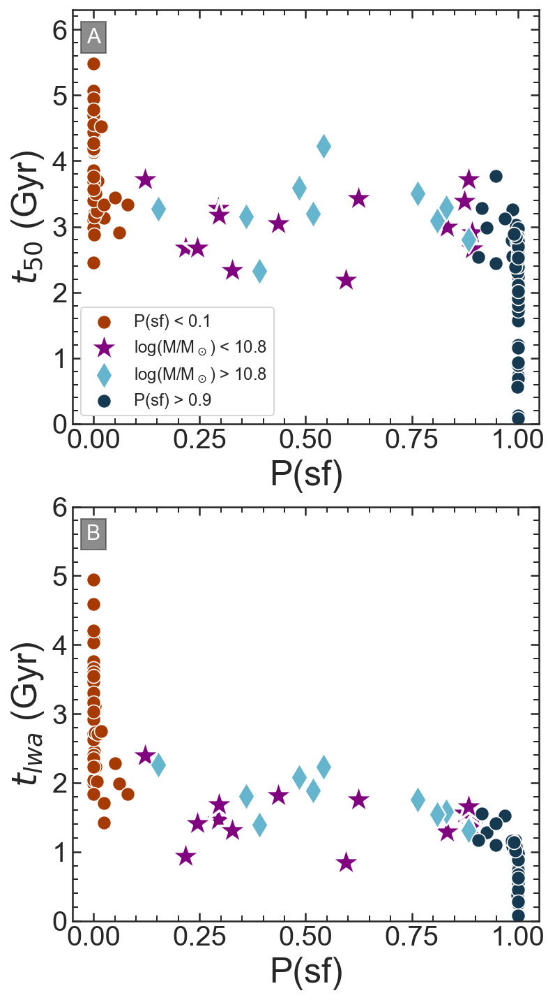

In [113]:
gs = gridspec.GridSpec(2,1, wspace = 0.25)
plt.figure(figsize = [6,12])
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])

sea.scatterplot(Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml < 0.1').sf_prob_ml, 
                Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml < 0.1').t_50, ax = ax1, color = CMAP(0/3),
               label = 'P(sf) < 0.1', s=100)


sea.scatterplot(Ldb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
                Ldb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').t_50, ax = ax1, color = 'purple',
               label = 'log(M/M$_\odot$) < 10.8', s=500, marker = '*')

sea.scatterplot(Hdb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
                Hdb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').t_50, ax = ax1, color = 'c',
               marker = 'd',label = 'log(M/M$_\odot$) > 10.8', s=200)

sea.scatterplot(Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml >0.9').sf_prob_ml, 
                Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml >0.9').t_50, ax = ax1, color = CMAP(3/3),
               label = 'P(sf) > 0.9 ', s = 100)
#####
sea.scatterplot(Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml < 0.1').sf_prob_ml, 
                Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml < 0.1').lwa, ax = ax2, color = CMAP(0/3),
                s=100)


sea.scatterplot(Ldb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
                Ldb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').lwa, ax = ax2, color = 'purple',
               s=500, marker = '*')

sea.scatterplot(Hdb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
                Hdb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').lwa, ax = ax2, color = 'c',
               marker = 'd', s=200)

sea.scatterplot(Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml >0.9').sf_prob_ml, 
                Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml >0.9').lwa, ax = ax2, color = CMAP(3/3),
                s = 100)

ax1.set_xlabel('P(sf)', fontsize = 25);ax2.set_xlabel('P(sf)', fontsize = 25);

ax1.set_ylabel('$t_{50}$ (Gyr)', fontsize = 25);ax2.set_ylabel('$t_{lwa}$ (Gyr)', fontsize = 25);

ax1.legend(fontsize = 12, loc = 3)
ax1.tick_params(axis='both', which='major', labelsize=20)
ax2.tick_params(axis='both', which='major', labelsize=20)


t= ax1.text(0.03,0.92, 'A', fontsize = 15, color = 'w',transform=ax1.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))
    
t= ax2.text(0.03,0.92, 'B', fontsize = 15, color = 'w',transform=ax2.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

ax1.set_ylim(0,6.3);ax2.set_ylim(0,6)

plt.savefig('../plots/evolution_plots/PSF_age_cross.pdf', bbox_inches = 'tight')    

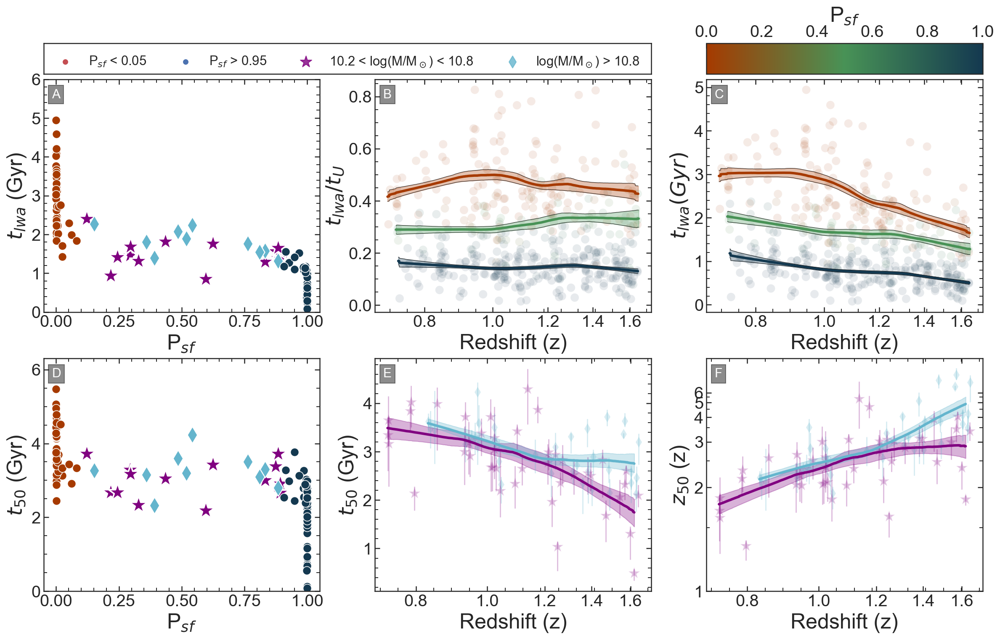

In [73]:
gsm = gridspec.GridSpec(2,3, wspace=0.2, hspace = 0.02, height_ratios=[0.06,1])
gs = gridspec.GridSpecFromSubplotSpec(2,3, gsm[1,:], wspace = 0.2)
plt.figure(figsize = [20,12])
ax7 = plt.subplot(gsm[0,:2])
ax8 = plt.subplot(gsm[0,2])
ax4 = plt.subplot(gs[0])
ax5 = plt.subplot(gs[1])
ax6 = plt.subplot(gs[2])
ax1 = plt.subplot(gs[3])
ax2 = plt.subplot(gs[4])
ax3 = plt.subplot(gs[5])

##########################
sea.scatterplot(Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml < 0.1').sf_prob_ml, 
                Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml < 0.1').t_50, ax = ax1, color = CMAP(0/3),
                s=100)


sea.scatterplot(Ldb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
                Ldb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').t_50, ax = ax1, color = 'purple',
                s=500, marker = '*')

sea.scatterplot(Hdb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
                Hdb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').t_50, ax = ax1, color = 'c',
               marker = 'd', s=200)

sea.scatterplot(Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml >0.9').sf_prob_ml, 
                Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml >0.9').t_50, ax = ax1, color = CMAP(3/3),
               s = 100)
#####
sea.scatterplot(Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml < 0.1').sf_prob_ml, 
                Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml < 0.1').lwa, ax = ax4, color = CMAP(0/3),
                s=100)


sea.scatterplot(Ldb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
                Ldb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').lwa, ax = ax4, color = 'purple',
               s=500, marker = '*')

sea.scatterplot(Hdb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
                Hdb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').lwa, ax = ax4, color = 'c',
               marker = 'd', s=200)

sea.scatterplot(Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml >0.9').sf_prob_ml, 
                Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml >0.9').lwa, ax = ax4, color = CMAP(3/3),
                s = 100)

ax1.set_xlabel('P$_{sf}$', fontsize = 25);ax4.set_xlabel('P$_{sf}$', fontsize = 25);

ax1.set_ylabel('$t_{50}$ (Gyr)', fontsize = 25);ax4.set_ylabel('$t_{lwa}$ (Gyr)', fontsize = 25);

# ax1.legend(fontsize = 12, loc = 3)
ax1.tick_params(axis='both', which='major', labelsize=20)
ax4.tick_params(axis='both', which='major', labelsize=20)


ax1.set_ylim(0,6.3);ax4.set_ylim(0,6)
###########################
sea.scatterplot(cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Ldb.query('0.1 < sf_prob_ml < 0.9').t_50,  marker = '*', 
                alpha = 0.25, color = 'purple', s = 200, ax = ax2)
sea.scatterplot(cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Hdb.query('0.1 < sf_prob_ml < 0.9').t_50, marker = 'd',
                alpha=0.25, color = 'c', s = 80, ax = ax2)

lerr, herr = get_err(Ldb.query('0.1 < sf_prob_ml < 0.9'), 't_50')
ax2.errorbar(cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Ldb.query('0.1 < sf_prob_ml < 0.9').t_50,
            yerr = [lerr, herr], linestyle = 'none',alpha = 0.25, color = 'purple')   

lerr, herr = get_err(Hdb.query('0.1 < sf_prob_ml < 0.9'), 't_50')
ax2.errorbar(cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Hdb.query('0.1 < sf_prob_ml < 0.9').t_50,
            yerr = [lerr, herr], linestyle = 'none',alpha = 0.25, color = 'c')   

lbt,m,l,h =gen_grid_lims('../data/plot_points/Lt50.npy')
ax2.plot(lbt[10:-20], m[10:-20],'purple', linewidth = 3)
ax2.fill_between(lbt[10:-20],l[10:-20], h[10:-20],color = 'purple', alpha = 0.3)
  

lbt, m, l, h = gen_grid_lims('../data/plot_points/Ht50.npy')
ax2.plot(lbt[10:-20], m[10:-20],'c', linewidth = 3)
ax2.fill_between(lbt[10:-20],l[10:-20], h[10:-20],color = 'c', alpha = 0.3)

#####################
    
sea.scatterplot(Ldb.query('0.1 < sf_prob_ml < 0.9').lbt, 
                cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').z_50).value, marker = '*', 
                alpha = 0.25, color = 'purple', s = 200, ax = ax3 )
sea.scatterplot(Hdb.query('0.1 < sf_prob_ml < 0.9').lbt, 
                cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').z_50).value, marker = 'd',
                alpha=0.25, color = 'c', s = 80, ax = ax3 )

lerr = []
herr = []

for i in Ldb.query('0.1 < sf_prob_ml < 0.9').index:
    hdr = cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9')['z_50_hdr'][i]).value
    val = cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9')['z_50'][i] ).value
    lerr.append(val - hdr[0])
    herr.append(hdr[1] - val) 

ax3.errorbar(Ldb.query('0.1 < sf_prob_ml < 0.9').lbt, 
                cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').z_50).value,
            yerr = [lerr, herr], linestyle = 'none',alpha = 0.25, color = 'purple')   

lerr = []
herr = []

for i in Hdb.query('0.1 < sf_prob_ml < 0.9').index:
    hdr = cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9')['z_50_hdr'][i]).value
    val = cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9')['z_50'][i] ).value
    lerr.append(val - hdr[0])
    herr.append(hdr[1] - val) 
ax3.errorbar(Hdb.query('0.1 < sf_prob_ml < 0.9').lbt, 
                cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').z_50).value,
            yerr = [lerr, herr], linestyle = 'none',alpha = 0.25, color = 'c')   

lbt,m,l,h =gen_grid_lims('../data/plot_points/Lz50.npy')
ax3.plot(lbt[10:-20], m[10:-20],'purple', linewidth = 3)
ax3.fill_between(lbt[10:-20],l[10:-20], h[10:-20],color = 'purple', alpha = 0.3)
  

lbt, m, l, h = gen_grid_lims('../data/plot_points/Hz50.npy')
ax3.plot(lbt[10:-20], m[10:-20],'c', linewidth = 3)
ax3.fill_between(lbt[10:-20],l[10:-20], h[10:-20],color = 'c', alpha = 0.3)
  

ax2.set_xticks(cosmo.lookback_time([0.8,1.0,1.2, 1.4,1.6]).value);ax2.set_xticklabels([0.8,1.0,1.2, 1.4,1.6])


ax3.set_ylabel('$z_{50}$ (z)', fontsize = 25);ax3.set_xlabel('Redshift (z)', fontsize = 25);
ax3.tick_params(axis='both', which='major', labelsize=20)

ax2.set_ylabel('$t_{50}$ (Gyr)', fontsize = 25);ax2.set_xlabel('Redshift (z)', fontsize = 25);
ax2.tick_params(axis='both', which='major', labelsize=20)

sea.scatterplot(Adb.lbt, Adb.lwa / cosmo.age(Adb.zgrism), hue = Adb.sf_prob_ml, palette=CMAP, s = 100,ax = ax5, legend=None, alpha = 0.1 )
lbt,m,l,h =gen_grid_lims('../data/plot_points/Lz.npy')
ax5.plot(lbt, m,color = CMAP(0), linewidth = 3)
ax5.plot(lbt, l,color = 'k', linewidth = .5)
ax5.plot(lbt, h,color = 'k', linewidth = .5)

ax5.fill_between(lbt,l, h,color = CMAP(0), alpha = 0.3)

lbt,m,l,h =gen_grid_lims('../data/plot_points/Tz.npy')
ax5.plot(lbt, m,color = CMAP(0.5), linewidth = 3)
ax5.plot(lbt, l,color = 'k', linewidth = .5)
ax5.plot(lbt, h,color = 'k', linewidth = .5)
ax5.fill_between(lbt,l, h,color = CMAP(0.5), alpha = 0.3)

lbt,m,l,h =gen_grid_lims('../data/plot_points/Hz.npy')
ax5.plot(lbt, m,color = CMAP(1.0), linewidth = 3)
ax5.plot(lbt, l,color = 'k', linewidth = .5)
ax5.plot(lbt, h,color = 'k', linewidth = .5)
ax5.fill_between(lbt,l, h,color = CMAP(1.0), alpha = 0.3)

sea.scatterplot(Adb.lbt, Adb.lwa, hue = Adb.sf_prob_ml, palette=CMAP, s = 100,ax = ax6, legend=None, alpha = 0.1 )
lbt,m,l,h =gen_grid_lims('../data/plot_points/Lz.npy')
AGE = cosmo.age(0).value - lbt
ax6.plot(lbt, m*AGE,color = CMAP(0), linewidth = 3)
ax6.plot(lbt, l*AGE,color = 'k', linewidth = .5)
ax6.plot(lbt, h*AGE,color = 'k', linewidth = .5)
ax6.fill_between(lbt,l*AGE, h*AGE,color = CMAP(0), alpha = 0.3)

lbt,m,l,h =gen_grid_lims('../data/plot_points/Tz.npy')
AGE = cosmo.age(0).value - lbt
ax6.plot(lbt, m*AGE,color = CMAP(0.5), linewidth = 3)
ax6.plot(lbt, l*AGE,color = 'k', linewidth = .5)
ax6.plot(lbt, h*AGE,color = 'k', linewidth = .5)
ax6.fill_between(lbt,l*AGE, h*AGE,color = CMAP(0.5), alpha = 0.3)

lbt,m,l,h =gen_grid_lims('../data/plot_points/Hz.npy')
AGE = cosmo.age(0).value - lbt
ax6.plot(lbt, m*AGE,color = CMAP(1.0), linewidth = 3)
ax6.plot(lbt, l*AGE,color = 'k', linewidth = .5)
ax6.plot(lbt, h*AGE,color = 'k', linewidth = .5)
ax6.fill_between(lbt,l*AGE, h*AGE,color = CMAP(1.0), alpha = 0.3)

ax5.set_xticks(cosmo.lookback_time([0.8,1.0,1.2, 1.4,1.6]).value);ax5.set_xticklabels([0.8,1.0,1.2, 1.4,1.6])
ax6.set_xticks(cosmo.lookback_time([0.8,1.0,1.2, 1.4,1.6]).value);ax6.set_xticklabels([0.8,1.0,1.2, 1.4,1.6])
ax3.set_xticks(cosmo.lookback_time([0.8,1.0,1.2, 1.4,1.6]).value);ax3.set_xticklabels([0.8,1.0,1.2, 1.4,1.6])
ax3.set_yticks(cosmo.lookback_time([1,2,3,4,5,6]).value);ax3.set_yticklabels([1,2,3,4,5,6])
ax3.set_yticks(cosmo.lookback_time([1.5,2.5,3.5,4.5,5.5]).value, minor = True)


ax5.set_ylabel('$t_{lwa} / t_{U}$', fontsize = 25);ax5.set_xlabel('Redshift (z)', fontsize = 25);
ax5.tick_params(axis='both', which='major', labelsize=20)

ax6.set_ylabel('$t_{lwa} (Gyr)$', fontsize = 25);ax6.set_xlabel('Redshift (z)', fontsize = 25);
ax6.tick_params(axis='both', which='major', labelsize=20)


t= ax4.text(0.03,0.92, 'A', fontsize = 15, color = 'w',transform=ax4.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))
    
t= ax5.text(0.03,0.92, 'B', fontsize = 15, color = 'w',transform=ax5.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

t= ax6.text(0.03,0.92, 'C', fontsize = 15, color = 'w',transform=ax6.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

t= ax1.text(0.03,0.92, 'D', fontsize = 15, color = 'w',transform=ax1.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

t= ax2.text(0.03,0.92, 'E', fontsize = 15, color = 'w',transform=ax2.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

t= ax3.text(0.03,0.92, 'F', fontsize = 15, color = 'w',transform=ax3.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

norm = mpl.colors.Normalize(vmin=0, vmax=1)

mpl.colorbar.ColorbarBase(ax8, cmap=CMAP,
                                norm=norm,
                                orientation='horizontal')
ax8.set_xlabel('P$_{sf}$', fontsize = 25)
ax8.tick_params(axis='both', which='major', labelsize=20)
ax8.xaxis.set_ticks_position("top")
ax8.xaxis.set_label_position("top")

sea.scatterplot(Adb.query('sf_prob_ml < 0.1').sf_prob_ml, 
                Adb.query('sf_prob_ml < 0.1').log_Sigma1, color = 'r',
                label = 'P$_{sf}$ < 0.05', s = 50, ax = ax7)

sea.scatterplot(Adb.query('sf_prob_ml >0.9').sf_prob_ml, 
                Adb.query('sf_prob_ml >0.9').log_Sigma1, color = 'b',
               label = 'P$_{sf}$ > 0.95', s = 50, ax = ax7)


sea.regplot(Ldb.query('0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
                Ldb.query('0.1 < sf_prob_ml < 0.9').log_Sigma1, 
            color = 'purple',ci=68, marker = '*', scatter_kws= {'s' : 200},
           label = '10.2 < log(M/M$_\odot$) < 10.8', ax = ax7)

sea.regplot(Hdb.query('0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
                Hdb.query('0.1 < sf_prob_ml < 0.9').log_Sigma1, 
            color = 'c',ci=68, marker = 'd', scatter_kws= {'s' : 100},
           label = 'log(M/M$_\odot$) > 10.8', ax = ax7)

ax7.legend(fontsize = 15.5, ncol = 4, frameon = False)
ax7.set_xlim(-99,-98)
ax7.set_ylim(-99,-98)
ax7.set_xticks([])
ax7.set_yticks([])
ax7.set_xlabel('')
ax7.set_ylabel('')


plt.savefig('../plots/evolution_plots/PSF_tmscl.png', bbox_inches = 'tight')  

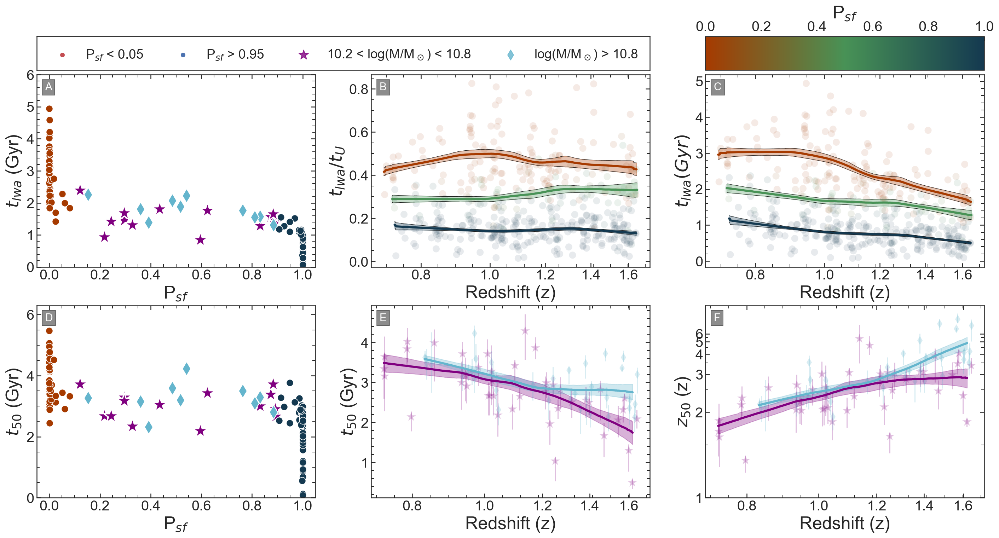

In [77]:
gsm = gridspec.GridSpec(2,3, wspace=0.2, hspace = 0.02, height_ratios=[0.08,1])
gs = gridspec.GridSpecFromSubplotSpec(2,3, gsm[1,:], wspace = 0.2)
plt.figure(figsize = [24,12])
ax7 = plt.subplot(gsm[0,:2])
ax8 = plt.subplot(gsm[0,2])
ax4 = plt.subplot(gs[0])
ax5 = plt.subplot(gs[1])
ax6 = plt.subplot(gs[2])
ax1 = plt.subplot(gs[3])
ax2 = plt.subplot(gs[4])
ax3 = plt.subplot(gs[5])

##########################
sea.scatterplot(Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml < 0.1').sf_prob_ml, 
                Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml < 0.1').t_50, ax = ax1, color = CMAP(0/3),
                s=100)


sea.scatterplot(Ldb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
                Ldb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').t_50, ax = ax1, color = 'purple',
                s=500, marker = '*')

sea.scatterplot(Hdb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
                Hdb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').t_50, ax = ax1, color = 'c',
               marker = 'd', s=200)

sea.scatterplot(Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml >0.9').sf_prob_ml, 
                Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml >0.9').t_50, ax = ax1, color = CMAP(3/3),
               s = 100)
#####
sea.scatterplot(Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml < 0.1').sf_prob_ml, 
                Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml < 0.1').lwa, ax = ax4, color = CMAP(0/3),
                s=100)


sea.scatterplot(Ldb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
                Ldb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').lwa, ax = ax4, color = 'purple',
               s=500, marker = '*')

sea.scatterplot(Hdb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
                Hdb.query('0.9 <zgrism < 1.1 and 0.1 < sf_prob_ml < 0.9').lwa, ax = ax4, color = 'c',
               marker = 'd', s=200)

sea.scatterplot(Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml >0.9').sf_prob_ml, 
                Adb.query('0.9 <zgrism < 1.1 and sf_prob_ml >0.9').lwa, ax = ax4, color = CMAP(3/3),
                s = 100)

ax1.set_xlabel('P$_{sf}$', fontsize = 25);ax4.set_xlabel('P$_{sf}$', fontsize = 25);

ax1.set_ylabel('$t_{50}$ (Gyr)', fontsize = 25);ax4.set_ylabel('$t_{lwa}$ (Gyr)', fontsize = 25);

# ax1.legend(fontsize = 12, loc = 3)
ax1.tick_params(axis='both', which='major', labelsize=20)
ax4.tick_params(axis='both', which='major', labelsize=20)


ax1.set_ylim(0,6.3);ax4.set_ylim(0,6)
###########################
sea.scatterplot(cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Ldb.query('0.1 < sf_prob_ml < 0.9').t_50,  marker = '*', 
                alpha = 0.25, color = 'purple', s = 200, ax = ax2)
sea.scatterplot(cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Hdb.query('0.1 < sf_prob_ml < 0.9').t_50, marker = 'd',
                alpha=0.25, color = 'c', s = 80, ax = ax2)

lerr, herr = get_err(Ldb.query('0.1 < sf_prob_ml < 0.9'), 't_50')
ax2.errorbar(cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Ldb.query('0.1 < sf_prob_ml < 0.9').t_50,
            yerr = [lerr, herr], linestyle = 'none',alpha = 0.25, color = 'purple')   

lerr, herr = get_err(Hdb.query('0.1 < sf_prob_ml < 0.9'), 't_50')
ax2.errorbar(cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').zgrism).value,
                Hdb.query('0.1 < sf_prob_ml < 0.9').t_50,
            yerr = [lerr, herr], linestyle = 'none',alpha = 0.25, color = 'c')   

lbt,m,l,h =gen_grid_lims('../data/plot_points/Lt50.npy')
ax2.plot(lbt[10:-20], m[10:-20],'purple', linewidth = 3)
ax2.fill_between(lbt[10:-20],l[10:-20], h[10:-20],color = 'purple', alpha = 0.3)
  

lbt, m, l, h = gen_grid_lims('../data/plot_points/Ht50.npy')
ax2.plot(lbt[10:-20], m[10:-20],'c', linewidth = 3)
ax2.fill_between(lbt[10:-20],l[10:-20], h[10:-20],color = 'c', alpha = 0.3)

#####################
    
sea.scatterplot(Ldb.query('0.1 < sf_prob_ml < 0.9').lbt, 
                cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').z_50).value, marker = '*', 
                alpha = 0.25, color = 'purple', s = 200, ax = ax3 )
sea.scatterplot(Hdb.query('0.1 < sf_prob_ml < 0.9').lbt, 
                cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').z_50).value, marker = 'd',
                alpha=0.25, color = 'c', s = 80, ax = ax3 )

lerr = []
herr = []

for i in Ldb.query('0.1 < sf_prob_ml < 0.9').index:
    hdr = cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9')['z_50_hdr'][i]).value
    val = cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9')['z_50'][i] ).value
    lerr.append(val - hdr[0])
    herr.append(hdr[1] - val) 

ax3.errorbar(Ldb.query('0.1 < sf_prob_ml < 0.9').lbt, 
                cosmo.lookback_time(Ldb.query('0.1 < sf_prob_ml < 0.9').z_50).value,
            yerr = [lerr, herr], linestyle = 'none',alpha = 0.25, color = 'purple')   

lerr = []
herr = []

for i in Hdb.query('0.1 < sf_prob_ml < 0.9').index:
    hdr = cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9')['z_50_hdr'][i]).value
    val = cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9')['z_50'][i] ).value
    lerr.append(val - hdr[0])
    herr.append(hdr[1] - val) 
ax3.errorbar(Hdb.query('0.1 < sf_prob_ml < 0.9').lbt, 
                cosmo.lookback_time(Hdb.query('0.1 < sf_prob_ml < 0.9').z_50).value,
            yerr = [lerr, herr], linestyle = 'none',alpha = 0.25, color = 'c')   

lbt,m,l,h =gen_grid_lims('../data/plot_points/Lz50.npy')
ax3.plot(lbt[10:-20], m[10:-20],'purple', linewidth = 3)
ax3.fill_between(lbt[10:-20],l[10:-20], h[10:-20],color = 'purple', alpha = 0.3)
  

lbt, m, l, h = gen_grid_lims('../data/plot_points/Hz50.npy')
ax3.plot(lbt[10:-20], m[10:-20],'c', linewidth = 3)
ax3.fill_between(lbt[10:-20],l[10:-20], h[10:-20],color = 'c', alpha = 0.3)
  

ax2.set_xticks(cosmo.lookback_time([0.8,1.0,1.2, 1.4,1.6]).value);ax2.set_xticklabels([0.8,1.0,1.2, 1.4,1.6])


ax3.set_ylabel('$z_{50}$ (z)', fontsize = 25);ax3.set_xlabel('Redshift (z)', fontsize = 25);
ax3.tick_params(axis='both', which='major', labelsize=20)

ax2.set_ylabel('$t_{50}$ (Gyr)', fontsize = 25);ax2.set_xlabel('Redshift (z)', fontsize = 25);
ax2.tick_params(axis='both', which='major', labelsize=20)

sea.scatterplot(Adb.lbt, Adb.lwa / cosmo.age(Adb.zgrism), hue = Adb.sf_prob_ml, palette=CMAP, s = 100,ax = ax5, legend=None, alpha = 0.1 )
lbt,m,l,h =gen_grid_lims('../data/plot_points/Lz.npy')
ax5.plot(lbt, m,color = CMAP(0), linewidth = 3)
ax5.plot(lbt, l,color = 'k', linewidth = .5)
ax5.plot(lbt, h,color = 'k', linewidth = .5)

ax5.fill_between(lbt,l, h,color = CMAP(0), alpha = 0.3)

lbt,m,l,h =gen_grid_lims('../data/plot_points/Tz.npy')
ax5.plot(lbt, m,color = CMAP(0.5), linewidth = 3)
ax5.plot(lbt, l,color = 'k', linewidth = .5)
ax5.plot(lbt, h,color = 'k', linewidth = .5)
ax5.fill_between(lbt,l, h,color = CMAP(0.5), alpha = 0.3)

lbt,m,l,h =gen_grid_lims('../data/plot_points/Hz.npy')
ax5.plot(lbt, m,color = CMAP(1.0), linewidth = 3)
ax5.plot(lbt, l,color = 'k', linewidth = .5)
ax5.plot(lbt, h,color = 'k', linewidth = .5)
ax5.fill_between(lbt,l, h,color = CMAP(1.0), alpha = 0.3)

sea.scatterplot(Adb.lbt, Adb.lwa, hue = Adb.sf_prob_ml, palette=CMAP, s = 100,ax = ax6, legend=None, alpha = 0.1 )
lbt,m,l,h =gen_grid_lims('../data/plot_points/Lz.npy')
AGE = cosmo.age(0).value - lbt
ax6.plot(lbt, m*AGE,color = CMAP(0), linewidth = 3)
ax6.plot(lbt, l*AGE,color = 'k', linewidth = .5)
ax6.plot(lbt, h*AGE,color = 'k', linewidth = .5)
ax6.fill_between(lbt,l*AGE, h*AGE,color = CMAP(0), alpha = 0.3)

lbt,m,l,h =gen_grid_lims('../data/plot_points/Tz.npy')
AGE = cosmo.age(0).value - lbt
ax6.plot(lbt, m*AGE,color = CMAP(0.5), linewidth = 3)
ax6.plot(lbt, l*AGE,color = 'k', linewidth = .5)
ax6.plot(lbt, h*AGE,color = 'k', linewidth = .5)
ax6.fill_between(lbt,l*AGE, h*AGE,color = CMAP(0.5), alpha = 0.3)

lbt,m,l,h =gen_grid_lims('../data/plot_points/Hz.npy')
AGE = cosmo.age(0).value - lbt
ax6.plot(lbt, m*AGE,color = CMAP(1.0), linewidth = 3)
ax6.plot(lbt, l*AGE,color = 'k', linewidth = .5)
ax6.plot(lbt, h*AGE,color = 'k', linewidth = .5)
ax6.fill_between(lbt,l*AGE, h*AGE,color = CMAP(1.0), alpha = 0.3)

ax5.set_xticks(cosmo.lookback_time([0.8,1.0,1.2, 1.4,1.6]).value);ax5.set_xticklabels([0.8,1.0,1.2, 1.4,1.6])
ax6.set_xticks(cosmo.lookback_time([0.8,1.0,1.2, 1.4,1.6]).value);ax6.set_xticklabels([0.8,1.0,1.2, 1.4,1.6])
ax3.set_xticks(cosmo.lookback_time([0.8,1.0,1.2, 1.4,1.6]).value);ax3.set_xticklabels([0.8,1.0,1.2, 1.4,1.6])
ax3.set_yticks(cosmo.lookback_time([1,2,3,4,5,6]).value);ax3.set_yticklabels([1,2,3,4,5,6])
ax3.set_yticks(cosmo.lookback_time([1.5,2.5,3.5,4.5,5.5]).value, minor = True)


ax5.set_ylabel('$t_{lwa} / t_{U}$', fontsize = 25);ax5.set_xlabel('Redshift (z)', fontsize = 25);
ax5.tick_params(axis='both', which='major', labelsize=20)

ax6.set_ylabel('$t_{lwa} (Gyr)$', fontsize = 25);ax6.set_xlabel('Redshift (z)', fontsize = 25);
ax6.tick_params(axis='both', which='major', labelsize=20)


t= ax4.text(0.03,0.92, 'A', fontsize = 15, color = 'w',transform=ax4.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))
    
t= ax5.text(0.03,0.92, 'B', fontsize = 15, color = 'w',transform=ax5.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

t= ax6.text(0.03,0.92, 'C', fontsize = 15, color = 'w',transform=ax6.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

t= ax1.text(0.03,0.92, 'D', fontsize = 15, color = 'w',transform=ax1.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

t= ax2.text(0.03,0.92, 'E', fontsize = 15, color = 'w',transform=ax2.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

t= ax3.text(0.03,0.92, 'F', fontsize = 15, color = 'w',transform=ax3.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

norm = mpl.colors.Normalize(vmin=0, vmax=1)

mpl.colorbar.ColorbarBase(ax8, cmap=CMAP,
                                norm=norm,
                                orientation='horizontal')
ax8.set_xlabel('P$_{sf}$', fontsize = 25)
ax8.tick_params(axis='both', which='major', labelsize=20)
ax8.xaxis.set_ticks_position("top")
ax8.xaxis.set_label_position("top")

sea.scatterplot(Adb.query('sf_prob_ml < 0.1').sf_prob_ml, 
                Adb.query('sf_prob_ml < 0.1').log_Sigma1, color = 'r',
                label = 'P$_{sf}$ < 0.05', s = 50, ax = ax7)

sea.scatterplot(Adb.query('sf_prob_ml >0.9').sf_prob_ml, 
                Adb.query('sf_prob_ml >0.9').log_Sigma1, color = 'b',
               label = 'P$_{sf}$ > 0.95', s = 50, ax = ax7)


sea.regplot(Ldb.query('0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
                Ldb.query('0.1 < sf_prob_ml < 0.9').log_Sigma1, 
            color = 'purple',ci=68, marker = '*', scatter_kws= {'s' : 200},
           label = '10.2 < log(M/M$_\odot$) < 10.8', ax = ax7)

sea.regplot(Hdb.query('0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
                Hdb.query('0.1 < sf_prob_ml < 0.9').log_Sigma1, 
            color = 'c',ci=68, marker = 'd', scatter_kws= {'s' : 100},
           label = 'log(M/M$_\odot$) > 10.8', ax = ax7)

ax7.legend(fontsize = 18.5, ncol = 4, frameon = False)
ax7.set_xlim(-99,-98)
ax7.set_ylim(-99,-98)
ax7.set_xticks([])
ax7.set_yticks([])
ax7.set_xlabel('')
ax7.set_ylabel('')


plt.savefig('../plots/evolution_plots/PSF_tmscl.png', bbox_inches = 'tight')  

1.310744953348567
0.7494466302679645
0.678533608226886


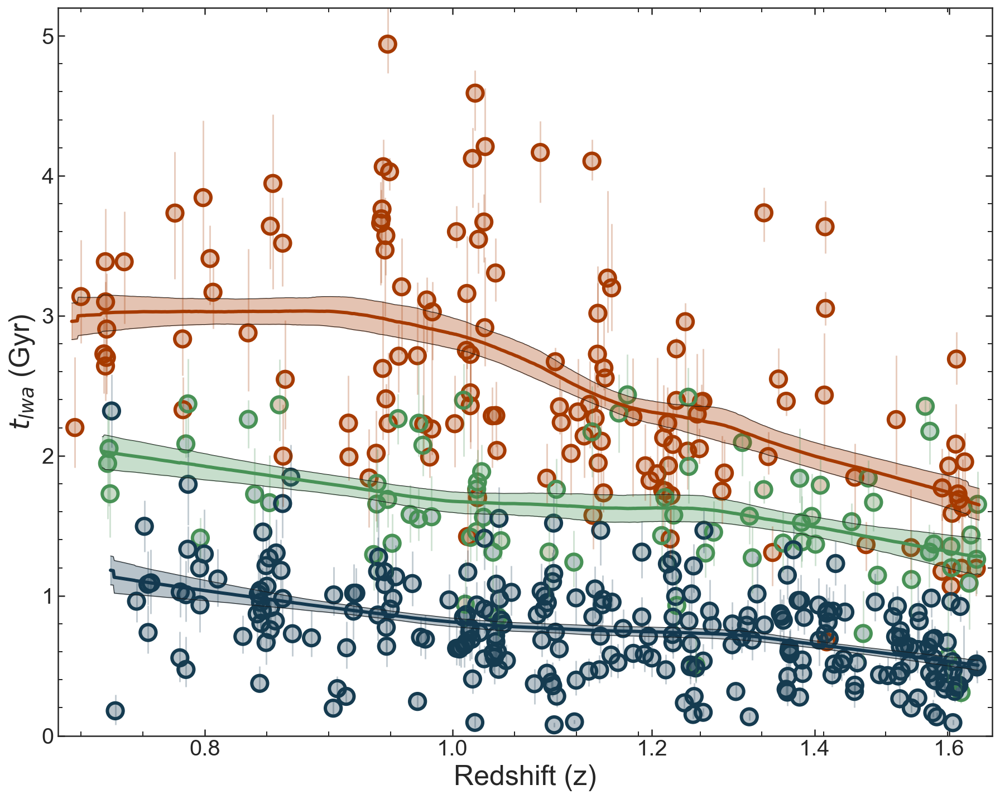

In [349]:
plt.figure(figsize = [15,12])
ax6= plt.subplot()
sea.scatterplot(Adb.lbt, Adb.lwa, hue = Adb.sf_prob_ml, palette=CMAP, s = 200,ax = ax6, legend=None, alpha =0.3 )
sea.scatterplot(Adb.query('sf_prob_ml < 0.1').lbt, Adb.query('sf_prob_ml < 0.1').lwa,
                color = 'none', edgecolor = CMAP(0), s = 200,ax = ax6, legend=None, linewidth = 3 )
sea.scatterplot(Adb.query('0.1 < sf_prob_ml < 0.9').lbt, Adb.query('0.1 < sf_prob_ml < 0.9').lwa,
                color = 'none', edgecolor = CMAP(0.5), s = 200,ax = ax6, legend=None, linewidth = 3 )
sea.scatterplot(Adb.query('sf_prob_ml > 0.9').lbt, Adb.query('sf_prob_ml > 0.9').lwa,
                color = 'none', edgecolor = CMAP(0.99), s = 200,ax = ax6, legend=None, linewidth = 3 )

lerr = []
herr = []

for i in Adb.query('sf_prob_ml < 0.1').index:
    hdr = Adb['lwa_hdr'][i]
    val = Adb['lwa'][i] 
    lerr.append(val - hdr[0])
    herr.append(hdr[1] - val) 

ax6.errorbar(Adb.query('sf_prob_ml < 0.1').lbt, Adb.query('sf_prob_ml < 0.1').lwa,
            yerr = [lerr, herr], linestyle = 'none',alpha = 0.25, color = CMAP(0))  


lerr = []
herr = []

for i in Adb.query('0.1 < sf_prob_ml < 0.9').index:
    hdr = Adb['lwa_hdr'][i]
    val = Adb['lwa'][i] 
    lerr.append(val - hdr[0])
    herr.append(hdr[1] - val) 

ax6.errorbar(Adb.query('0.1 < sf_prob_ml < 0.9').lbt, Adb.query('0.1 < sf_prob_ml < 0.9').lwa,
            yerr = [lerr, herr], linestyle = 'none',alpha = 0.25, color = CMAP(0.5))  

lerr = []
herr = []

for i in Adb.query('sf_prob_ml > 0.9').index:
    hdr = Adb['lwa_hdr'][i]
    val = Adb['lwa'][i] 
    lerr.append(val - hdr[0])
    herr.append(hdr[1] - val) 

ax6.errorbar(Adb.query('sf_prob_ml > 0.9').lbt, Adb.query('sf_prob_ml > 0.9').lwa,
            yerr = [lerr, herr], linestyle = 'none',alpha = 0.25, color = CMAP(0.99))  

lbt,m,l,h =gen_grid_lims('../data/plot_points/Lz.npy')
AGE = cosmo.age(0).value - lbt
ax6.plot(lbt, m*AGE,color = CMAP(0), linewidth = 3)
ax6.plot(lbt, l*AGE,color = 'k', linewidth = .5)
ax6.plot(lbt, h*AGE,color = 'k', linewidth = .5)
ax6.fill_between(lbt,l*AGE, h*AGE,color = CMAP(0), alpha = 0.3)
print((m*AGE)[0]-(m*AGE)[-1])


lbt,m,l,h =gen_grid_lims('../data/plot_points/Tz.npy')
AGE = cosmo.age(0).value - lbt
ax6.plot(lbt, m*AGE,color = CMAP(0.5), linewidth = 3)
ax6.plot(lbt, l*AGE,color = 'k', linewidth = .5)
ax6.plot(lbt, h*AGE,color = 'k', linewidth = .5)
ax6.fill_between(lbt,l*AGE, h*AGE,color = CMAP(0.5), alpha = 0.3)
print((m*AGE)[0]-(m*AGE)[-1])

lbt,m,l,h =gen_grid_lims('../data/plot_points/Hz.npy')
AGE = cosmo.age(0).value - lbt
ax6.plot(lbt, m*AGE,color = CMAP(1.0), linewidth = 3)
ax6.plot(lbt, l*AGE,color = 'k', linewidth = .5)
ax6.plot(lbt, h*AGE,color = 'k', linewidth = .5)
ax6.fill_between(lbt,l*AGE, h*AGE,color = CMAP(1.0), alpha = 0.3)
print((m*AGE)[0]-(m*AGE)[-1])
ax6.set_ylim(0,5.2)
ax6.set_xlim(6.3,9.65)

ax6.set_xticks(cosmo.lookback_time([0.8,1.0,1.2, 1.4,1.6]).value);ax6.set_xticklabels([0.8,1.0,1.2, 1.4,1.6])
ax6.set_ylabel('$t_{lwa}$ (Gyr)', fontsize = 25);ax6.set_xlabel('Redshift (z)', fontsize = 25);
ax6.tick_params(axis='both', which='major', labelsize=20)
plt.savefig('../plots/evolution_plots/PSF_tmscl_trim.png', bbox_inches = 'tight')  

In [115]:
s1_flx, s1_err = stack_setup(Ldb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and scl_tq < 0.23'), swave)
s2_flx, s2_err = stack_setup(Ldb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and scl_tq > 0.23'), swave)
s3_flx, s3_err = stack_setup(Hdb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and scl_tq < 0.23'), swave)
s4_flx, s4_err = stack_setup(Hdb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and scl_tq > 0.23'), swave)

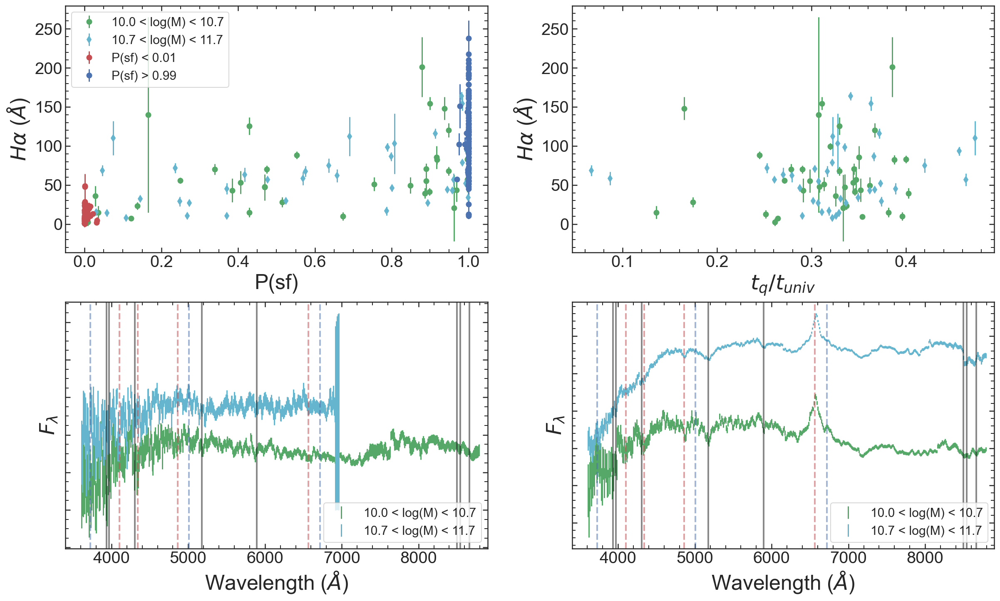

In [116]:
gs = gridspec.GridSpec(2,2, wspace = 0.2)
plt.figure(figsize = [20,12])
ax1 = plt.subplot(gs[0]);ax2 = plt.subplot(gs[1]);ax3 = plt.subplot(gs[2]);ax4 = plt.subplot(gs[3]);

ax1.errorbar(Ldb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and 0<Ha_EW<250').sf_prob_cont, 
                Ldb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW, 
             yerr=Ldb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW_sig,
             fmt = 'o', color = 'g', label ='10.0 < log(M) < 10.7')
ax1.errorbar(Hdb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and 0<Ha_EW<250').sf_prob_cont, 
                Hdb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW, 
             yerr=Hdb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW_sig,
             fmt = 'd', color = 'c', label ='10.7 < log(M) < 11.7')

ax1.errorbar(Ldb.query('sf_prob_ml < 0.01 and zgrism < 1.5 and 0<Ha_EW<250').sf_prob_cont, 
                Ldb.query('sf_prob_ml < 0.01 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW, 
             yerr=Ldb.query('sf_prob_ml < 0.01 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW_sig, 
             fmt='o',color = 'r', label ='P(sf) < 0.01')
ax1.errorbar(Hdb.query('sf_prob_ml < 0.01 and zgrism < 1.5 and 0<Ha_EW<250').sf_prob_cont, 
                Hdb.query('sf_prob_ml < 0.01 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW, 
             yerr=Hdb.query('sf_prob_ml < 0.01 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW_sig, 
             fmt='o',color = 'r')

ax1.errorbar(Ldb.query('sf_prob_ml > 0.99 and zgrism < 1.5 and 0<Ha_EW<250').sf_prob_cont, 
                Ldb.query('sf_prob_ml > 0.99 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW, 
             yerr=Ldb.query('sf_prob_ml > 0.99 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW_sig, 
             fmt='o',color = 'b', label ='P(sf) > 0.99')
ax1.errorbar(Hdb.query('sf_prob_ml > 0.99 and zgrism < 1.5 and 0<Ha_EW<250').sf_prob_cont, 
                Hdb.query('sf_prob_ml > 0.99 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW, 
             yerr=Hdb.query('sf_prob_ml > 0.99 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW_sig, 
             fmt='o',color = 'b')


ax2.errorbar(Ldb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and 0<Ha_EW<250').scl_tq, 
                Ldb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW, 
             yerr=Ldb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW_sig,
             fmt = 'o', color = 'g', label ='0.01 < P(sf) < 0.99 - log(M)<10.7')
ax2.errorbar(Hdb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and 0<Ha_EW<250').scl_tq, 
                Hdb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW, 
             yerr=Hdb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW_sig,
             fmt = 'd', color = 'c', label ='0.01 < P(sf) < 0.99 - log(M)>10.7')

plot_spec(ax3, swave, s1_flx, s1_err, 3600, 8800, 'g', '10.0 < log(M) < 10.7')
plot_spec(ax4, swave, s2_flx, s2_err, 3600, 8800, 'g', '10.0 < log(M) < 10.7')
plot_spec(ax3, swave, s3_flx+.0002, s3_err, 3600, 8100, 'c', '10.7 < log(M) < 11.7')
plot_spec(ax4, swave, s4_flx+.0002, s4_err, 3600, 8800, 'c', '10.7 < log(M) < 11.7')

ax3.set_yticklabels([])
ax4.set_yticklabels([])
ax3.set_xlim(3400, 8900);ax4.set_xlim(3400, 8900)
ax1.set_xlabel('P(sf)', fontsize = 25);ax2.set_xlabel('$t_q / t_{univ}$', fontsize = 25);
ax3.set_xlabel('Wavelength ($\AA$)', fontsize = 25);ax4.set_xlabel('Wavelength ($\AA$)', fontsize = 25);

ax1.set_ylabel('$H \\alpha$ ($\AA$)', fontsize = 25);ax2.set_ylabel('$H \\alpha$ ($\AA$)', fontsize = 25);
ax3.set_ylabel('$F_{\lambda}$', fontsize = 25);ax4.set_ylabel('$F_{\lambda}$', fontsize = 25);

ax1.legend(fontsize = 15);
ax3.legend(fontsize = 15, loc = 4);ax4.legend(fontsize = 15, loc = 4);

ax1.tick_params(axis='both', which='major', labelsize=20)
ax2.tick_params(axis='both', which='major', labelsize=20)
ax3.tick_params(axis='both', which='major', labelsize=20)
ax4.tick_params(axis='both', which='major', labelsize=20)
plt.savefig('../plots/evolution_plots/PSF_Ha_qch_3.png', bbox_inches = 'tight')    

In [217]:
s1_flx, s1_err = stack_setup(Ldb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and q_slope > 10'), swave)
s2_flx, s2_err = stack_setup(Ldb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and 0 < q_slope < 10'), swave)
# s3_flx, s3_err = stack_setup(Hdb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and q_slope > 10'), swave)
s4_flx, s4_err = stack_setup(Hdb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and 0 < q_slope < 10'), swave)

<AxesSubplot:xlabel='q_time', ylabel='Ha_EW'>

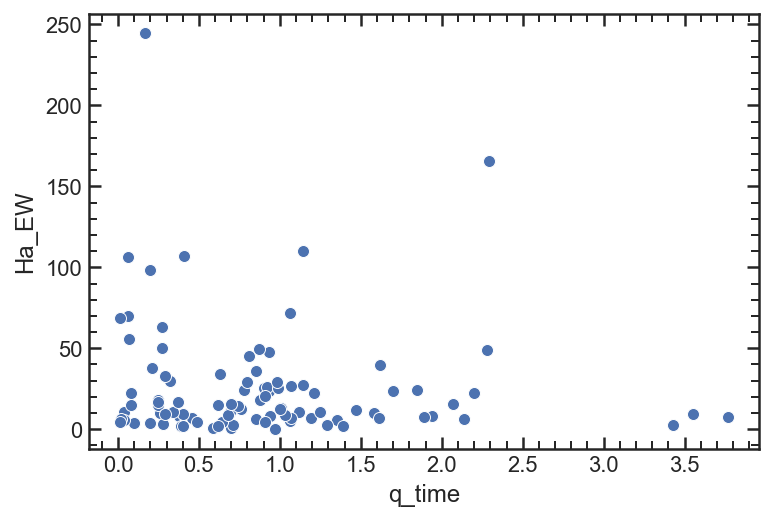

In [230]:
sea.scatterplot(Adb.query('q_slope > 0 and 0 < Ha_EW < 250').q_time, Adb.query('q_slope > 0 and 0 < Ha_EW < 250').Ha_EW)

<AxesSubplot:xlabel='q_slope', ylabel='Density'>

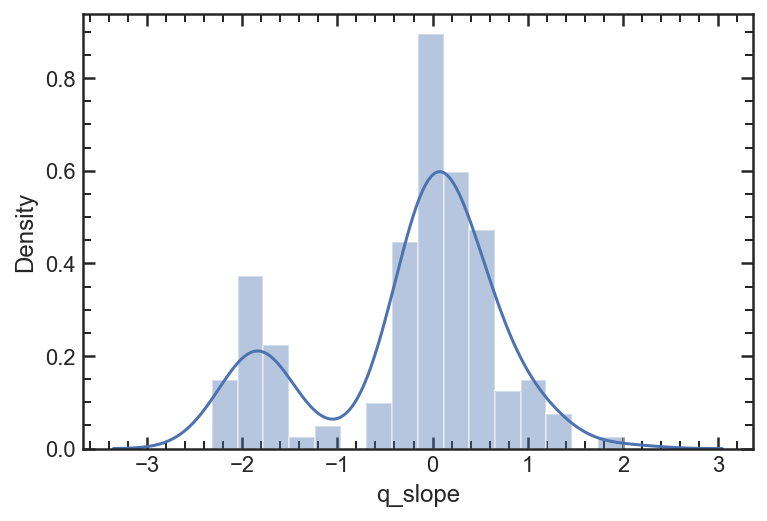

In [225]:
sea.distplot(np.log10(Adb.query('q_slope > 0 and 0 < Ha_EW < 250').q_slope))

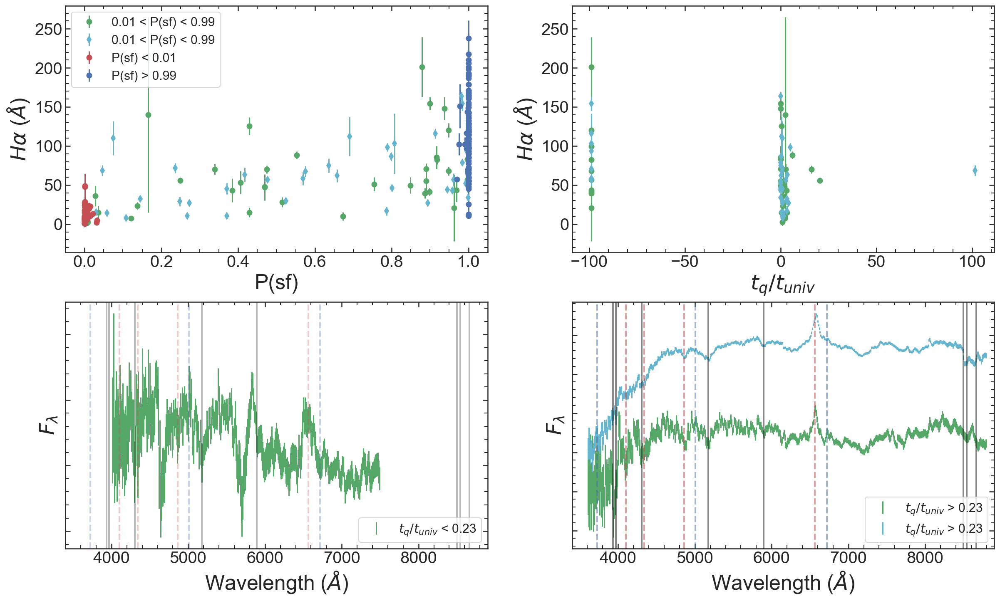

In [218]:
gs = gridspec.GridSpec(2,2, wspace = 0.2)
plt.figure(figsize = [20,12])
ax1 = plt.subplot(gs[0]);ax2 = plt.subplot(gs[1]);ax3 = plt.subplot(gs[2]);ax4 = plt.subplot(gs[3]);

ax1.errorbar(Ldb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and 0<Ha_EW<250').sf_prob_cont, 
                Ldb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW, 
             yerr=Ldb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW_sig,
             fmt = 'o', color = 'g', label ='0.01 < P(sf) < 0.99')
ax1.errorbar(Hdb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and 0<Ha_EW<250').sf_prob_cont, 
                Hdb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW, 
             yerr=Hdb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW_sig,
             fmt = 'd', color = 'c', label ='0.01 < P(sf) < 0.99')

ax1.errorbar(Adb.query('sf_prob_ml < 0.01 and zgrism < 1.5 and 0<Ha_EW<250').sf_prob_cont, 
                Adb.query('sf_prob_ml < 0.01 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW, 
             yerr=Adb.query('sf_prob_ml < 0.01 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW_sig, 
             fmt='o',color = 'r', label ='P(sf) < 0.01')
ax1.errorbar(Adb.query('sf_prob_ml > 0.99 and zgrism < 1.5 and 0<Ha_EW<250').sf_prob_cont, 
                Adb.query('sf_prob_ml > 0.99 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW, 
             yerr=Adb.query('sf_prob_ml > 0.99 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW_sig, 
             fmt='o',color = 'b', label ='P(sf) > 0.99')

ax2.errorbar(Ldb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and 0<Ha_EW<250').q_slope, 
                Ldb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW, 
             yerr=Ldb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW_sig,
             fmt = 'o', color = 'g', label ='0.01 < P(sf) < 0.99 - log(M)<10.7')
ax2.errorbar(Hdb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and 0<Ha_EW<250').q_slope, 
                Hdb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW, 
             yerr=Hdb.query('0.01 < sf_prob_ml < 0.99 and zgrism < 1.5 and 0<Ha_EW<250').Ha_EW_sig,
             fmt = 'd', color = 'c', label ='0.01 < P(sf) < 0.99 - log(M)>10.7')

plot_spec(ax3, swave, s1_flx, s1_err, 4000, 7500, 'g', '$t_q / t_{univ}$ < 0.23')
plot_spec(ax4, swave, s2_flx, s2_err, 3600, 8800, 'g', '$t_q / t_{univ}$ > 0.23')
# plot_spec(ax3, swave, s3_flx+.0002, s3_err, 4000, 6800, 'c', '$t_q / t_{univ}$ < 0.23')
plot_spec(ax4, swave, s4_flx+.0002, s4_err, 3600, 8800, 'c', '$t_q / t_{univ}$ > 0.23')

ax3.set_yticklabels([])
ax4.set_yticklabels([])
ax3.set_xlim(3400, 8900);ax4.set_xlim(3400, 8900)
ax1.set_xlabel('P(sf)', fontsize = 25);ax2.set_xlabel('$t_q / t_{univ}$', fontsize = 25);
ax3.set_xlabel('Wavelength ($\AA$)', fontsize = 25);ax4.set_xlabel('Wavelength ($\AA$)', fontsize = 25);

ax1.set_ylabel('$H \\alpha$ ($\AA$)', fontsize = 25);ax2.set_ylabel('$H \\alpha$ ($\AA$)', fontsize = 25);
ax3.set_ylabel('$F_{\lambda}$', fontsize = 25);ax4.set_ylabel('$F_{\lambda}$', fontsize = 25);

ax1.legend(fontsize = 15);
ax3.legend(fontsize = 15, loc = 4);ax4.legend(fontsize = 15, loc = 4);

ax1.tick_params(axis='both', which='major', labelsize=20)
ax2.tick_params(axis='both', which='major', labelsize=20)
ax3.tick_params(axis='both', which='major', labelsize=20)
ax4.tick_params(axis='both', which='major', labelsize=20)
# plt.savefig('../plots/evolution_plots/PSF_Ha_qch.png', bbox_inches = 'tight')    

In [387]:
Adb['concen'] = (Adb.Sigma1 * np.pi) / (10**Adb.lmass)
Ldb = Adb.query('lmass < 10.8')
Hdb = Adb.query('lmass > 10.8')

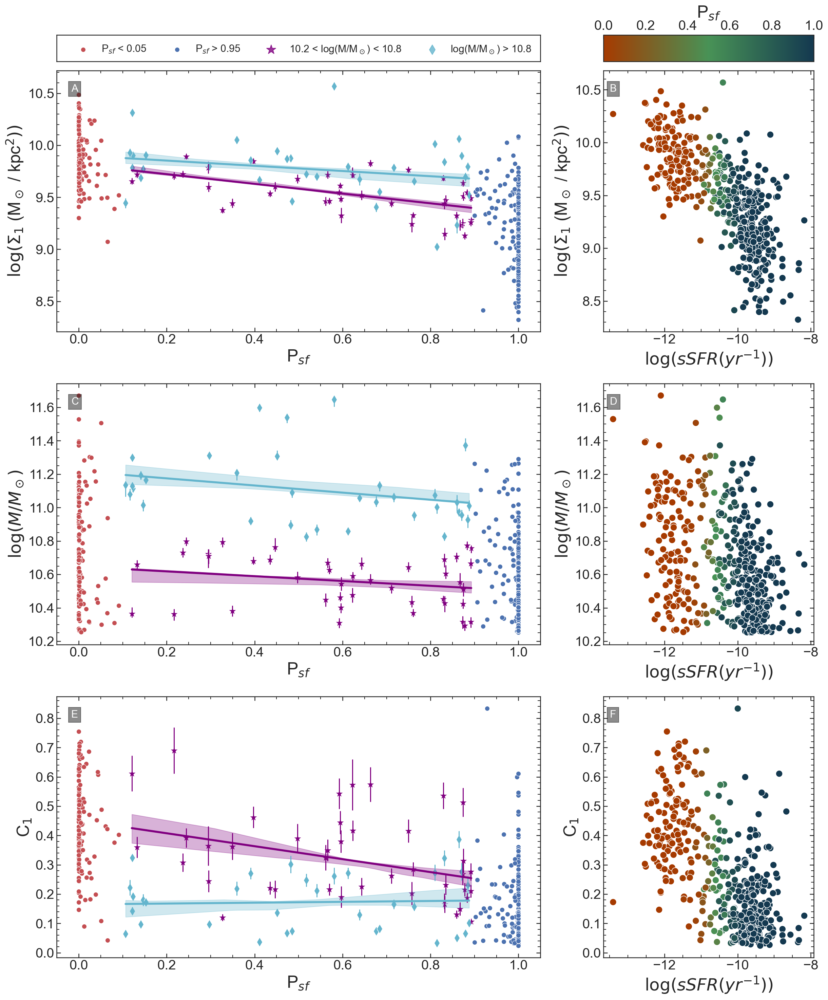

In [382]:
gsm = gridspec.GridSpec(2,3, wspace=0.3, hspace = 0.02, height_ratios=[0.03,1])
gs = gridspec.GridSpecFromSubplotSpec(3,3, gsm[1,:], wspace = 0.3)
plt.figure(figsize = [20,25])
ax7 = plt.subplot(gsm[0,:2])
ax8 = plt.subplot(gsm[0,2])
ax1 = plt.subplot(gs[0,:2])
ax2 = plt.subplot(gs[0,2])
ax5 = plt.subplot(gs[1,:2])
ax6 = plt.subplot(gs[1,2])
ax3 = plt.subplot(gs[2,:2])
ax4 = plt.subplot(gs[2,2])


sea.scatterplot(Adb.query('sf_prob_ml < 0.1').sf_prob_ml, 
                Adb.query('sf_prob_ml < 0.1').log_Sigma1, color = 'r',
                s = 50, ax = ax1)

sea.scatterplot(Adb.query('sf_prob_ml >0.9').sf_prob_ml, 
                Adb.query('sf_prob_ml >0.9').log_Sigma1, color = 'b',
                s = 50, ax = ax1)


sea.scatterplot(Ldb.query('0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
                Ldb.query('0.1 < sf_prob_ml < 0.9').log_Sigma1, 
            color = 'purple', marker = '*', s= 200,
            ax = ax1)

sea.scatterplot(Hdb.query('0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
                Hdb.query('0.1 < sf_prob_ml < 0.9').log_Sigma1, 
            color = 'c', marker = 'd', s= 100,
            ax = ax1)

ax1.errorbar(Hdb.query('0.1 < sf_prob_ml < 0.9').sf_prob_ml,
                Hdb.query('0.1 < sf_prob_ml < 0.9').log_Sigma1,
            yerr = Hdb.query('0.1 < sf_prob_ml < 0.9').Sigma1_err / (Hdb.query('0.1 < sf_prob_ml < 0.9').Sigma1 * np.log(10)), linestyle = 'none', color = 'c')  


lx, ly, ller, lher = get_linmix_grid(Hdb.query('0.1 < sf_prob_ml < 0.9').sf_prob_ml,
                Hdb.query('0.1 < sf_prob_ml < 0.9').log_Sigma1,
                np.repeat(0.02, len( Hdb.query('0.1 < sf_prob_ml < 0.9'))), Hdb.query('0.1 < sf_prob_ml < 0.9').Sigma1_err / (Hdb.query('0.1 < sf_prob_ml < 0.9').Sigma1 * np.log(10)))

ax1.plot(lx, ly,'c', linewidth = 3)
ax1.fill_between(lx,ller, lher,color = 'c', alpha = 0.3)

ax1.errorbar(Ldb.query('0.1 < sf_prob_ml < 0.9').sf_prob_ml,
                Ldb.query('0.1 < sf_prob_ml < 0.9').log_Sigma1,
            yerr = Ldb.query('0.1 < sf_prob_ml < 0.9').Sigma1_err / (Ldb.query('0.1 < sf_prob_ml < 0.9').Sigma1 * np.log(10)), linestyle = 'none', color = 'purple')  


lx, ly, ller, lher = get_linmix_grid(Ldb.query('0.1 < sf_prob_ml < 0.9').sf_prob_ml,
                Ldb.query('0.1 < sf_prob_ml < 0.9').log_Sigma1,
                np.repeat(0.02, len( Ldb.query('0.1 < sf_prob_ml < 0.9'))), Ldb.query('0.1 < sf_prob_ml < 0.9').Sigma1_err / (Ldb.query('0.1 < sf_prob_ml < 0.9').Sigma1 * np.log(10)))

ax1.plot(lx, ly,'purple', linewidth = 3)
ax1.fill_between(lx,ller, lher,color = 'purple', alpha = 0.3)

ax1.set_xlim(-0.05,1.05)
ax1.set_xlabel('P$_{sf}$', fontsize = 25)
ax1.set_ylabel('$\log(\Sigma_1$ (M$_\odot$ / kpc$^2))$', fontsize = 25)
# ax1.legend(fontsize = 18, loc = 3);
ax1.tick_params(axis='both', which='major', labelsize=20)

ax2.set_xlabel('$\log(sSFR (yr^{-1}))$', fontsize = 25)
ax2.set_ylabel('$\log(\Sigma_1$ (M$_\odot$ / kpc$^2))$', fontsize = 25)
ax2.tick_params(axis='both', which='major', labelsize=20)
sea.scatterplot(Adb.log_ssfr, Adb.log_Sigma1, hue = Adb.sf_prob_ml, palette=CMAP, s = 100,ax = ax2, legend=None)


#################
sea.scatterplot(Adb.query('sf_prob_ml < 0.1').sf_prob_ml, 
            Adb.query('sf_prob_ml < 0.1').concen, color = 'r',
             s = 50, ax = ax3)

sea.scatterplot(Adb.query('sf_prob_ml >0.9').sf_prob_ml, 
            Adb.query('sf_prob_ml >0.9').concen, color = 'b',
             s = 50, ax = ax3)


sea.scatterplot(Ldb.query('0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
               Ldb.query('0.1 < sf_prob_ml < 0.9').concen, 
            color = 'purple', marker = '*', s= 200,
         ax = ax3)

sea.scatterplot(Hdb.query('0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
               Hdb.query('0.1 < sf_prob_ml < 0.9').concen, 
            color = 'c', marker = 'd', s= 100,
         ax = ax3)

lerr, herr = get_err(Hdb.query('0.1 < sf_prob_ml < 0.9'), 'lmass')
M = 10**Hdb.query('0.1 < sf_prob_ml < 0.9').lmass.values
dlm = (lerr +herr)/2 
dm = dlm * np.log(10) * M

S1 = Hdb.query('0.1 < sf_prob_ml < 0.9').Sigma1.values
dS1 = Hdb.query('0.1 < sf_prob_ml < 0.9').Sigma1_err.values

dCT = np.sqrt( (np.pi/M)**2*dS1**2 +  ((np.pi * S1)/M**2)**2 * dm**2)


ax3.errorbar(Hdb.query('0.1 < sf_prob_ml < 0.9').sf_prob_ml,
                Hdb.query('0.1 < sf_prob_ml < 0.9').concen,
            yerr = dCT, linestyle = 'none', color = 'c')  


lx, ly, ller, lher = get_linmix_grid(Hdb.query('0.1 < sf_prob_ml < 0.9').sf_prob_ml,
                Hdb.query('0.1 < sf_prob_ml < 0.9').concen,
                np.repeat(0.02, len(dCT)), dCT)

ax3.plot(lx, ly,'c', linewidth = 3)
ax3.fill_between(lx,ller, lher,color = 'c', alpha = 0.3)

lerr, herr = get_err(Ldb.query('0.1 < sf_prob_ml < 0.9'), 'lmass')
M = 10**Ldb.query('0.1 < sf_prob_ml < 0.9').lmass.values
dlm = (lerr +herr)/2 
dm = dlm * np.log(10) * M

S1 = Ldb.query('0.1 < sf_prob_ml < 0.9').Sigma1.values
dS1 = Ldb.query('0.1 < sf_prob_ml < 0.9').Sigma1_err.values

dCT = np.sqrt( (np.pi/M)**2*dS1**2 +  ((np.pi * S1)/M**2)**2 * dm**2)


ax3.errorbar(Ldb.query('0.1 < sf_prob_ml < 0.9').sf_prob_ml,
                Ldb.query('0.1 < sf_prob_ml < 0.9').concen,
            yerr = dCT, linestyle = 'none', color = 'purple')  


lx, ly, ller, lher = get_linmix_grid(Ldb.query('0.1 < sf_prob_ml < 0.9').sf_prob_ml,
                Ldb.query('0.1 < sf_prob_ml < 0.9').concen,
                np.repeat(0.02, len(dCT)), dCT)

ax3.plot(lx, ly,'purple', linewidth = 3)
ax3.fill_between(lx,ller, lher,color = 'purple', alpha = 0.3)


ax3.set_xlim(-0.05,1.05)
ax3.set_xlabel('P$_{sf}$', fontsize = 25)
ax3.set_ylabel('C$_1$', fontsize = 25)
ax3.tick_params(axis='both', which='major', labelsize=20)


ax4.set_xlabel('$\log(sSFR (yr^{-1}))$', fontsize = 25)
ax4.set_ylabel('C$_1$', fontsize = 25)
ax4.tick_params(axis='both', which='major', labelsize=20)
sea.scatterplot(Adb.log_ssfr, Adb.concen, hue = Adb.sf_prob_ml, palette=CMAP, s = 100,ax = ax4, legend=None)

#################
sea.scatterplot(Adb.query('sf_prob_ml < 0.1').sf_prob_ml, 
                Adb.query('sf_prob_ml < 0.1').lmass, color = 'r',
                 s = 50, ax = ax5)

sea.scatterplot(Adb.query('sf_prob_ml >0.9').sf_prob_ml, 
                Adb.query('sf_prob_ml >0.9').lmass, color = 'b',
                s = 50, ax = ax5)


sea.scatterplot(Ldb.query('0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
                Ldb.query('0.1 < sf_prob_ml < 0.9').lmass, 
            color = 'purple', marker = '*', s= 200,
            ax = ax5)

sea.scatterplot(Hdb.query('0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
                Hdb.query('0.1 < sf_prob_ml < 0.9').lmass, 
            color = 'c', marker = 'd', s= 100,
            ax = ax5)

lerr, herr = get_err(Hdb.query('0.1 < sf_prob_ml < 0.9'), 'lmass')

ax5.errorbar(Hdb.query('0.1 < sf_prob_ml < 0.9').sf_prob_ml,
                Hdb.query('0.1 < sf_prob_ml < 0.9').lmass,
            yerr = [lerr,herr], linestyle = 'none', color = 'c')  


lx, ly, ller, lher = get_linmix_grid(Hdb.query('0.1 < sf_prob_ml < 0.9').sf_prob_ml,
                Hdb.query('0.1 < sf_prob_ml < 0.9').lmass,
                np.repeat(0.02, len( lerr)), (lerr +herr)/2)

ax5.plot(lx, ly,'c', linewidth = 3)
ax5.fill_between(lx,ller, lher,color = 'c', alpha = 0.3)

lerr, herr = get_err(Ldb.query('0.1 < sf_prob_ml < 0.9'), 'lmass')

ax5.errorbar(Ldb.query('0.1 < sf_prob_ml < 0.9').sf_prob_ml,
                Ldb.query('0.1 < sf_prob_ml < 0.9').lmass,
            yerr = [lerr,herr], linestyle = 'none', color = 'purple')  


lx, ly, ller, lher = get_linmix_grid(Ldb.query('0.1 < sf_prob_ml < 0.9').sf_prob_ml,
                Ldb.query('0.1 < sf_prob_ml < 0.9').lmass,
                np.repeat(0.02, len( lerr)), (lerr +herr)/2)

ax5.plot(lx, ly,'purple', linewidth = 3)
ax5.fill_between(lx,ller, lher,color = 'purple', alpha = 0.3)



ax5.set_xlim(-0.05,1.05)
ax5.set_xlabel('P$_{sf}$', fontsize = 25)
ax5.set_ylabel('$\log(M/M_\odot)$', fontsize = 25)
ax5.tick_params(axis='both', which='major', labelsize=20)

ax6.set_xlabel('$\log(sSFR (yr^{-1}))$', fontsize = 25)
ax6.set_ylabel('$\log(M/M_\odot)$', fontsize = 25)
ax6.tick_params(axis='both', which='major', labelsize=20)

sea.scatterplot(Adb.log_ssfr, Adb.lmass, hue = Adb.sf_prob_ml, palette=CMAP, s = 100,ax = ax6, legend=None, )

norm = mpl.colors.Normalize(vmin=0, vmax=1)

mpl.colorbar.ColorbarBase(ax8, cmap=CMAP,
                                norm=norm,
                                orientation='horizontal')
ax8.set_xlabel('P$_{sf}$', fontsize = 25)
ax8.tick_params(axis='both', which='major', labelsize=20)
ax8.xaxis.set_ticks_position("top")
ax8.xaxis.set_label_position("top")

sea.scatterplot(Adb.query('sf_prob_ml < 0.1').sf_prob_ml, 
                Adb.query('sf_prob_ml < 0.1').log_Sigma1, color = 'r',
                label = 'P$_{sf}$ < 0.05', s = 50, ax = ax7)

sea.scatterplot(Adb.query('sf_prob_ml >0.9').sf_prob_ml, 
                Adb.query('sf_prob_ml >0.9').log_Sigma1, color = 'b',
               label = 'P$_{sf}$ > 0.95', s = 50, ax = ax7)


sea.regplot(Ldb.query('0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
                Ldb.query('0.1 < sf_prob_ml < 0.9').log_Sigma1, 
            color = 'purple',ci=68, marker = '*', scatter_kws= {'s' : 200},
           label = '10.2 < log(M/M$_\odot$) < 10.8', ax = ax7)

sea.regplot(Hdb.query('0.1 < sf_prob_ml < 0.9').sf_prob_ml, 
                Hdb.query('0.1 < sf_prob_ml < 0.9').log_Sigma1, 
            color = 'c',ci=68, marker = 'd', scatter_kws= {'s' : 100},
           label = 'log(M/M$_\odot$) > 10.8', ax = ax7)

ax7.legend(fontsize = 15, ncol = 4, frameon = False)
ax7.set_xlim(-99,-98)
ax7.set_ylim(-99,-98)
ax7.set_xticks([])
ax7.set_yticks([])
ax7.set_xlabel('')
ax7.set_ylabel('')

t= ax1.text(0.03,0.92, 'A', fontsize = 15, color = 'w',transform=ax1.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))
    
t= ax2.text(0.03,0.92, 'B', fontsize = 15, color = 'w',transform=ax2.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

t= ax5.text(0.03,0.92, 'C', fontsize = 15, color = 'w',transform=ax5.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

t= ax6.text(0.03,0.92, 'D', fontsize = 15, color = 'w',transform=ax6.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

t= ax3.text(0.03,0.92, 'E', fontsize = 15, color = 'w',transform=ax3.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

t= ax4.text(0.03,0.92, 'F', fontsize = 15, color = 'w',transform=ax4.transAxes)
t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

plt.savefig('../plots/evolution_plots/PSF_morph.pdf', bbox_inches = 'tight')    

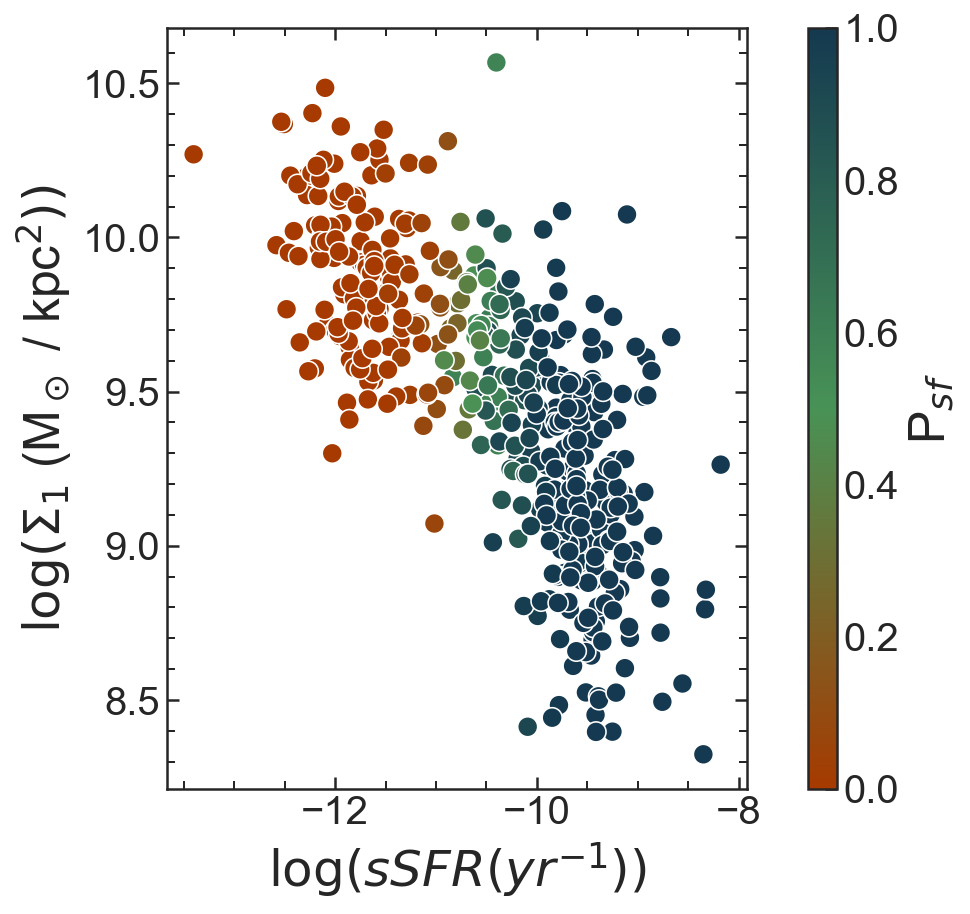

In [151]:

gs = gridspec.GridSpec(1,2,width_ratios=[20,1])
plt.figure(figsize = [6,7])
ax8 = plt.subplot(gs[1])
ax2 = plt.subplot(gs[0])


ax2.set_xlabel('$\log(sSFR (yr^{-1}))$', fontsize = 25)
ax2.set_ylabel('$\log(\Sigma_1$ (M$_\odot$ / kpc$^2))$', fontsize = 25)
ax2.tick_params(axis='both', which='major', labelsize=20)
sea.scatterplot(Adb.log_ssfr, Adb.log_Sigma1, hue = Adb.sf_prob_ml, palette=CMAP, s = 100,ax = ax2, legend=None)


norm = mpl.colors.Normalize(vmin=0, vmax=1)

mpl.colorbar.ColorbarBase(ax8, cmap=CMAP,
                                norm=norm,
                                orientation='vertical')
ax8.set_ylabel('P$_{sf}$', fontsize = 25)
ax8.tick_params(axis='both', which='major', labelsize=20)
ax8.yaxis.set_ticks_position("right")
ax8.yaxis.set_label_position("right")

plt.savefig('../plots/evolution_plots/sig1_ssfr.png', bbox_inches = 'tight')    

In [375]:
lx, ly, ller, lher = get_linmix_grid(Hdb.query('0.1 < sf_prob_ml < 0.9').sf_prob_ml,
                Hdb.query('0.1 < sf_prob_ml < 0.9').log_Sigma1,
                np.repeat(0.02, len( Hdb.query('0.1 < sf_prob_ml < 0.9'))), Hdb.query('0.1 < sf_prob_ml < 0.9').Sigma1_err / (Hdb.query('0.1 < sf_prob_ml < 0.9').Sigma1 * np.log(10)))

dlx = lx[1] - lx[0]
dly = ly[1] - ly[0]
print(dly/dlx)

lx, ly, ller, lher = get_linmix_grid(Ldb.query('0.1 < sf_prob_ml < 0.9').sf_prob_ml,
                Ldb.query('0.1 < sf_prob_ml < 0.9').log_Sigma1,
                np.repeat(0.02, len( Ldb.query('0.1 < sf_prob_ml < 0.9'))), Ldb.query('0.1 < sf_prob_ml < 0.9').Sigma1_err / (Ldb.query('0.1 < sf_prob_ml < 0.9').Sigma1 * np.log(10)))
dlx = lx[1] - lx[0]
dly = ly[1] - ly[0]
print(dly/dlx)

-0.24395337377947046
-0.466262420879603


In [376]:
0.244*0.8,0.466*0.8

(0.1952, 0.3728)

In [10]:
Adb['Sigma1_err'] = dS1

<AxesSubplot:xlabel='log_ssfr'>

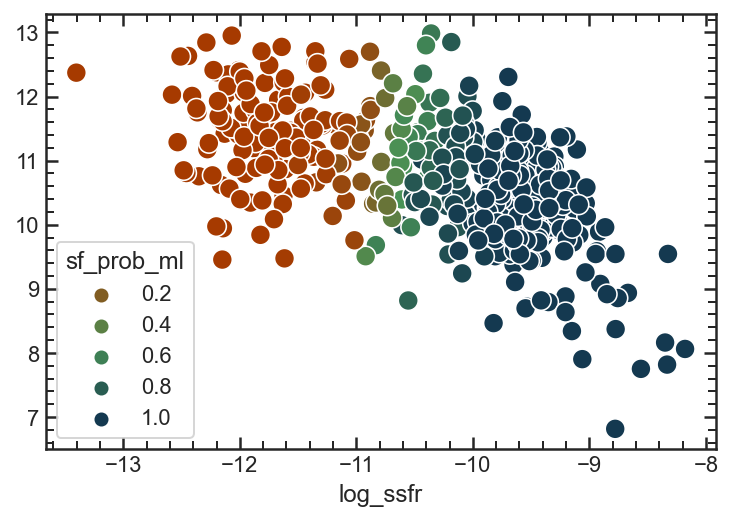

In [813]:
sea.scatterplot(Adb.log_ssfr, cosmo.lookback_time(Adb.z_50).value, hue = Adb.sf_prob_ml, palette=CMAP, s = 100,)


<AxesSubplot:xlabel='sf_prob_ml'>

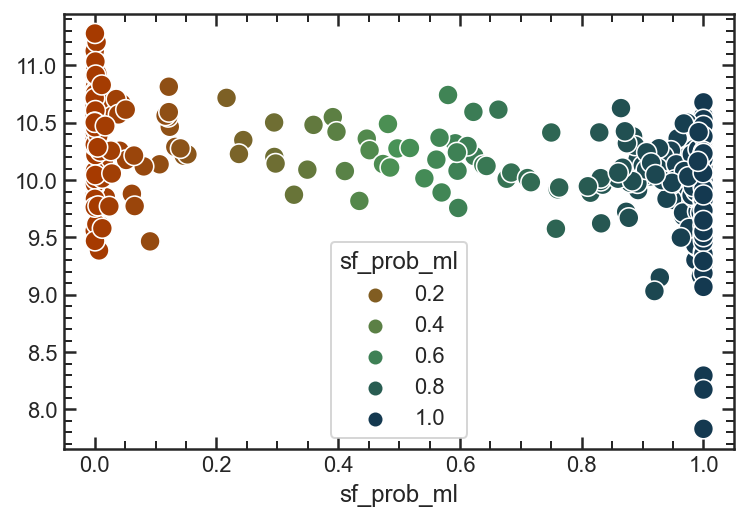

In [99]:
sea.scatterplot( Adb.sf_prob_ml, B_comp(Adb.Re, 10**Adb.lmass), hue = Adb.sf_prob_ml, palette=CMAP, s = 100,)


<AxesSubplot:xlabel='sf_prob_ml', ylabel='log_Sigma1'>

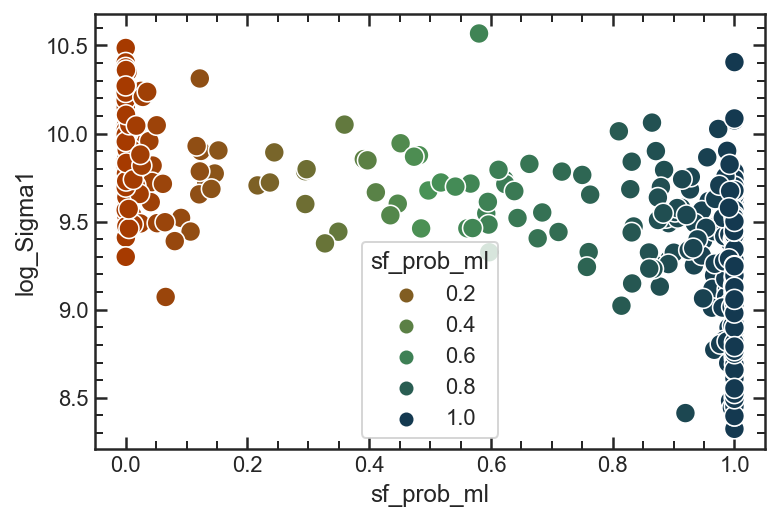

In [115]:
sea.scatterplot( Adb.sf_prob_ml,Adb.log_Sigma1, hue = Adb.sf_prob_ml, palette=CMAP, s = 100,)


In [96]:
def A_comp(R,M):
    return R / (M*1E-11)**(0.75)

def B_comp(R,M):
    return np.log10(M /R**1.5)

<AxesSubplot:xlabel='log_Sigma1'>

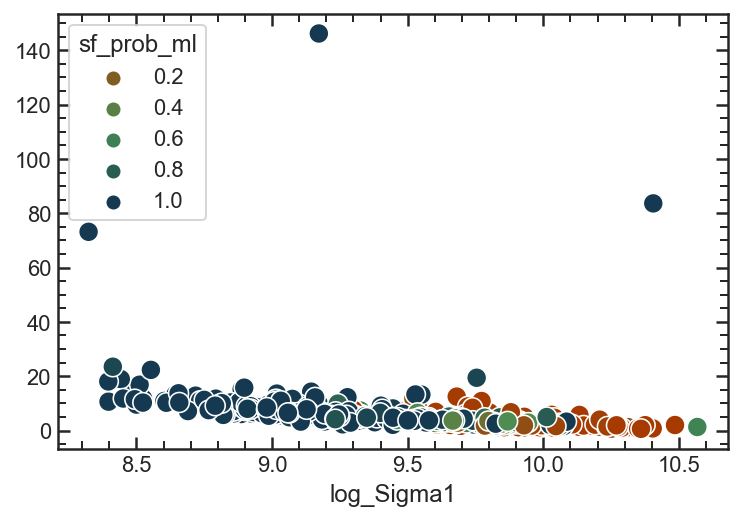

In [97]:
sea.scatterplot(Adb.log_Sigma1,A_comp(Adb.Re, 10**Adb.lmass), hue = Adb.sf_prob_ml, palette=CMAP, s = 100,)


<AxesSubplot:xlabel='log_Sigma1'>

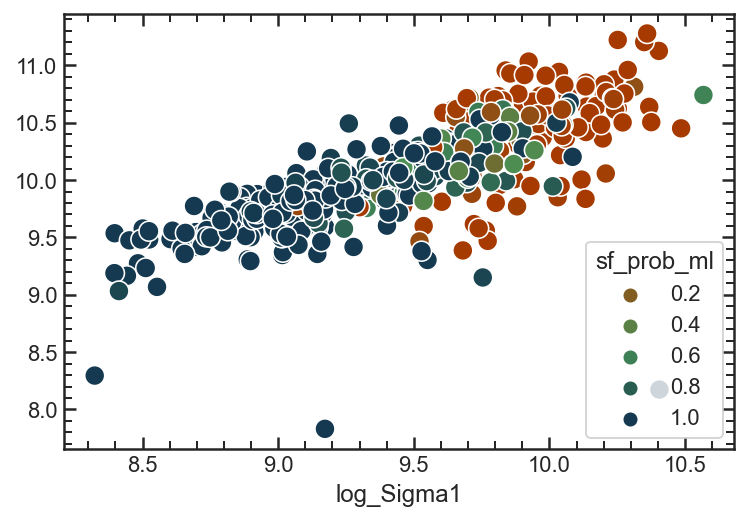

In [98]:
sea.scatterplot(Adb.log_Sigma1,B_comp(Adb.Re, 10**Adb.lmass), hue = Adb.sf_prob_ml, palette=CMAP, s = 100,)


<AxesSubplot:xlabel='log_Sigma1'>

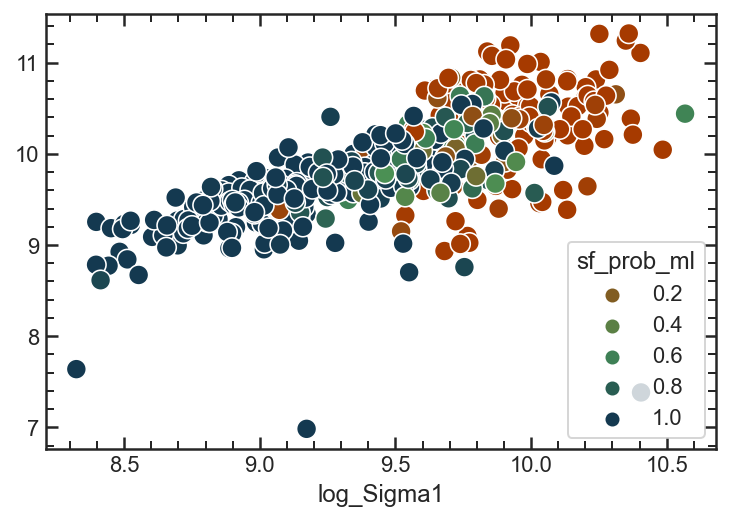

In [72]:
sea.scatterplot(Adb.log_Sigma1,Adb.lmass - np.log10(Adb.Re**2), hue = Adb.sf_prob_ml, palette=CMAP, s = 100,)


<AxesSubplot:xlabel='sf_prob_ml'>

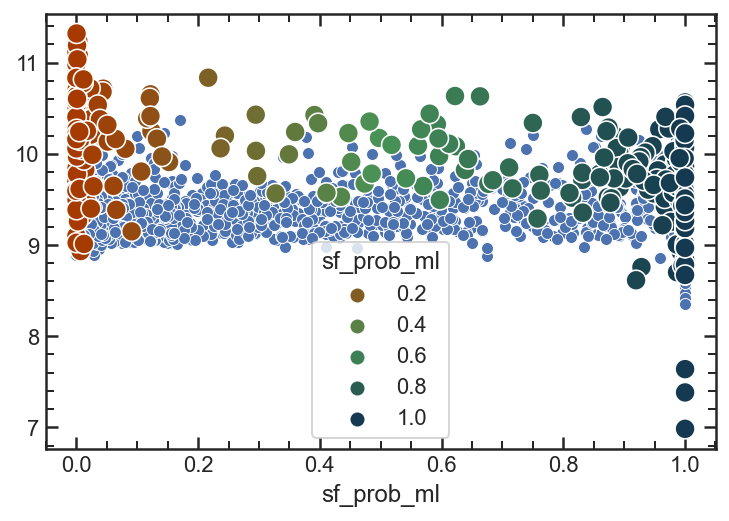

In [464]:
# sea.scatterplot(Adb.sf_prob_ml,Adb.lmass - np.log10(Adb.Re**2), hue = Adb.sf_prob_ml, palette=CMAP, s = 100,)
sea.scatterplot(Psfs,Bs)
sea.scatterplot(Adb.sf_prob_ml,Adb.lmass - np.log10(Adb.Re**2), hue = Adb.sf_prob_ml, palette=CMAP, s = 100,)


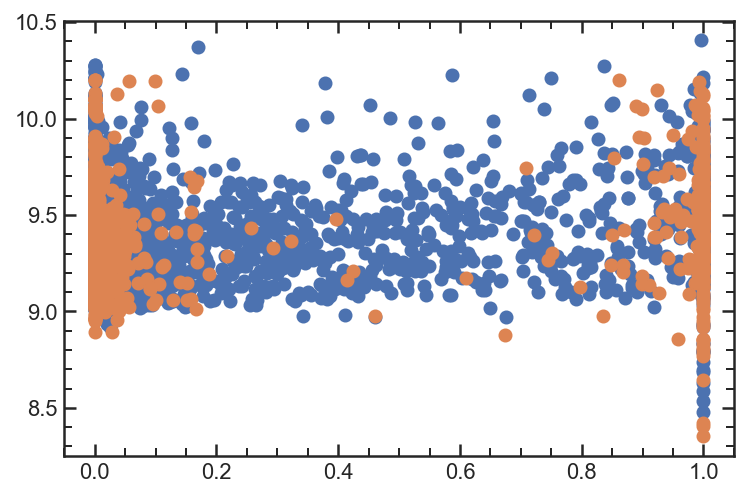

In [466]:
flist = glob('../data/Simba_evo/evo*')
Psfs_s = []
Bs_s = []

Psfs_f = []
Bs_f = []

Qts = []
Qts_s = []
Qz = []

for f in flist:
    Sid = os.path.basename(f).strip('evo_').strip('.npy')
    
    LBT, sSFR = np.load('../data/Simba_evo/sSFH_{}.npy'.format(Sid))
    isSFR = interp1d(LBT, sSFR)
    rshift,lm, sfr, r50, r20, r80 = np.load(f)
            
    ctime, fsps_t = gen_ctime(cosmo.age(rshift[0]).value)
    
    lbt, ssfr, re, lmass, sSFR_, LBT_ = get_msfr(ctime, sfr, lm, r50)
    Psf = []
    for i in range(len(lbt)):
        Psf.append(iSprob(isSFR(lbt[i]), lbt[i])[0])
    if Psf[-1] > 0.99:
        age = cosmo.age(rshift[0]).value
        t = (age - (LBT - LBT[0]))*1E9

        lsflim = np.log10(1/(3*t))
        lqlim = np.log10(1/(20*t))

        stoq,stoq_sf, qtos, falseq, falser,qz, gx ,gy =  crossover((LBT - LBT[0]),sSFR,lqlim,lsflim, rshift[0])
        if len(stoq) ==1:
            Qts.append(stoq[0])
            Qz.append(qz)
            
            if stoq[0] < 0.2:
                Psfs_f.extend(Psf)  
                Bs_f.extend(B_comp(np.array(re),np.array(lmass)))
            else:
                Psfs_s.extend(Psf)  
                Bs_s.extend(B_comp(np.array(re),np.array(lmass)))
            
Qts = np.array(Qts)
# Qts_s = np.array(Qts_s)
Qz = np.array(Qz)
        
        
        
        
plt.scatter(Psfs_s,Bs_s)
plt.scatter(Psfs_f,Bs_f)

#     break
# plt.plot(LBT, Psf)

<AxesSubplot:ylabel='Density'>

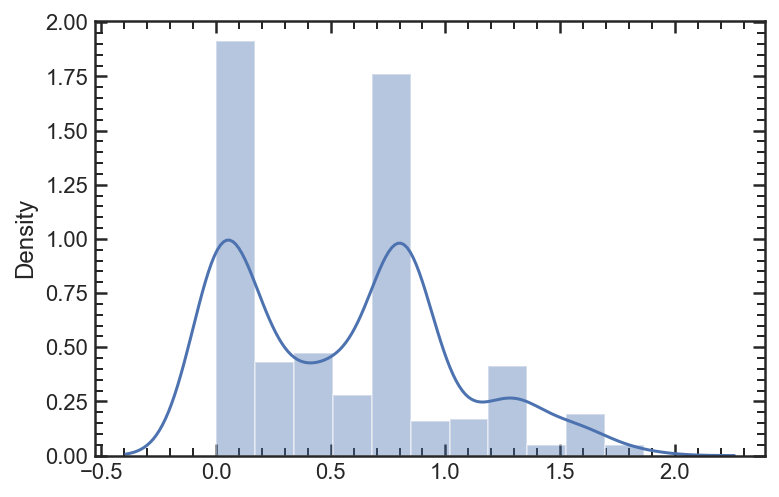

In [465]:
sea.distplot(Qts)

In [410]:
Gaussian_prior(np.random.rand(),[0.9,1.1],1, 0.03)

0.9747313607893233

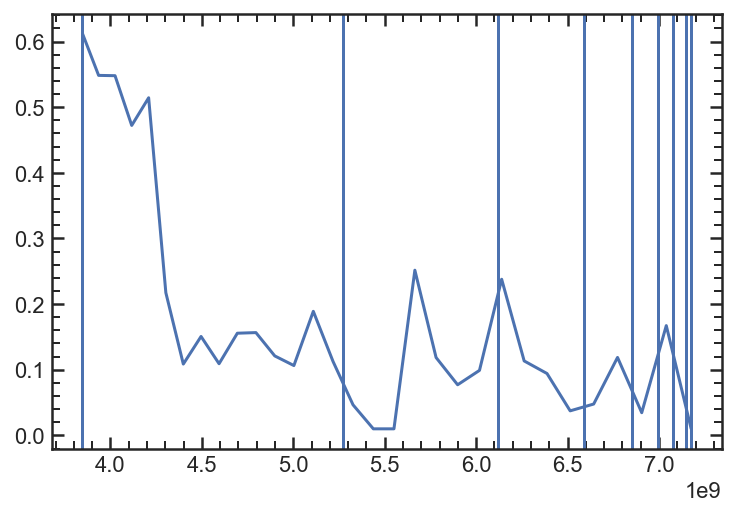

In [419]:
ctime, fsps_t = gen_ctime(cosmo.age(rshift[0]).value *Gaussian_prior(np.random.rand(),[0.9,1.1],1, 0.03))

plt.plot(cosmo.age(rshift)*1E9, sfr)
nfsps_t = fsps_t - max(fsps_t) + max(cosmo.age(rshift).value*1E9)
for s in ctime:
    plt.axvline(s)

In [412]:
gen_ctime(cosmo.age(rshift[0]).value * (1- 0.1 *np.random.rand()))
# fsps_t


(array([3.84673350e+09, 5.32685351e+09, 5.32722327e+09, 6.14414180e+09,
        6.14434813e+09, 6.60017516e+09, 6.60029028e+09, 6.85463423e+09,
        6.85469847e+09, 6.99661819e+09, 6.99665403e+09, 7.07584289e+09,
        7.07586289e+09, 7.14584445e+09, 7.14585045e+09, 7.17585289e+09]),
 array([6.98605095e+09, 6.95604851e+09, 6.95604251e+09, 6.88606095e+09,
        6.88604095e+09, 6.80685209e+09, 6.80681625e+09, 6.66489653e+09,
        6.66483229e+09, 6.41048834e+09, 6.41037322e+09, 5.95454618e+09,
        5.95433986e+09, 5.13742133e+09, 5.13705157e+09, 3.67299649e+09,
        3.67233381e+09, 1.04850146e+09, 1.04731383e+09, 6.98605095e+05]))

In [383]:
def gen_ctime(age):

    agebins = get_agebins(age)
    epsilon=1e-4


    agebins_yrs = 10**agebins.T
    dt = agebins_yrs[1, :] - agebins_yrs[0, :]
    bin_edges = np.unique(agebins_yrs)
    maxage = agebins_yrs.max()  # can replace maxage with something else, e.g. tuniv
    t = np.concatenate((bin_edges * (1.-epsilon), bin_edges * (1+epsilon)))
    t.sort()
    t = t[1:-1] # remove older than oldest bin, younger than youngest bin
    fsps_time = maxage - t
    nfsps_time = fsps_time - max(fsps_time) + max(cosmo.age(rshift).value*1E9)
    ctime = np.array(nfsps_time[:-4][::-1])
    ctime[0] = cosmo.age(rshift).value[-1]*1E9
    ctime[-1] = cosmo.age(rshift).value[0]*1E9
    
    return ctime, fsps_time
    
def get_msfr(ctime, sfr, mass, r50):
    isfr =interp1d(cosmo.age(rshift).value*1E9, sfr)
    ilm =interp1d(cosmo.age(rshift).value*1E9, lm)
    ir50 =interp1d(cosmo.age(rshift).value*1E9, r50)

    m_sfr = []
    m_lm = []
    m_r50 = []
    
    M_ssfr = []
    
    lbt = []
    
    for i in range(len(ctime)//2):
        lbt.append((ctime[i*2]+ctime[i*2+1])/2)
        bin_a = np.linspace(ctime[i*2],ctime[i*2+1])

        m = np.mean(isfr(bin_a)) 
        m2 = np.mean(ilm(bin_a)) 
        m3 = np.mean(ir50(bin_a)) 

        m_sfr.append(m)
        m_lm.append(m2)
        m_r50.append(m3)
        M_ssfr.append(np.log10(m/m2)) 
        M_ssfr.append(np.log10(m/m2))                
        
    lbt = -np.array(lbt)[::-1]*1E-9
    lbt +=cosmo.age(0).value       
        
    LBT = cosmo.age(0).value - ctime*1E-9,
        
    return lbt, np.log10(np.array(m_sfr[::-1])/np.array(m_lm[::-1])), m_r50[::-1], m_lm[::-1], M_ssfr[::-1], LBT[0][::-1]

In [440]:
for f in flist:
    Sid = os.path.basename(f).strip('evo_').strip('.npy')

5046
699
5052
3423
114
666
128
5085
1591
1778
4166
4614
5522
1744
1988
316
302
458
4006
2339
289
1142
1624
262
276
538
3782
5481
1368
4210
3219
2113
909
921
935
1426
2891
3557
5867
4589
707
934
2648
1341
1355
5133
920
1433
4211
5669
539
277
511
263
3032
4991
1157
4007
2476
4832
4198
303
1976
1962
317
1037
2258
1989
4615
2099
129
667
101
115
698
840
3344
3422
5053
3436
3378
4365
4401
5079
117
659
881
3385
1009
1753
498
5535
3636
3811
3187
329
3193
2460
5469
3756
4039
1141
5333
513
507
1814
1182
3795
4950
5496
3568
1419
2104
2662
1431
2886
705
2851
1380
738
1395
710
5865
2887
2893
2105
4212
2677
4560
1197
4945
248
260
512
1801
274
5454
4762
2475
1785
1949
1791
2298
314
472
466
300
4158
3145
499
5252
6001
894
3384
658
1593
102
3353
1544
1222
5736
1578
4366
3409
4414
847
5054
3431
1540
853
1568
648
660
106
112
1030
3633
1018
338
1959
462
476
3753
5444
4028
2317
2303
4014
1187
4799
1839
258
3974
1805
516
502
264
3237
1346
2115
2101
1408
3592
28
1391
2840
701
5860
729
29
1384
5109
2882
926
9

In [445]:

for f in flist:
    Sid = os.path.basename(f).strip('evo_').strip('.npy')
    
    if not os.path.isfile('../data/Simba_evo/sSFH_{}.npy'.format(Sid)):
        rshift,lm, sfr, r50, r20, r80 = np.load(f)

        stsSFR = []
        for x in range(1000):
            ctime, fsps_t = gen_ctime(cosmo.age(rshift[0]).value * Gaussian_prior(np.random.rand(),[0.8,1.2],1, 0.5))
            lbt, ssfr, re, lmass, sSFR, LBT = get_msfr(ctime, sfr, lm, r50)


            isSFR = interp1d(LBT, sSFR)
            nLBT = np.linspace(LBT[0], LBT[-1],1000)
            stsSFR.append(isSFR(nLBT))

        np.save('../data/Simba_evo/sSFH_{}.npy'.format(Sid), [nLBT, np.percentile(stsSFR, 50,axis = 0)])



In [302]:
Qts = []
Qts_s = []
Qz = []
gslp = []
Psfs = []
Bs = []

flist = glob('../data/Simba_evo/*')

for f in flist:

    rshift,lm, sfr, r50, r20, r80 = np.load(f)
    lbt, ssfr, re, lmass, sSFR, LBT = get_msfr(sfr, lm, r50)

    Psf = []
    for i in range(len(lbt)):
        Psf.append(iSprob(ssfr[i], lbt[i])[0])
    if Psf[-1] > 0.95:
        Psfs.extend(Psf)  
        Bs.extend(B_comp(np.array(re),np.array(lmass)))
    
    
        isSFR = interp1d(LBT, sSFR)
        nLBT = np.linspace(LBT[0], LBT[-1],1000)

        age = cosmo.age(rshift[0]).value
        t = (age - (nLBT - nLBT[0]))*1E9

        lsflim = np.log10(1/(3*t))
        lqlim = np.log10(1/(20*t))

        stoq,stoq_sf, qtos, falseq, falser,qz, gx ,gy =  crossover((nLBT - nLBT[0]),isSFR(nLBT),lqlim,lsflim, rshift[0])
        if len(stoq) > 0:
            Qts.append(stoq[0])
            Qts_s.append(stoq_sf[0]/stoq[0])
            Qz.append(qz)

        
#     break

Qts = np.array(Qts)
Qts_s = np.array(Qts_s)
Qz = np.array(Qz)


<AxesSubplot:>

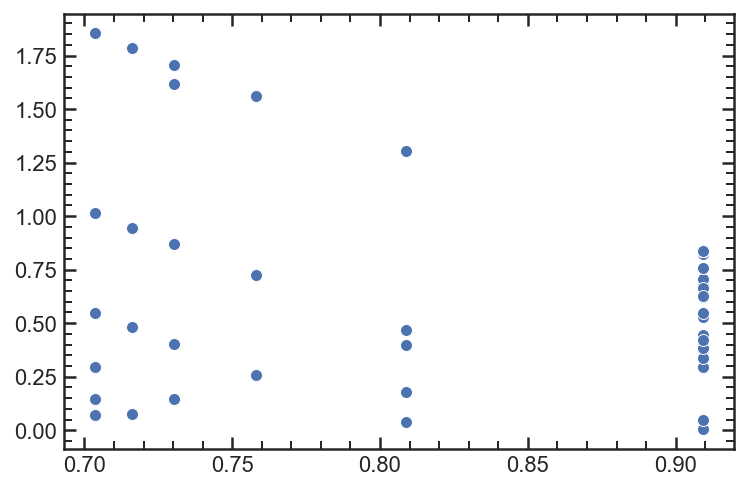

In [303]:
sea.scatterplot(Qz, Qts)

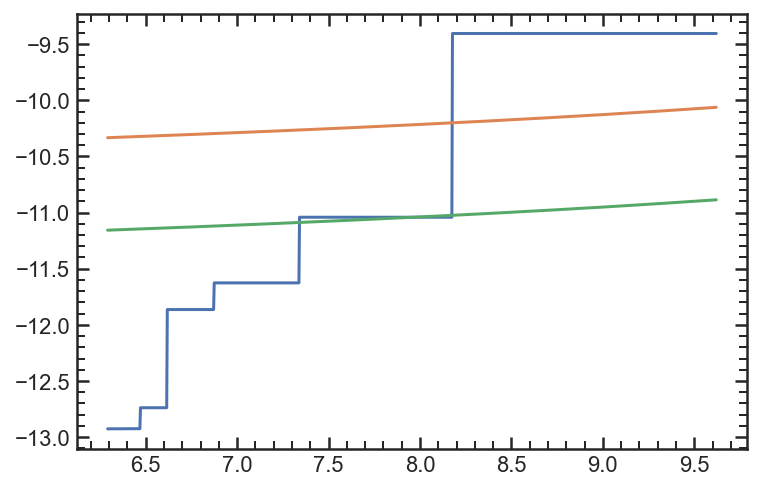

In [304]:
plt.plot(nLBT, isSFR(nLBT))
plt.plot(nLBT, lsflim)
plt.plot(nLBT, lqlim)

In [263]:
print(LBT[0], sSFR)

[9.62025045 8.17587485 8.17549794 7.33876737 7.33855786 6.87346052
 6.87334406 6.61481934 6.61475461 6.47105344 6.47101746 6.39114106
 6.39112106 6.3211395  6.3211335  6.29113106] [-11.005989557819134, -11.005989557819134, -11.379939942801354, -11.379939942801354, -11.344123801479453, -11.344123801479453, -11.469224322252694, -11.469224322252694, -11.523053624090483, -11.523053624090483, -11.197338023897707, -11.197338023897707, -11.428923392891777, -11.428923392891777, -11.921100723704956, -11.921100723704956]


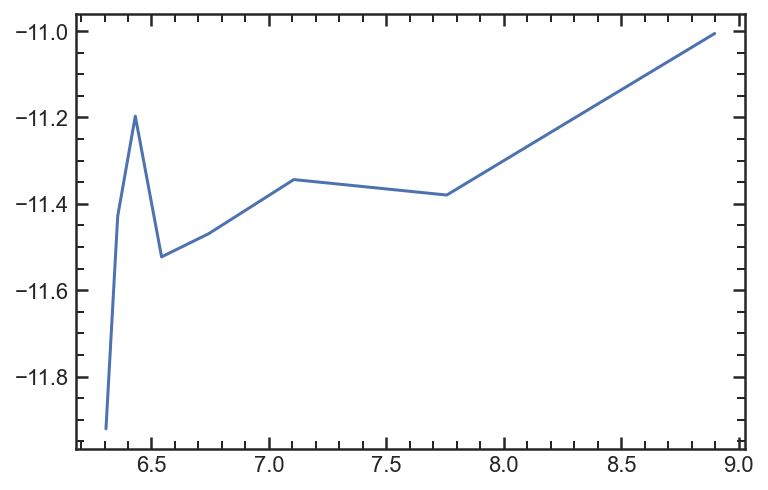

In [239]:
plt.plot(T, Ss)

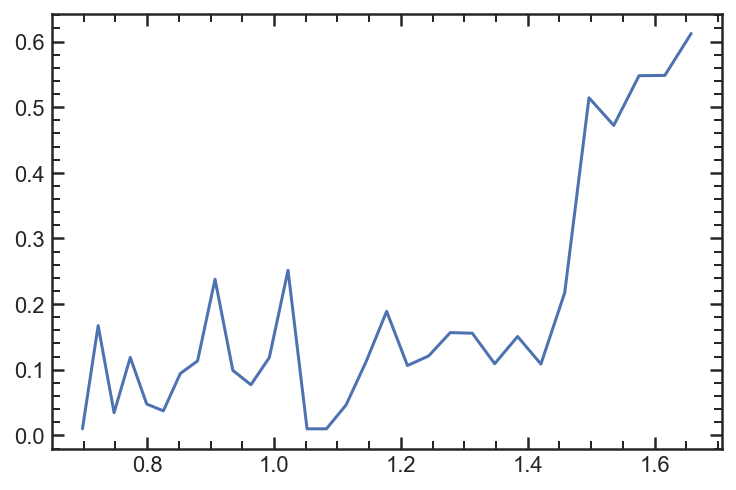

In [180]:
plt.plot(rshift, sfr)

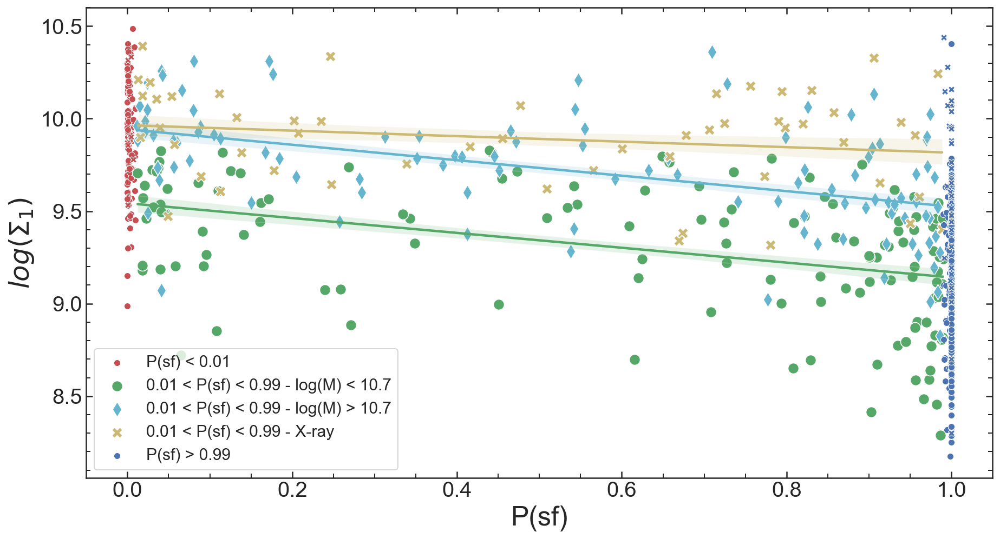

In [665]:
               plt.figure(figsize = [15,8])

sea.scatterplot(Ldb.query('sf_prob_cont < 0.01').sf_prob_cont, 
                Ldb.query('sf_prob_cont < 0.01').log_Sigma1, color = 'r',
               label = 'P(sf) < 0.01')
sea.scatterplot(Hdb.query('sf_prob_cont < 0.01').sf_prob_cont, 
                Hdb.query('sf_prob_cont < 0.01').log_Sigma1, color = 'r',)
sea.scatterplot(Xdb.query('sf_prob_cont < 0.01').sf_prob_cont, 
                Xdb.query('sf_prob_cont < 0.01').log_Sigma1, color = 'r',marker = 'X')

sea.scatterplot(Ldb.query('0.01 < sf_prob_cont < 0.99').sf_prob_cont, 
                Ldb.query('0.01 < sf_prob_cont < 0.99').log_Sigma1, color = 'g',
               label = '0.01 < P(sf) < 0.99 - log(M) < 10.7', s=100)

# sea.scatterplot(Ldb.query('0.01 < sf_prob_cont < 0.99 and scl_tq < 0.23').sf_prob_cont, 
#                 Ldb.query('0.01 < sf_prob_cont < 0.99 and scl_tq < 0.23').log_Sigma1, color = 'g',
#                 edgecolor = 'k', s=150)

sea.scatterplot(Hdb.query('0.01 < sf_prob_cont < 0.99').sf_prob_cont, 
                Hdb.query('0.01 < sf_prob_cont < 0.99').log_Sigma1, color = 'c',
               label = '0.01 < P(sf) < 0.99 - log(M) > 10.7', marker = 'd', s=100)

# sea.scatterplot(Hdb.query('0.01 < sf_prob_cont < 0.99 and scl_tq < 0.23').sf_prob_cont, 
#                 Hdb.query('0.01 < sf_prob_cont < 0.99 and scl_tq < 0.23').log_Sigma1, color = 'c',
#                 marker = 'd', edgecolor = 'k', s=150)

sea.scatterplot(Xdb.query('0.01 < sf_prob_cont < 0.99').sf_prob_cont, 
                Xdb.query('0.01 < sf_prob_cont < 0.99').log_Sigma1, color = 'y',
               label = '0.01 < P(sf) < 0.99 - X-ray', marker = 'X', s=100)

sea.scatterplot(Ldb.query('sf_prob_cont >0.99').sf_prob_cont, 
                Ldb.query('sf_prob_cont >0.99').log_Sigma1, color = 'b',
               label = 'P(sf) > 0.99')
sea.scatterplot(Hdb.query('sf_prob_cont >0.99').sf_prob_cont, 
                Hdb.query('sf_prob_cont >0.99').log_Sigma1, color = 'b')
sea.scatterplot(Xdb.query('sf_prob_cont >0.99').sf_prob_cont, 
                Xdb.query('sf_prob_cont >0.99').log_Sigma1, color = 'b', marker = 'X')

sea.regplot(Ldb.query('0.01 < sf_prob_cont < 0.99').sf_prob_cont, 
                Ldb.query('0.01 < sf_prob_cont < 0.99').log_Sigma1, color = 'g',scatter=False,ci=68)

sea.regplot(Hdb.query('0.01 < sf_prob_cont < 0.99').sf_prob_cont, 
                Hdb.query('0.01 < sf_prob_cont < 0.99').log_Sigma1, color = 'c',scatter=False,ci=68)
sea.regplot(Xdb.query('0.01 < sf_prob_cont < 0.99').sf_prob_cont, 
                Xdb.query('0.01 < sf_prob_cont < 0.99').log_Sigma1, color = 'y',scatter=False,ci=68)

plt.xlabel('P(sf)', fontsize = 25)
plt.ylabel('$log(\Sigma_1)$', fontsize = 25)
plt.legend(fontsize = 15);
plt.tick_params(axis='both', which='major', labelsize=20)
plt.savefig('../plots/evolution_plots/PSF_sig1_X.png', bbox_inches = 'tight')    

/Users/Vince.ec/miniconda3/envs/astroconda3.6/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Users/Vince.ec/miniconda3/envs/astroconda3.6/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Users/Vince.ec/miniconda3/envs/astroconda3.6/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit ke

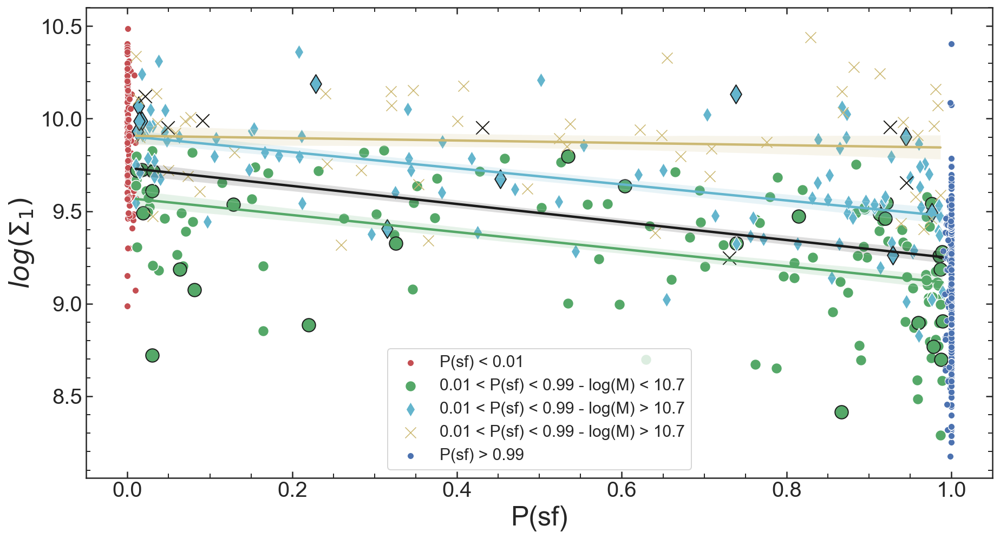

In [261]:
plt.figure(figsize = [15,8])

sea.scatterplot(Adb.query('sf_prob_mu < 0.01').sf_prob_mu, 
                Adb.query('sf_prob_mu < 0.01').log_Sigma1, color = 'r',
               label = 'P(sf) < 0.01')

sea.scatterplot(Ldb.query('0.01 < sf_prob_mu < 0.99').sf_prob_mu, 
                Ldb.query('0.01 < sf_prob_mu < 0.99').log_Sigma1, color = 'g',
               label = '0.01 < P(sf) < 0.99 - log(M) < 10.7', s=100)

sea.scatterplot(Ldb.query('0.01 < sf_prob_mu < 0.99 and scl_tq < 0.23').sf_prob_mu, 
                Ldb.query('0.01 < sf_prob_mu < 0.99 and scl_tq < 0.23').log_Sigma1, color = 'g',
                edgecolor = 'k', s=150)

sea.scatterplot(Hdb.query('0.01 < sf_prob_mu < 0.99').sf_prob_mu, 
                Hdb.query('0.01 < sf_prob_mu < 0.99').log_Sigma1, color = 'c',
               label = '0.01 < P(sf) < 0.99 - log(M) > 10.7', marker = 'd', s=100)

sea.scatterplot(Hdb.query('0.01 < sf_prob_mu < 0.99 and scl_tq < 0.23').sf_prob_mu, 
                Hdb.query('0.01 < sf_prob_mu < 0.99 and scl_tq < 0.23').log_Sigma1, color = 'c',
                marker = 'd', edgecolor = 'k', s=150)

sea.scatterplot(Xdb.query('0.01 < sf_prob_mu < 0.99').sf_prob_mu, 
                Xdb.query('0.01 < sf_prob_mu < 0.99').log_Sigma1, color = 'y',
               label = '0.01 < P(sf) < 0.99 - log(M) > 10.7', marker = 'x', s=100)

sea.scatterplot(Xdb.query('0.01 < sf_prob_mu < 0.99 and scl_tq < 0.23').sf_prob_mu, 
                Xdb.query('0.01 < sf_prob_mu < 0.99 and scl_tq < 0.23').log_Sigma1, color = 'k',
                marker = 'x', edgecolor = 'k', s=150)

sea.scatterplot(Adb.query('sf_prob_mu >0.99').sf_prob_mu, 
                Adb.query('sf_prob_mu >0.99').log_Sigma1, color = 'b',
               label = 'P(sf) > 0.99')

sea.regplot(Ldb.query('0.01 < sf_prob_mu < 0.99').sf_prob_mu, 
                Ldb.query('0.01 < sf_prob_mu < 0.99').log_Sigma1, color = 'g',scatter=False,ci=68)

sea.regplot(Hdb.query('0.01 < sf_prob_mu < 0.99').sf_prob_mu, 
                Hdb.query('0.01 < sf_prob_mu < 0.99').log_Sigma1, color = 'c',scatter=False,ci=68)

sea.regplot(Xdb.query('0.01 < sf_prob_mu < 0.99').sf_prob_mu, 
                Xdb.query('0.01 < sf_prob_mu < 0.99').log_Sigma1, color = 'y',scatter=False,ci=68)

sea.regplot(Adb.query('0.01 < sf_prob_mu < 0.99').sf_prob_mu, 
                Adb.query('0.01 < sf_prob_mu < 0.99').log_Sigma1, color = 'k',scatter=False,ci=68)

plt.xlabel('P(sf)', fontsize = 25)
plt.ylabel('$log(\Sigma_1)$', fontsize = 25)
plt.legend(fontsize = 15);
plt.tick_params(axis='both', which='major', labelsize=20)
plt.savefig('../plots/evolution_plots/PSF_Xsig1.png', bbox_inches = 'tight')    

/Users/Vince.ec/miniconda3/envs/astroconda3.6/lib/python3.6/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/Vince.ec/miniconda3/envs/astroconda3.6/lib/python3.6/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Users/Vince.ec/miniconda3/envs/astroconda3.6/lib/python3.6/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt 

(0.0, 1.0)

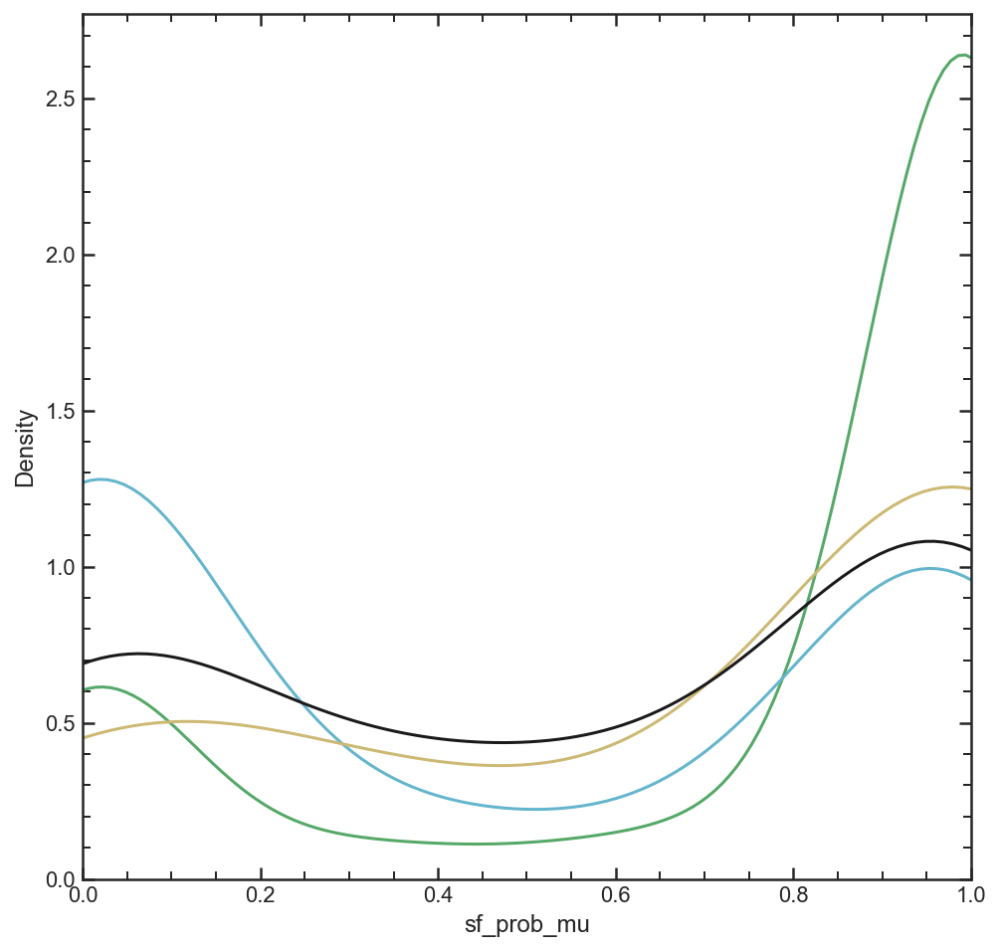

In [266]:
plt.figure(figsize = [8,8])

sea.distplot(Ldb.sf_prob_mu, color = 'g', hist = False)
sea.distplot(Hdb.sf_prob_mu, color = 'c', hist = False)
sea.distplot(LXdb.sf_prob_mu, color = 'y', hist = False)
sea.distplot(HXdb.sf_prob_mu, color = 'k', hist = False)
plt.xlim(0,1)

/Users/Vince.ec/miniconda3/envs/astroconda3.6/lib/python3.6/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/Vince.ec/miniconda3/envs/astroconda3.6/lib/python3.6/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/Vince.ec/miniconda3/envs/astroconda3.6/lib/python3.6/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

(0.0, 1.0)

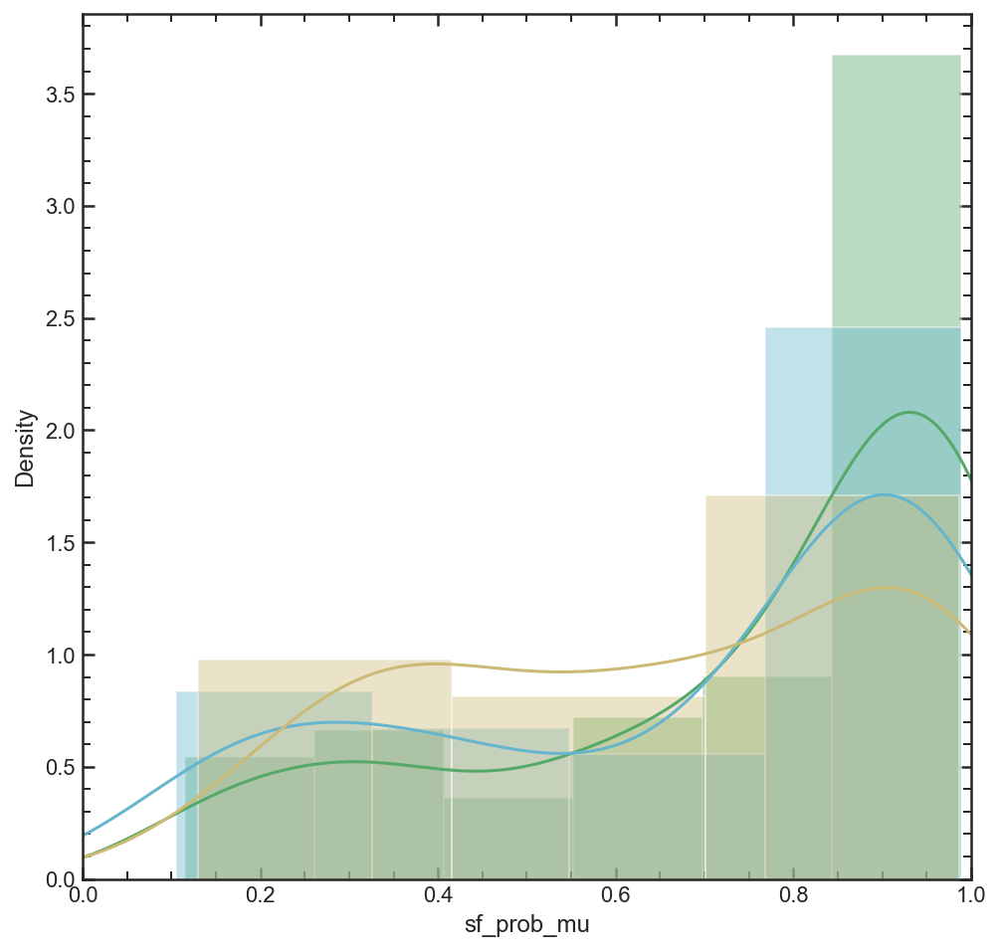

In [293]:
plt.figure(figsize = [8,8])

sea.distplot(Ldb.query('0.1 < sf_prob_mu < 0.99').sf_prob_mu, color = 'g', hist = True)
sea.distplot(Hdb.query('0.1 < sf_prob_mu < 0.99').sf_prob_mu, color = 'c', hist = True)
sea.distplot(Xdb.query('0.1 < sf_prob_mu < 0.99').sf_prob_mu, color = 'y', hist = True)
plt.xlim(0,1)

In [821]:
import h5py
f = h5py.File('/Users/Vince.ec/Downloads/cutout_2.hdf5', 'r')

In [825]:
list(f.keys())

['Header', 'PartType4']

<AxesSubplot:xlabel='log_ssfr', ylabel='lwa'>

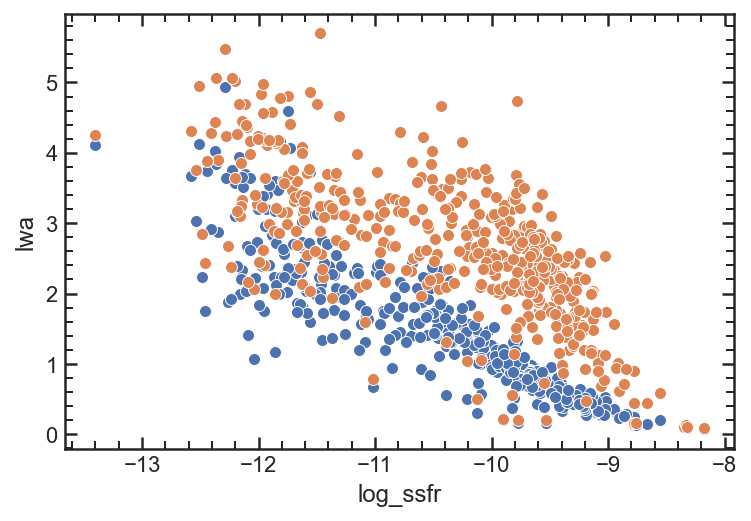

In [200]:
sea.scatterplot(Adb.log_ssfr, Adb.lwa)
sea.scatterplot(Adb.log_ssfr, Adb.t_50)

In [230]:
# mb = multifit.MultiBeam('/Volumes/Vince_CLEAR/RELEASE_v2.1.0/BEAMS/ERSPRIME/ERSPRIME_39170.beams.fits',**args)

def edit_img(fl, ID):
    mb = multifit.MultiBeam(fl,**args)

    ### step 1 isolate
    iso = np.array(mb.beams[0].beam.direct*(mb.beams[0].beam.seg == ID))


    ### step 2 zoom in
    ziso = iso[59:99,59:99]


    ### step 3 get 3% and 97% - tiles
    llim = np.percentile(ziso[ziso != 0], 3)
    hlim = np.percentile(ziso[ziso != 0], 97)
    
    ### step 4 cap lower and under values
    ziso[ziso < llim] = llim
    ziso[ziso > hlim] = hlim
    
    hlim -= llim

    ### step 5 set lower to 0 

    for i in range(len(ziso)):
        for ii in range(len(ziso[0])):
            if ziso[i][ii] != 0:
                ziso[i][ii] -= llim

    ### step 6 set top to 1
    ziso /= hlim
    return ziso

load_master_fits: /Volumes/Vince_CLEAR/RELEASE_v2.1.0/BEAMS/ERSPRIME/ERSPRIME_39170.beams.fits
1 icxt20f7q_flt.fits G102
2 icxt20f8q_flt.fits G102
3 icxt20fbq_flt.fits G102
4 icxt20fdq_flt.fits G102
5 icxt21b7q_flt.fits G102
6 icxt21b8q_flt.fits G102
7 icxt21bcq_flt.fits G102
8 icxt21beq_flt.fits G102
9 icxt19o6q_flt.fits G102
10 icxt19o7q_flt.fits G102
11 icxt19oaq_flt.fits G102
12 icxt19ocq_flt.fits G102
13 icxt22pmq_flt.fits G102
14 icxt22pnq_flt.fits G102
15 icxt22pqq_flt.fits G102
16 icxt22psq_flt.fits G102
17 icxt23pvq_flt.fits G102
18 icxt23pwq_flt.fits G102
19 icxt23pzq_flt.fits G102
20 icxt23q1q_flt.fits G102
21 ibhj23sxq_flt.fits G141
22 ibhj23t4q_flt.fits G141
23 ibhj23tbq_flt.fits G141
24 ibhj23tiq_flt.fits G141


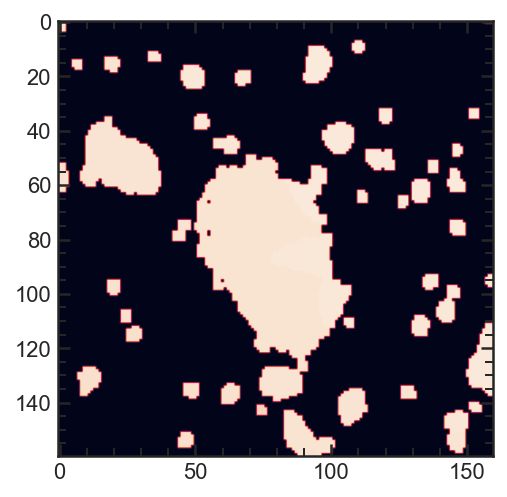

In [413]:
mb = multifit.MultiBeam('/Volumes/Vince_CLEAR/RELEASE_v2.1.0/BEAMS/ERSPRIME/ERSPRIME_39170.beams.fits',**args)

plt.imshow(mb.beams[0].beam.seg)

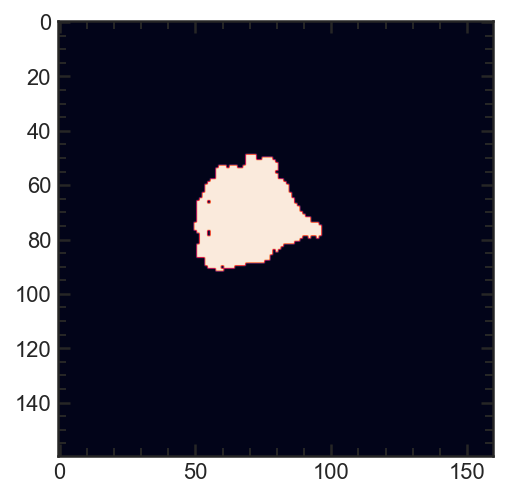

In [414]:
plt.imshow(mb.beams[0].beam.seg*(mb.beams[0].beam.seg == 39170))

In [226]:
Adb.query('Re > 20')[['field', 'id']]

,field,id
382,GSD,49100
408,GSD,43727


In [227]:
field = 'GSD'
gid = 43727
fl = glob('/Volumes/Vince_CLEAR/RELEASE_v2.1.0/BEAMS/*{}*/*{}*'.format(field[1], gid))

In [228]:
fl[0]

'/Volumes/Vince_CLEAR/RELEASE_v2.1.0/BEAMS/GS2/GS2_43727.beams.fits'

load_master_fits: /Volumes/Vince_CLEAR/RELEASE_v2.1.0/BEAMS/GS2/GS2_43727.beams.fits
1 ibhj03xoq_flt.fits G141
2 ibhj03xvq_flt.fits G141
3 ibhj03y2q_flt.fits G141
4 ibhj03y9q_flt.fits G141
5 icxt03jjq_flt.fits G102
6 icxt03jkq_flt.fits G102
7 icxt03jnq_flt.fits G102
8 icxt03jpq_flt.fits G102
9 icxt04e3q_flt.fits G102
10 icxt04e4q_flt.fits G102
11 icxt04edq_flt.fits G102
12 icxt04efq_flt.fits G102
13 icxt01cgq_flt.fits G102
14 icxt01ciq_flt.fits G102
15 icxt01clq_flt.fits G102
16 icxt01cnq_flt.fits G102
17 icxt02c7q_flt.fits G102
18 icxt02caq_flt.fits G102
19 icxt02cdq_flt.fits G102
20 icxt02cfq_flt.fits G102
21 icxt05h7q_flt.fits G102
22 icxt05h9q_flt.fits G102
23 icxt05hcq_flt.fits G102
24 icxt05heq_flt.fits G102
25 icxt06laq_flt.fits G102
26 icxt06lcq_flt.fits G102
27 icxt06lfq_flt.fits G102
28 icxt06lhq_flt.fits G102


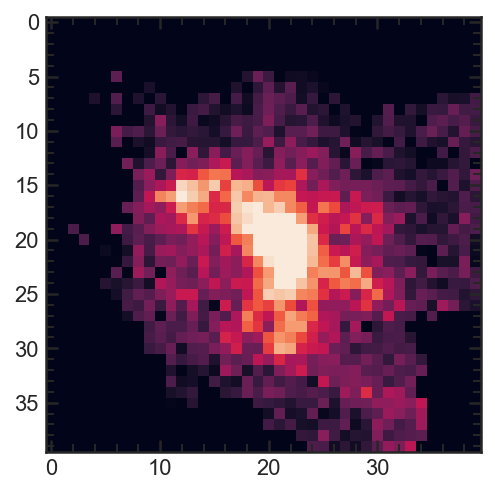

In [232]:
ziso = edit_img(fl[0], gid)
plt.imshow(ziso)

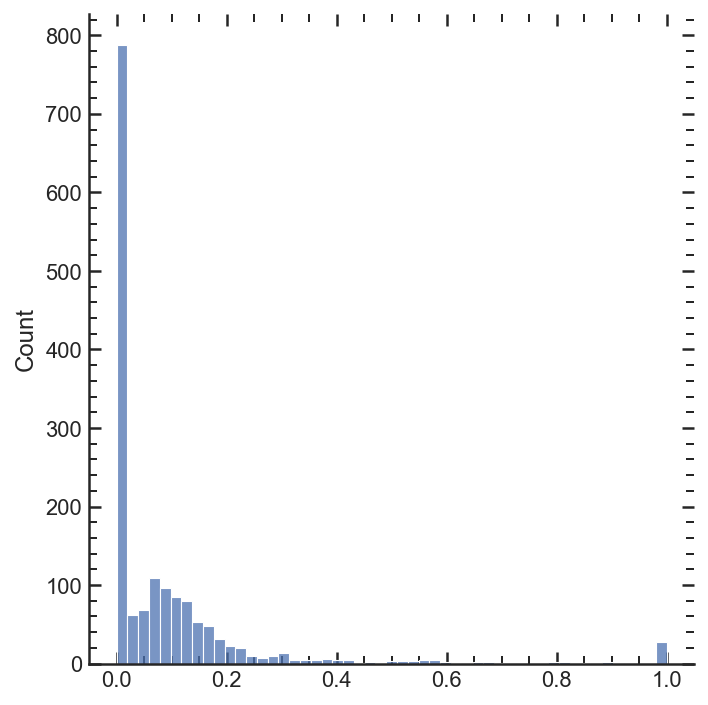

In [199]:
sea.displot(ziso.ravel())

In [233]:
pdb = Adb.sort_values('sf_prob_ml', ascending = False)
pdb.reset_index(drop=True, inplace=True)

In [253]:

def Leave_one_out_STACK_img(img_g):
    
    Y = np.sum(img_g, axis = 0)

    weights = np.zeros_like(img_g)
    for i in range(len(img_g)):
        igrid = []
        for ii in range(len(igrid)):
            if i != ii:
                igrid.append(img_g[ii])
        Ybar =  np.sum(igrid, axis = 0)
        weights[i] = np.abs(Ybar - Y) / Y
    return weights

In [309]:
idx = 0
# def stack_img(DB):
DB = pdb.query('{} < index < {}'.format(0 + idx,100 + idx))

img = np.zeros([40,40])
for i in DB.index:
    img += np.load('../plots/evolution_plots/morph_gif/{}-{}.npy'.format(DB.field[i], DB.id[i]))
    


([], [])

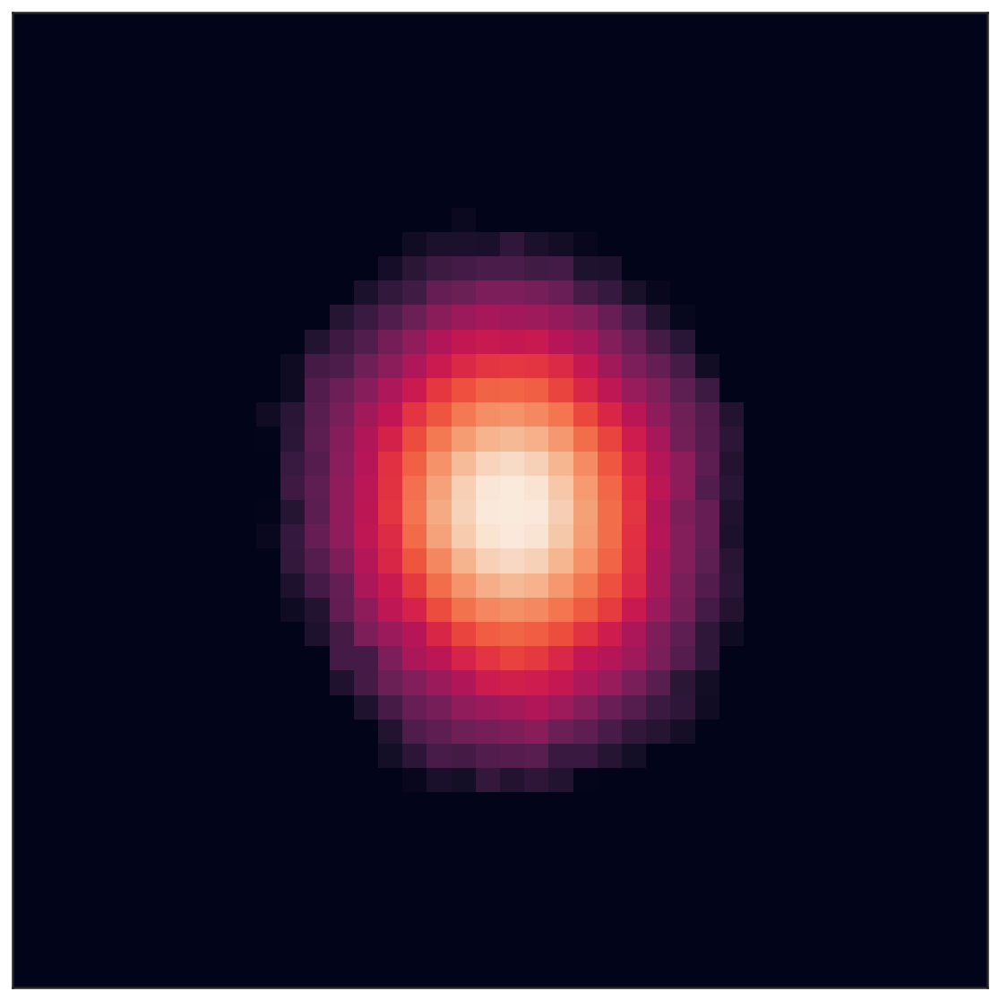

In [313]:
plt.figure(figsize = [10,10])
plt.imshow(np.arcsinh(img), vmin = 2)
plt.xticks([])
plt.yticks([])

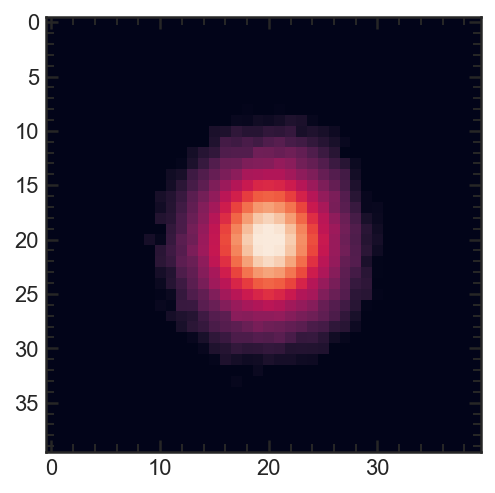

In [306]:
plt.imshow(np.arcsinh(img), vmin = 2)

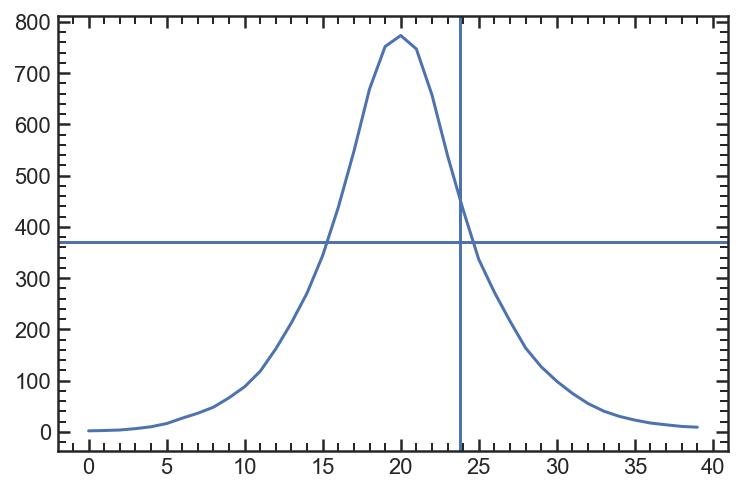

In [311]:
plt.plot(np.sum(img, axis = 1))
# plt.plot(np.sum(img.T, axis = 1))
plt.axhline(max(d1)/2)
plt.axvline(23.78)

In [312]:
d1 = np.sum(img, axis = 1)
pix = np.arange(len(d1))
up = int(pix[d1 == max(d1)])

id1 = interp1d(d1[up:], pix[up:])
print(max(d1))
print(pix[d1 == max(d1)])
print(id1(max(d1) / 2))

773.2151792059777
[20]
24.477977069018976


In [314]:
import imageio
from pygifsicle import optimize

frames_path = "../plots/evolution_plots/morph_gif/morph_{i}.png"

n = len(glob('../plots/evolution_plots/morph_gif/*png'))
with imageio.get_writer('../plots/evolution_plots/morph_gif/morph_gif.gif', mode='I') as writer:
    for i in range(n):
        writer.append_data(imageio.imread(frames_path.format(i=i)))

optimize('../plots/evolution_plots/morph_gif/morph_gif.gif')

<AxesSubplot:xlabel='concen', ylabel='z50'>

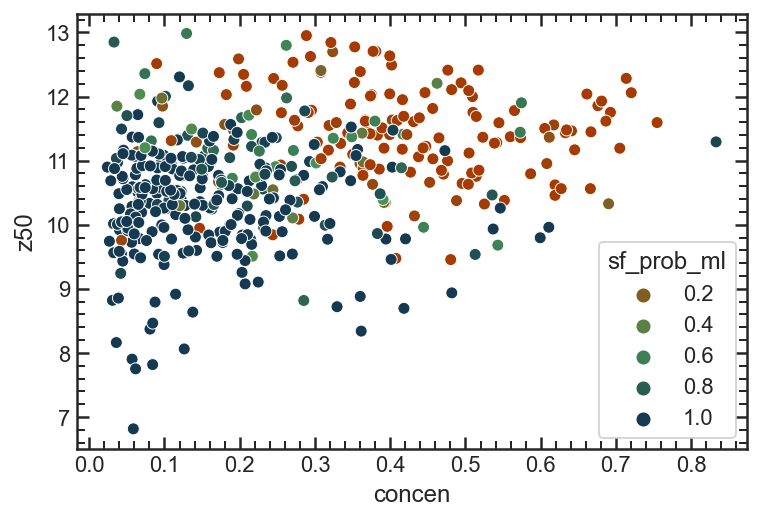

In [318]:
sea.scatterplot(Adb.concen, Adb.z50, hue = Adb.sf_prob_ml, palette=CMAP)

<AxesSubplot:xlabel='concen', ylabel='log_Sigma1'>

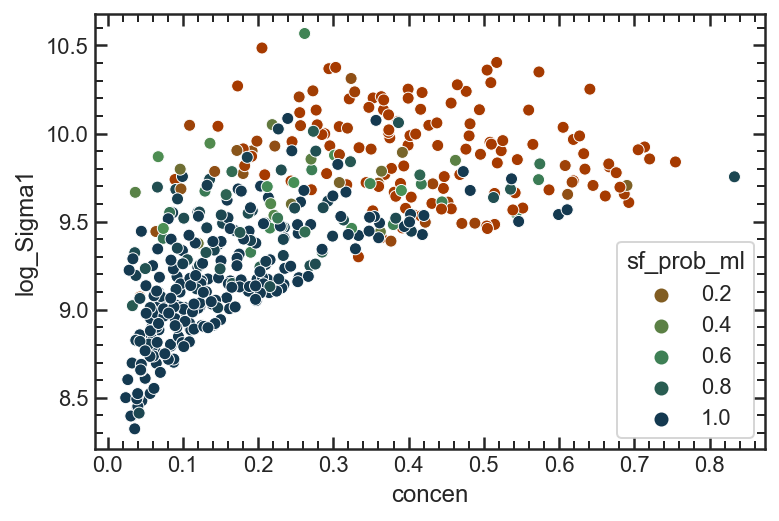

In [319]:
sea.scatterplot(Adb.concen, Adb.log_Sigma1, hue = Adb.sf_prob_ml, palette=CMAP)

In [354]:
LSdb = pd.read_pickle('../dataframes/fitdb/Ifit_LsSFR_imp_db.pkl')


In [355]:
stats.norm.fit(LSdb.log_ssfr)

(-12.14271722517417, 0.6216418860317565)

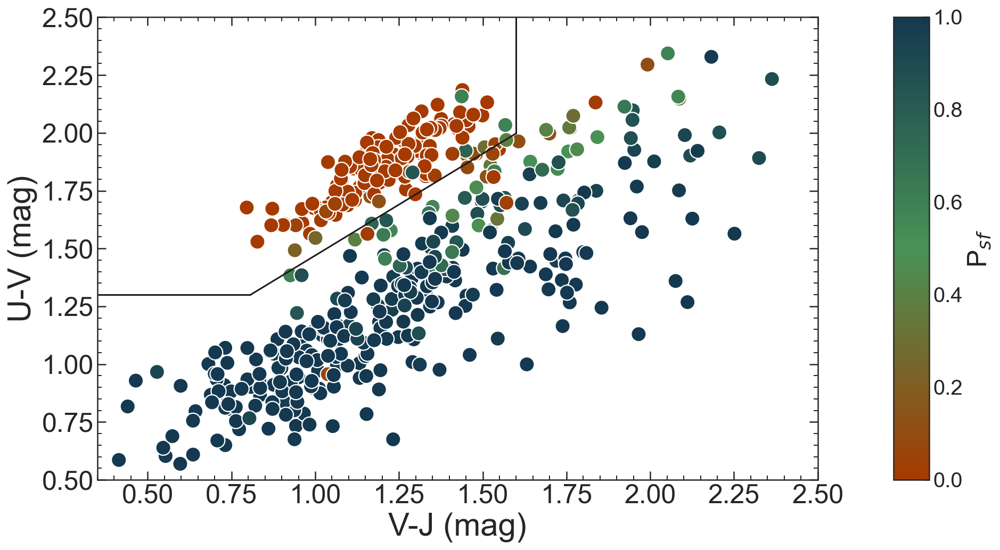

In [370]:
UVy = np.linspace(0,2.5)
VJx = np.linspace(-1,2.5)

iUVJ = interp1d(VJx, 0.88 * VJx +0.59)
invUVJ = interp1d(0.88 * VJx +0.59, VJx)

gs = gridspec.GridSpec(1,2,width_ratios=[20,1])

plt.figure(figsize = [14, 8])
ax1 = plt.subplot(gs[0])
ax8 = plt.subplot(gs[1])

ax1.plot([-1,invUVJ(1.3)],[1.3,1.3], color = 'k')
ax1.plot([1.6,1.6],[iUVJ(1.6),2.7], color = 'k')
ax1.plot([invUVJ(1.3),1.6],[1.3,iUVJ(1.6)], color = 'k')

sea.scatterplot(Adb.VJ, Adb.UV, hue = Adb.sf_prob_ml, palette=CMAP, legend = False, s =200, ax=ax1)

ax1.set_xlabel('V-J (mag)', fontsize=30)

ax1.set_ylabel('U-V (mag)', fontsize=30)


ax1.tick_params(axis='both', which='major', labelsize=25, length = 8)
ax1.set_xlim(0.35, 2.5)
ax1.set_ylim(0.5, 2.5)


norm = mpl.colors.Normalize(vmin=0, vmax=1)

mpl.colorbar.ColorbarBase(ax8, cmap=CMAP,
                                norm=norm,
                                orientation='vertical')
ax8.set_ylabel('P$_{sf}$', fontsize = 25)
ax8.tick_params(axis='both', which='major', labelsize=20)
ax8.yaxis.set_ticks_position("right")
ax8.yaxis.set_label_position("right")

plt.savefig('../plots/evolution_plots/UVJ_comp.png', bbox_inches = 'tight')    

In [232]:
gids = [13453,14281,15876,21683,24345,36102,36161,38102,29730,38785,42201]
rmgids = [15998,16072,19319,23520,34708,9594,24062,21814,46924]

Adb = Adb.query('id != [15998,16072,19319,23520,34708,9594,24062,46924]')

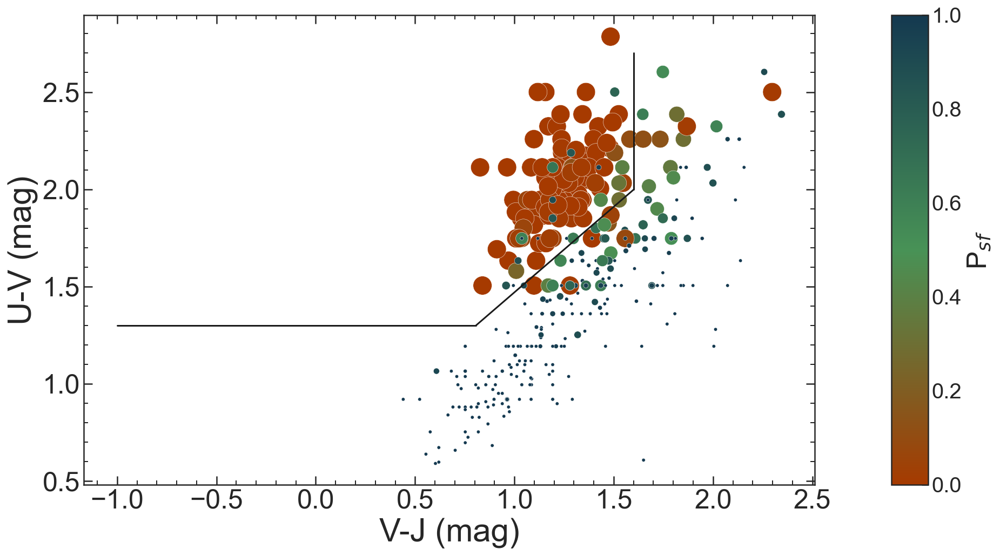

In [242]:
UVy = np.linspace(0,2.5)
VJx = np.linspace(-1,2.5)

iUVJ = interp1d(VJx, 0.88 * VJx +0.59)
invUVJ = interp1d(0.88 * VJx +0.59, VJx)

gs = gridspec.GridSpec(1,2,width_ratios=[20,1])

plt.figure(figsize = [14, 8])
ax1 = plt.subplot(gs[0])
ax8 = plt.subplot(gs[1])

ax1.plot([-1,invUVJ(1.3)],[1.3,1.3], color = 'k')
ax1.plot([1.6,1.6],[iUVJ(1.6),2.7], color = 'k')
ax1.plot([invUVJ(1.3),1.6],[1.3,iUVJ(1.6)], color = 'k')

sea.scatterplot(Adb.VJ, Adb.UV, hue = Adb.sf_prob_ml, palette=CMAP, legend = False, size = 1 - Adb.sf_prob_ml, size_norm=(0,1), sizes = (10,300), ax=ax1)

ax1.set_xlabel('V-J (mag)', fontsize=30)

ax1.set_ylabel('U-V (mag)', fontsize=30)


ax1.tick_params(axis='both', which='major', labelsize=25, length = 8)
# ax1.set_xlim(0.35, 2.5)
# ax1.set_ylim(0.5, 2.9)


norm = mpl.colors.Normalize(vmin=0, vmax=1)

mpl.colorbar.ColorbarBase(ax8, cmap=CMAP,
                                norm=norm,
                                orientation='vertical')
ax8.set_ylabel('P$_{sf}$', fontsize = 25)
ax8.tick_params(axis='both', which='major', labelsize=20)
ax8.yaxis.set_ticks_position("right")
ax8.yaxis.set_label_position("right")

# plt.savefig('../plots/evolution_plots/UVJ_comp.png', bbox_inches = 'tight')    

In [4]:
Adb.query('id == 13453').index[0]

222

Text(0.5, 1.0, 'GN-15876, z = 0.849, log(sSFR) = -9.59, log(M/M$_\\odot$) = 10.29')

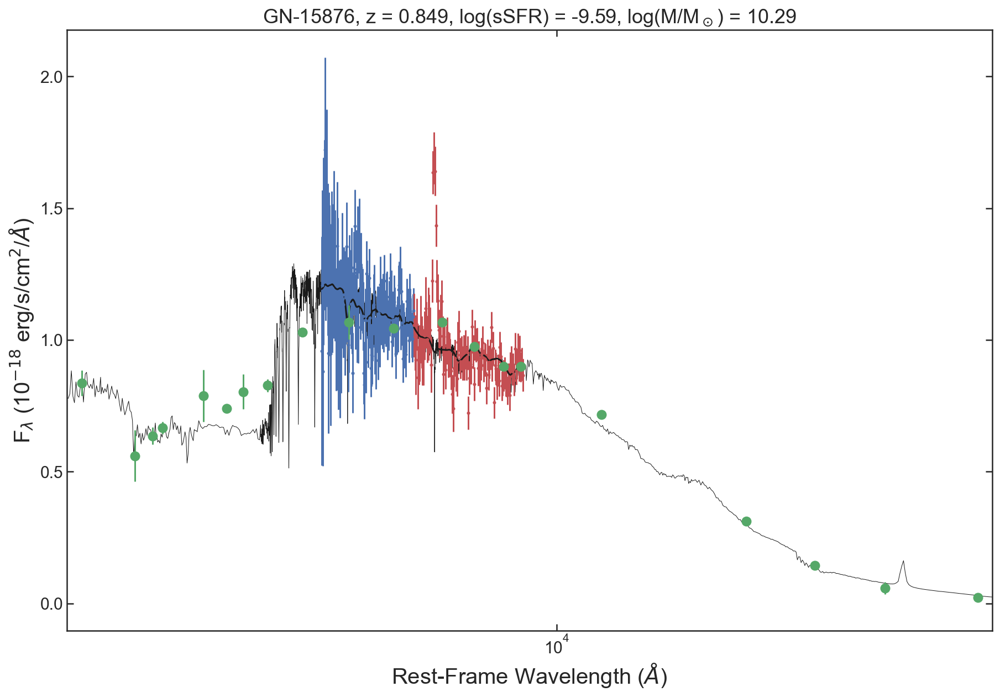

In [33]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
# gids = [13453,14281,15876,21683,24345,36102,36161,38102,29730,38785,42201]
#29730, 14281, 15876
i=Adb.query('id == 15876').index[0]

plt.figure(figsize = [15,10])
gids = Adb.id[i]
ax1 = plt.subplot()

fld = Adb.query('id == {}'.format(gids)).field.values[0]
gal = Adb.query('id == {}'.format(gids)).id.values[0]
lssfr = Adb.query('id == {}'.format(gids)).log_ssfr.values[0]
lmass = Adb.query('id == {}'.format(gids)).lmass.values[0]

sp = np.load('../full_specs/{}_{}_fullspec.npy'.format(fld, gal), allow_pickle=True).item()
rshift = Adb.query('field == "{}" and id == {}'.format(fld, gal)).zgrism.values[0]

if len(sp['Bwv']) > 0:
    IDX = [U for U in range(len(sp['Bwv'])) if 8200 < sp['Bwv'][U] < 15000]
    ax1.errorbar(sp['Bwv'][IDX]/(1+rshift), sp['Bfl'][IDX]*1E18, sp['Ber'][IDX]*1E18, fmt = 'bo' ,markersize=2)
    ax1.plot(sp['Bwv'][IDX]/(1+rshift), sp['Bmfl'][IDX]*1E18, 'k',
             label = '{}{}-{}, z = {:1.3f}\nlog(sSFR) = {:1.2f}'.format(fld[0], fld[1], gal, rshift, lssfr))

if len(sp['Rwv']) > 0:
    ax1.errorbar(sp['Rwv']/(1+rshift), sp['Rfl']*1E18, sp['Rer']*1E18, fmt = 'ro' ,markersize=2)
    ax1.plot(sp['Rwv']/(1+rshift), sp['Rmfl']*1E18, 'k')


ax1.plot(sp['wave'], sp['flam']*1E18,'k', linewidth = 0.5,zorder = 0)
ax1.errorbar(sp['Pwv']/(1+rshift), sp['Pfl']*1E18, sp['Per']*1E18, fmt = 'go', markersize = 8, zorder=10)

# t= ax1.text(0.03,0.92, tags[i], fontsize = 15, color = 'w',transform=ax1.transAxes)
# t.set_bbox(dict(facecolor='k', alpha=0.5, edgecolor='k'))

ax1.set_xlim(0.95 * min(sp['Pwv']/(1+rshift)), 1.05 * max(sp['Pwv']/(1+rshift)))
#     ax1.legend(fontsize = 15)
ax1.set_xlabel(r'Rest-Frame Wavelength ($\AA$)',size=20)
ax1.set_ylabel(r'F$_\lambda$ (10$^{-18}$ erg/s/cm$^2$/$\AA$)',size=20)
ax1.tick_params(axis='both', which='major', labelsize=15)
ax1.set_xscale('log')
ax1.minorticks_off()
ax1.set_title('{}{}-{}, z = {:1.3f}, log(sSFR) = {:1.2f}, log(M/M$_\odot$) = {:1.2f}'.format(fld[0], fld[1], gal, rshift, lssfr, lmass),
             fontsize = 18)


In [221]:
print(Adb.query('sf_prob_ml < 0.1 and UV < 1.25')[['field','id','sf_prob_ml', 'nUV', 'nU', 'nV']])

    field     id  sf_prob_ml  nUV  nU  nV
922   GSD  46924    0.065622  1.0  12  32


In [211]:
m1=-2.5*np.log10(int(1))
m2=-2.5*np.log10(int(8))
print(m2-m1)

-2.257724967479859


In [212]:
def Color(band1, band2):
    m1=-2.5*np.log10(band1)
    m2=-2.5*np.log10(band2)
    return m1-m2

In [213]:
UV = []
VJ = []

for i in Adb.index: 
    UV.append(Color(Adb.nU[i], Adb.nV[i]))
    VJ.append(Color(Adb.nV[i], Adb.nJ[i]))   

In [216]:
Adb['UV'] = UV
Adb['VJ'] = VJ

<AxesSubplot:xlabel='VJ', ylabel='UV'>

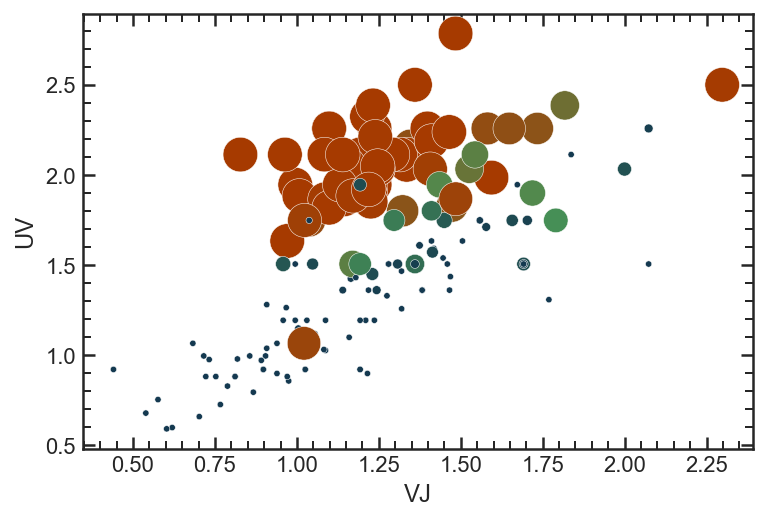

In [217]:
sea.scatterplot(Adb.query('field == "GSD"').VJ, Adb.query('field == "GSD"').UV, hue = Adb.query('field == "GSD"').sf_prob_ml, 
                palette=CMAP, legend = False, size = 1 - Adb.query('field == "GSD"').sf_prob_ml, size_norm=(0,1), sizes = (10,300),)


<AxesSubplot:xlabel='nVJ', ylabel='nUV'>

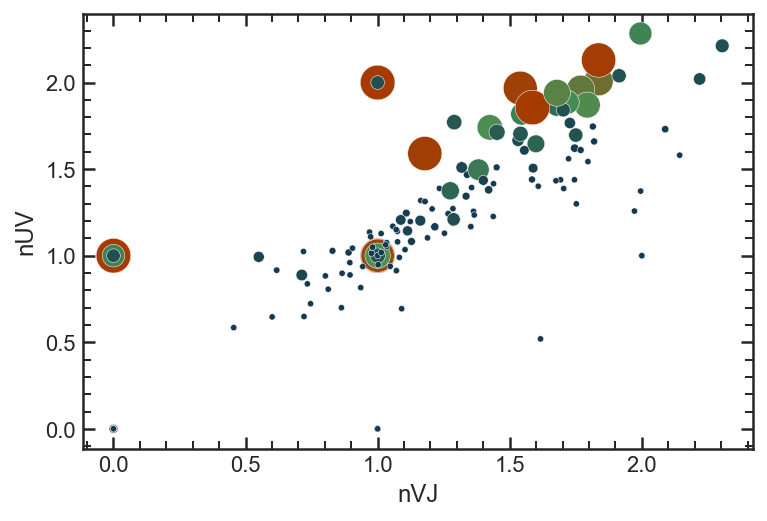

In [205]:
sea.scatterplot(Adb.query('field == "GND"').nVJ, Adb.query('field == "GND"').nUV, hue = Adb.query('field == "GND"').sf_prob_ml, 
                palette=CMAP, legend = False, size = 1 - Adb.query('field == "GND"').sf_prob_ml, size_norm=(0,1), sizes = (10,300),)

<AxesSubplot:>

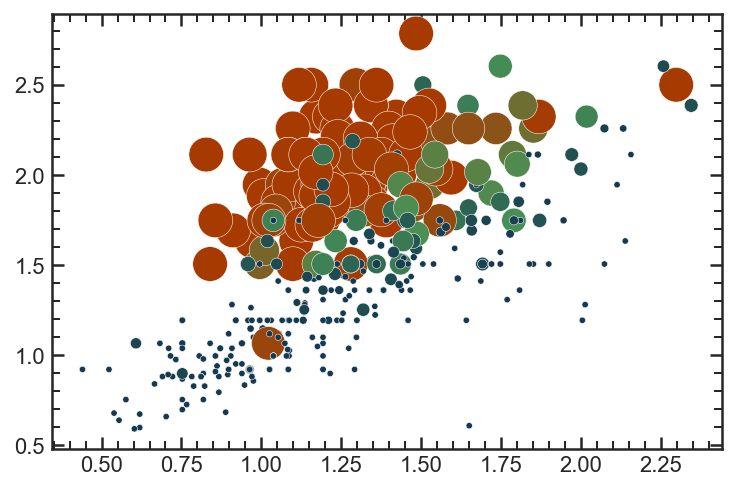

In [215]:
sea.scatterplot(VJ, UV, hue = Adb.sf_prob_ml, 
                palette=CMAP, legend = False, size = 1 - Adb.sf_prob_ml, size_norm=(0,1), sizes = (10,300),)

In [359]:
def Color(band1, band2):
    m1=-2.5*np.log10(band1)
    m2=-2.5*np.log10(band2)
    return m1-m2

UV = []
VJ = []

for i in Adb.index:
    if Adb.field[i] == 'GND':
        UV.append(Color(v4N.query('id == {}'.format(Adb.id[i])).restU.values[0], v4N.query('id == {}'.format(Adb.id[i])).restV.values[0]))
        VJ.append(Color(v4N.query('id == {}'.format(Adb.id[i])).restV.values[0], v4N.query('id == {}'.format(Adb.id[i])).restJ.values[0])) 
        
    if Adb.field[i] == 'GSD':
        UV.append(Color(v4S.query('id == {}'.format(Adb.id[i])).restU.values[0], v4S.query('id == {}'.format(Adb.id[i])).restV.values[0]))
        VJ.append(Color(v4S.query('id == {}'.format(Adb.id[i])).restV.values[0], v4S.query('id == {}'.format(Adb.id[i])).restJ.values[0])) 

Adb['VJ'] = VJ
Adb['UV'] = UV

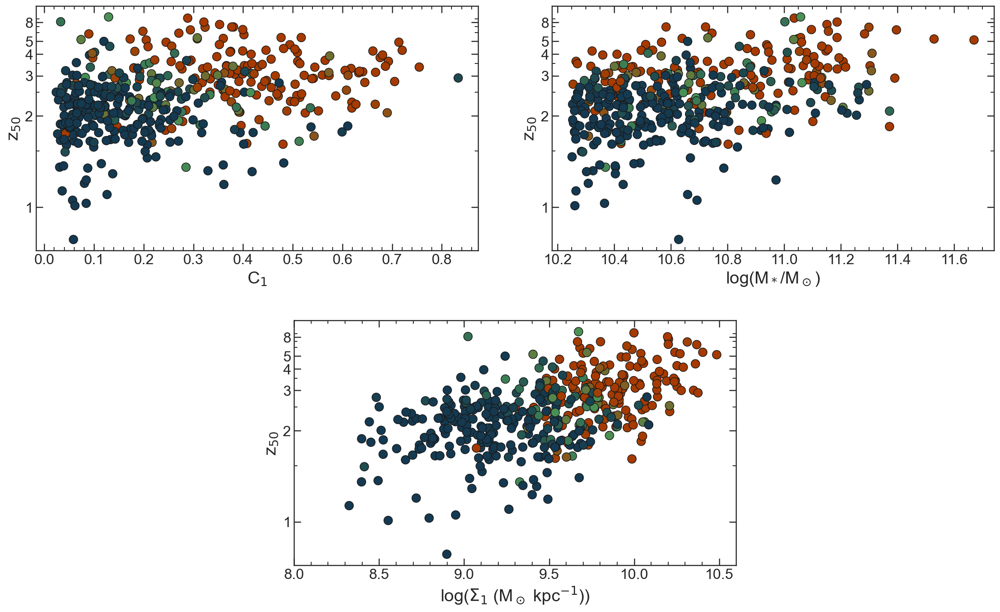

In [374]:
plt.figure(figsize=[20,12])
gs = gridspec.GridSpec(4,4, wspace = 0.4, hspace = 0.8)

ax1 = plt.subplot(gs[0:2,0:2])
ax2 = plt.subplot(gs[0:2,2:4])
ax3 = plt.subplot(gs[2:4,1:3])

sea.scatterplot(Adb.concen, Adb.z50, ax = ax1, hue = Adb.sf_prob_2.values, legend = False, 
                palette=CMAP, edgecolor = 'k', s=100)

sea.scatterplot(Adb.lmass, Adb.z50, ax = ax2, hue = Adb.sf_prob_2.values, legend = False, 
                palette=CMAP, edgecolor = 'k', s=100)

sea.scatterplot(Adb.log_Sigma1, Adb.z50, ax = ax3, hue = Adb.sf_prob_2.values, legend = False, 
                palette=CMAP, edgecolor = 'k', s=100)

ax1.set_ylabel('z$_{50}$', fontsize=20)
ax1.set_xlabel('C$_1$', fontsize=20)
ax2.set_ylabel('z$_{50}$', fontsize=20)
ax2.set_xlabel('log(M$_*$/M$_\odot$)', fontsize=20)
ax3.set_ylabel('z$_{50}$', fontsize=20)
ax3.set_xlabel('log($\Sigma_1$ (M$_\odot$ kpc$^{-1}$))', fontsize=20)

ax1.tick_params(axis='both', which='major', labelsize=17, length = 8)
ax2.tick_params(axis='both', which='major', labelsize=17, length = 8)
ax3.tick_params(axis='both', which='major', labelsize=17, length = 8)

ax1.set_yticks(cosmo.lookback_time([1,2,3,4,5,8]).value)
ax1.set_yticklabels([1,2,3,4,5,8])
ax1.set_yticks(cosmo.lookback_time([1.5,2.5,3.5,4.,6,7,9]).value, minor = True)
ax2.set_yticks(cosmo.lookback_time([1,2,3,4,5,8]).value)
ax2.set_yticklabels([1,2,3,4,5,8])
ax2.set_yticks(cosmo.lookback_time([1.5,2.5,3.5,4.,6,7,9]).value, minor = True)
ax3.set_yticks(cosmo.lookback_time([1,2,3,4,5,8]).value)
ax3.set_yticklabels([1,2,3,4,5,8])
ax3.set_yticks(cosmo.lookback_time([1.5,2.5,3.5,4.,6,7,9]).value, minor = True)

ax3.set_xlim(8,10.6)

plt.savefig('../plots/research_update/morph_z50.png', bbox_inches = 'tight')    

In [380]:
lsfr = np.log10(10**Adb.log_ssfr * 10**Adb.lmass)

(8.0, 10.6)

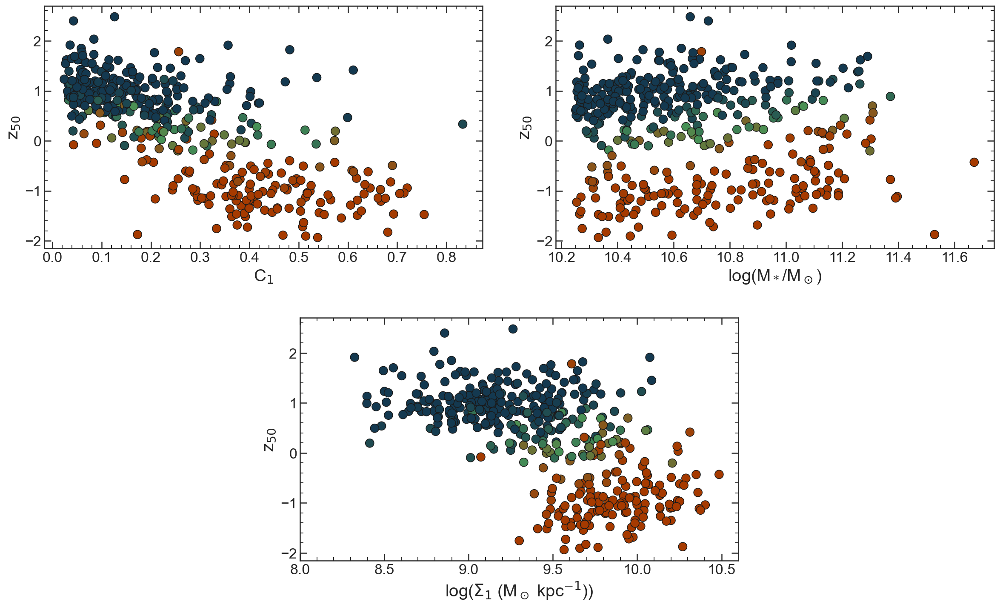

In [381]:
plt.figure(figsize=[20,12])
gs = gridspec.GridSpec(4,4, wspace = 0.4, hspace = 0.8)

ax1 = plt.subplot(gs[0:2,0:2])
ax2 = plt.subplot(gs[0:2,2:4])
ax3 = plt.subplot(gs[2:4,1:3])

sea.scatterplot(Adb.concen, lsfr, ax = ax1, hue = Adb.sf_prob_2.values, legend = False, 
                palette=CMAP, edgecolor = 'k', s=100)

sea.scatterplot(Adb.lmass, lsfr, ax = ax2, hue = Adb.sf_prob_2.values, legend = False, 
                palette=CMAP, edgecolor = 'k', s=100)

sea.scatterplot(Adb.log_Sigma1, lsfr, ax = ax3, hue = Adb.sf_prob_2.values, legend = False, 
                palette=CMAP, edgecolor = 'k', s=100)

ax1.set_ylabel('z$_{50}$', fontsize=20)
ax1.set_xlabel('C$_1$', fontsize=20)
ax2.set_ylabel('z$_{50}$', fontsize=20)
ax2.set_xlabel('log(M$_*$/M$_\odot$)', fontsize=20)
ax3.set_ylabel('z$_{50}$', fontsize=20)
ax3.set_xlabel('log($\Sigma_1$ (M$_\odot$ kpc$^{-1}$))', fontsize=20)

ax1.tick_params(axis='both', which='major', labelsize=17, length = 8)
ax2.tick_params(axis='both', which='major', labelsize=17, length = 8)
ax3.tick_params(axis='both', which='major', labelsize=17, length = 8)

# ax1.set_yticks(cosmo.lookback_time([1,2,3,4,5,8]).value)
# ax1.set_yticklabels([1,2,3,4,5,8])
# ax1.set_yticks(cosmo.lookback_time([1.5,2.5,3.5,4.,6,7,9]).value, minor = True)
# ax2.set_yticks(cosmo.lookback_time([1,2,3,4,5,8]).value)
# ax2.set_yticklabels([1,2,3,4,5,8])
# ax2.set_yticks(cosmo.lookback_time([1.5,2.5,3.5,4.,6,7,9]).value, minor = True)
# ax3.set_yticks(cosmo.lookback_time([1,2,3,4,5,8]).value)
# ax3.set_yticklabels([1,2,3,4,5,8])
# ax3.set_yticks(cosmo.lookback_time([1.5,2.5,3.5,4.,6,7,9]).value, minor = True)

ax3.set_xlim(8,10.6)

# plt.savefig('../plots/research_update/morph_z50.png', bbox_inches = 'tight')    

In [415]:
Rdb = pd.read_csv('/Users/Vince.ec/Downloads/output_data.csv')

In [429]:
err = []

for i in Rdb.index:
    hdr = adb.query('id == {}'.format(Rdb.gid[i]))['t_50_hdr'].values[0]
    val = adb.query('id == {}'.format(Rdb.gid[i]))['t_50'].values[0]
    lerr = val - hdr[0]
    herr = hdr[1] - val
    
    err.append((lerr + herr)/2)

In [431]:
np.save('../data/t50_errs',[Rdb.gid.values, err])

In [ ]:
11460, 27795, 40270, 30006, 21615, 15493, 45068, 36964, 37745, 29098,12979, 44020, 36136, 41755, 20801, 12674, 25745, 
13429, 26698, 10639, 30053, 18558, 32275, 11279, 36433, 45492

In [253]:
ls ../data/B_sfh/*11460*


../data/B_sfh/GND_11460.npy


In [254]:
adb.query('id == 11460')

,AGN,Av,Av_hdr,Av_modality,Ra,Ra_f125,Ra_f125_sig,Ra_f160,Ra_f160_sig,Ra_nsig,...,sf_prob_16,sf_prob_84,lbt,Ha_EW,Ha_EW_sig,scl_tq,sf_prob_LM,sf_prob_HM,sf_prob_cont_all,sf_prob_cont
267,AGN,1.054936,"[0.9112855437795013, 1.1086076606731674]",[0.0],0.13983,0.13983,0.001255,0.129678,0.001053,0.008483,...,0.984155,1.0,5.434912,-99.0,-99.0,0.544291,0.997057,1.0,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.998244


In [257]:
ls ../data/posteriors/*27795*

../data/posteriors/GSD_27795_SFfit_Pa.npy
../data/posteriors/GSD_27795_SFfit_Pba.npy
../data/posteriors/GSD_27795_SFfit_Pbb.npy
../data/posteriors/GSD_27795_SFfit_Pbl.npy
../data/posteriors/GSD_27795_SFfit_Pbp1.npy
../data/posteriors/GSD_27795_SFfit_Pd.npy
../data/posteriors/GSD_27795_SFfit_Plm.npy
../data/posteriors/GSD_27795_SFfit_Plwa.npy
../data/posteriors/GSD_27795_SFfit_Pm.npy
../data/posteriors/GSD_27795_SFfit_Pm1.npy
../data/posteriors/GSD_27795_SFfit_Pm2.npy
../data/posteriors/GSD_27795_SFfit_Pm3.npy
../data/posteriors/GSD_27795_SFfit_Pm4.npy
../data/posteriors/GSD_27795_SFfit_Pm5.npy
../data/posteriors/GSD_27795_SFfit_Pm6.npy
../data/posteriors/GSD_27795_SFfit_Pra.npy
../data/posteriors/GSD_27795_SFfit_Prb.npy
../data/posteriors/GSD_27795_SFfit_Prl.npy
../data/posteriors/GSD_27795_SFfit_Prp1.npy
../data/posteriors/GSD_27795_SFfit_p1.npy
../data/posteriors/GSD_27795_SFfit_p1_Pa.npy
../data/posteriors/GSD_27795_SFfit_p1_Pba.npy
../data/posteriors/GSD_27795_SFfit_p1_Pbb.npy
../d

In [264]:
for i in adb.index:
    if not os.path.isfile('../data/B_sfh/{}_{}_16.npy'.format(adb.field[i], adb.id[i])):
        print(adb.field[i], adb.id[i])
        if os.path.isfile(pos_path + '{}_{}_tabfit.npy'.format(adb.field[i], adb.id[i])):
            print(adb.field[i], adb.id[i])
            
#             if len(glob(pos_path + '{}_{}_tabfit*'.format(adb.field[i], adb.id[i]))) > 0:

#                 fit_dict = {}
#                 params = ['m', 'a', 'm1', 'm2', 'm3', 'm4', 'm5', 'm6', 'm7', 'm8', 'm9', 'm10', 'lm',
#                           'z', 'd', 'bp1', 'rp1', 'ba', 'bb', 'bl', 'ra', 'rb', 'rl']
#                 P_params = ['Pm', 'Pa', 'Pm1', 'Pm2', 'Pm3', 'Pm4', 'Pm5', 'Pm6', 'Pm7', 'Pm8', 'Pm9', 'Pm10', 'Plm',
#                           'Pz', 'Pd', 'Pbp1', 'Prp1', 'Pba', 'Pbb', 'Pbl', 'Pra', 'Prb', 'Prl']

#                 bf_params = ['bfm', 'bfa', 'bfm1', 'bfm2', 'bfm3', 'bfm4', 'bfm5', 'bfm6', 'bfm7', 'bfm8', 'bfm9', 'bfm10', 'bflm',
#                           'bfz', 'bfd', 'bfbp1', 'bfrp1', 'bfba', 'bfbb', 'bfbl', 'bfra', 'bfrb', 'bfrl']

#                 for ii in range(len(params)):
#                     t,pt = np.load( pos_path + '{}_{}_tabfit_{}.npy'.format(adb.field[i], adb.id[i], P_params[ii]) )
#                     fit_dict[params[ii]] = t
#                     fit_dict[P_params[ii]] = pt

#                 bfits = np.load('../data/bestfits/{}_{}_tabfit_bfit.npy'.format(adb.field[i], adb.id[i]))

#                 for x in range(len(bf_params)):
#                     fit_dict[bf_params[x]] = bfits[x]

#                 np.save(pos_path + '{}_{}_tabfit'.format(adb.field[i], adb.id[i]),fit_dict)
                
                
        if os.path.isfile(pos_path + '{}_{}_SFfit_p1.npy'.format(adb.field[i], adb.id[i])):
            print(adb.field[i], adb.id[i])
            
#             if len(glob(pos_path + '{}_{}_SFfit_p1*'.format(adb.field[i], adb.id[i]))) > 0:
                
#                 fit_dict = {}
#                 params = ['m', 'a', 'm1', 'm2', 'm3', 'm4', 'm5', 'm6', 'lm', 'd', 'bp1', 'rp1', 'ba', 'bb', 'bl', 'ra', 'rb', 'rl']
#                 P_params = ['Pm', 'Pa', 'Pm1', 'Pm2', 'Pm3', 'Pm4', 'Pm5', 'Pm6', 'Plm', 'Pd', 
#                             'Pbp1', 'Prp1', 'Pba', 'Pbb', 'Pbl', 'Pra', 'Prb', 'Prl']
#                 bf_params = ['bfm', 'bfa', 'bfm1', 'bfm2', 'bfm3', 'bfm4', 'bfm5', 'bfm6', 
#                             'bflm', 'bfd', 'bfbp1', 'bfrp1', 'bfba', 'bfbb', 'bfbl', 'bfra', 'bfrb', 'bfrl']

#                 for ii in range(len(params)):
#                     t,pt = np.load( pos_path + '{}_{}_SFfit_p1_{}.npy'.format(adb.field[i], adb.id[i], P_params[ii]) )
#                     fit_dict[params[ii]] = t
#                     fit_dict[P_params[ii]] = pt

#                 bfits = np.load('../data/bestfits/{}_{}_SFfit_p1_bfit.npy'.format(adb.field[i], adb.id[i]))

#                 for x in range(len(bf_params)):
#                     fit_dict[bf_params[x]] = bfits[x]

#                 np.save(pos_path + '{}_{}_SFfit_p1'.format(adb.field[i], adb.id[i]),fit_dict)
                